# Imports and Functions

## Imports

In [ ]:
!pip install pca

In [ ]:
# importing packages
import pandas as pd
import glob
import numpy as np
import scipy as sp
from scipy.stats import kurtosis, skew
# Importing matplotlib to plot the graphs.
import matplotlib.pyplot as plt
from datetime import datetime, date, time, timezone
from natsort import index_natsorted
from sklearn.decomposition import PCA as sklPCA
from scipy.fft import fft, fftfreq, rfft, rfftfreq
from pca import pca as betterPCA

import seaborn as sns

## Old Functions

In [ ]:
def rms(array):
  return np.sqrt(np.mean(array**2))

In [ ]:
def computeRMS(df, filename):
  # For the df given, index = filename, column = channel
  index = [filename]
  columns = range(0,df.shape[1])

  result = pd.DataFrame(columns = columns,
                        index = index)

  for i in range(0,df.shape[1]):
    data = rms(df.iloc[:,i])
    result.loc[filename,i] = data


  return result

In [ ]:
def computeFilesRMS(path, amount = -1):
  # First get the files
  folder_path = path
  file_list = glob.glob(folder_path + "/*")

  filenames = []
  for filepath in file_list:
    filenames.append(filepath.split("/")[-1])

  print("Progress: Done loading files")

  # Do the task for the first file
  df = pd.DataFrame(pd.read_table(file_list[0], header = None))
  res = computeRMS(df, filename = filenames[0])


  # And then for the rest
  if (amount <0 or amount > len(file_list)):
    amount = len(file_list)
  print("Progress: {}/{}".format(1,amount))

  for i in range(1, amount):
    temp_df = computeRMS(
        pd.DataFrame(pd.read_table(file_list[i], header = None)),
        filename = filenames[i],
    )
    res = res.append(temp_df)
    print("Progress: {}/{}".format(i+1,amount))


  return res

## New Functions

In [ ]:
def computeRMSFFT(data, filename):
  # For the df given, index = filename, column = channel
  mean = rms(data.iloc[:])

  normalized_tone = np.int16((data / data.max()) * 32767)

  SAMPLE_RATE = len(data)
  DURATION = 1
  N = SAMPLE_RATE * DURATION

  yf = rfft(normalized_tone)
  xf = rfftfreq(N, 1 / SAMPLE_RATE)

  return mean, xf, yf

In [ ]:
def computeFilesRMSFFT(path, amount = -1, channel=1):
  channel = -1
  # First get the files
  folder_path = path
  file_list = glob.glob(folder_path + "/*")

  filenames = []
  for filepath in file_list:
    filenames.append(filepath.split("/")[-1])

  print("Progress: Done loading files")

  # Do the task for the first file
  df = pd.DataFrame(pd.read_table(file_list[0], header = None))
  df = df.iloc[:, channel]

  rms, xf, yf = computeRMSFFT(df, filename = filenames[0])


  res1 = pd.DataFrame(columns = ["RMS"], data=[rms])
  res2 = pd.DataFrame(columns = xf, data = [yf])


  # And then for the rest
  if (amount <0 or amount > len(file_list)):
    amount = len(file_list)
  print("Progress: {}/{}".format(1,amount))
  for i in range(1, amount):
    temp_df = pd.DataFrame(pd.read_table(file_list[i], header = None))
    temp_df = temp_df.iloc[:, channel]
    rms, xf, yf = computeRMSFFT(
        temp_df,
        filename = filenames[i],
    )
    temp_df2 = pd.DataFrame(columns = ["RMS"], data=[rms])

    res1 = res1.append(temp_df2, ignore_index = True)
    res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)

    print("Progress: {}/{}".format(i+1,amount))

  # Put everything together
  print(res1)
  print(res2)
  print("Progress: Wrapping up the results...")
  res = pd.concat([res1,res2],axis=1)

  return res

In [ ]:
def parseFilenameToDate(Filename):
  new_str = Filename.replace(".","/")
  dt = datetime.strptime(new_str, "%Y/%m/%d/%H/%M/%S")
  return dt

## Better Functions

In [ ]:
def speed_rms_from_acceleration(data, fs):
  """
  Data is an array like, fs the sampling frequency

  Data is assumed that is measured in g
  """
  # First center the data using the mean to cancel out gravity
  mean_values = data.mean()
  data = data - mean_values

  # Perform the operations
  G = 9.80665
  accel = G * data * 1000

  velocity = sp.integrate.cumulative_trapezoid(accel, dx = 1/fs, initial = 0)

  return rms(velocity)


In [ ]:
def computeRMSFFTbetter(data, filename):
  # For the df given, index = filename, column = channel
  SAMPLE_RATE = len(data)

  mean = speed_rms_from_acceleration(data.iloc[:], SAMPLE_RATE)

  normalized_tone = np.int16((data / data.max()) * 32767)

  DURATION = 1
  N = SAMPLE_RATE * DURATION

  yf = rfft(normalized_tone)
  xf = rfftfreq(N, 1 / SAMPLE_RATE)

  yf = np.abs(yf)

  columns = ["Filename", "RMS"]
  mean2 = pd.DataFrame(columns = columns, data = [[filename, mean]])

  return mean2, xf, yf

In [ ]:
def computeFilesRMSFFTbetter(path, amount = -1, channel=1):
  channel = channel - 1
  # First get the files
  folder_path = path
  file_list = glob.glob(folder_path + "/*")

  filenames = []
  for filepath in file_list:
    filenames.append(filepath.split("/")[-1])

  print("Progress: Done loading files")

  # Do the task for the first file
  df = pd.DataFrame(pd.read_table(file_list[0], header = None))
  df = df.iloc[:, channel]

  rms, xf, yf = computeRMSFFTbetter(df, filename = filenames[0])

  print(rms)

  res1 = rms
  res2 = pd.DataFrame(columns = xf, data = [yf])



  # And then for the rest
  if (amount <0 or amount > len(file_list)):
    amount = len(file_list)
  print("Progress: {}/{}".format(1,amount))
  for i in range(1, amount):
    temp_df = pd.DataFrame(pd.read_table(file_list[i], header = None))
    temp_df = temp_df.iloc[:, channel]
    rms, xf, yf = computeRMSFFTbetter(
        temp_df,
        filename = filenames[i],
    )
    temp_df2 = rms

    res1 = res1.append(temp_df2, ignore_index = True)
    res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)

    print("Progress: {}/{}".format(i+1,amount))

  # Put everything together
  print(res1)
  print(res2)
  print("Progress: Wrapping up the results...")
  res = pd.concat([res1,res2],axis=1)

  return res

### ISO criteria (RMS Peak)

In [ ]:
def fromRMStoMedium(value):
  if (value < 0.10):
    return "Good"
  if (value < 0.25):
    return "Satisfactory"
  if (value < 0.62):
    return "Unsatisfactory (alert)"
  else:
    return "Unacceptable (danger)"

In [ ]:
def fromRMStoSmall(value):
  if (value < 0.06):
    return "Good"
  if (value < 0.16):
    return "Satisfactory"
  if (value < 0.40):
    return "Unsatisfactory (alert)"
  else:
    return "Unacceptable (danger)"

In [ ]:
def fromRMStoExtraSmall(value):
  if (value < 0.02):
    return "Under 0.02"
  if (value < 0.04):
    return "Under 0.04"
  if (value < 0.06):
    return "Under 0.06"
  if (value < 0.07):
    return "Under 0.07"
  if (value < 0.08):
    return "Under 0.08"
  if (value < 0.09):
    return "Under 0.09"
  else:
    return "Others"

In [ ]:
def fromRMStoSmallMedium(value):
  if (value < 0.06):
    return "Very Good (0.06)"
  if (value < 0.10):
    return "Good"
  if (value < 0.16):
    return "Satisfactory"
  if (value < 0.25):
    return "Barely satisfactory"
  if (value < 0.40):
    return "Unsatisfactory (alert)"
  if (value < 0.62):
    return "Very Unsatisfactory (alert)"
  else:
    return "Unacceptable (danger)"

In [ ]:
def tokenizeRMS(column):
  """Transforms a column of a df into a tokenized column, according to ISO-10816"""
  # Extra detail for Small Machines
  #result = column.apply(fromRMStoExtraSmall)

  # For Small Machine Class I
  #result = column.apply(fromRMStoSmall)

  # For Medium Machine Class II
  #result = column.apply(fromRMStoMedium)

  # Mix between Small and Medium (More Information)
  result = column.apply(fromRMStoSmallMedium)

  return result


### RMS Criteria (mm/s RMS)

In [ ]:
def new_fromRMStoMedium(value):
  if (value < 1.80):
    return "Good"
  if (value < 4.50):
    return "Satisfactory"
  if (value < 11.20):
    return "Unsatisfactory (alert)"
  else:
    return "Unacceptable (danger)"

In [ ]:
def new_tokenizeRMS(column):
  """
  Transforms a column of a df into a tokenized column
  according to ISO-10816, RMS mm/s
  """
  # For Medium Machine Class II
  result = column.apply(new_fromRMStoMedium)

  return result

# Testing the Functions
This can be left out of execution

In [ ]:
res = tokenizeRMS(Y)

NameError: ignored

In [ ]:
res

In [ ]:
test = pd.DataFrame(columns = range(0,5), data=[range(0,5)])
test

No se estánm guardando bien los valores, algo pasa con los indices y las columnas

In [ ]:
res = computeFilesRMSFFT('/content/drive/MyDrive/test1', amount= 10, channel = 1)

In [ ]:
res

In [ ]:
pd.DataFrame(columns = ["1","2"], data = [["filename", "mean"]])

In [ ]:
result = computeFilesRMSFFTbetter('/content/drive/MyDrive/test1', amount=10, channel = 5)

In [ ]:
result

# Compute Dataset
With the new function, calculate the dataset with all the info and save it in fftRMS-testX-CHY.csv

Only meant to be executed once

In [ ]:
result = computeFilesRMSFFT('/content/drive/MyDrive/test1', channel = 5)

Progress: Done loading files
Progress: 1/2156
Progress: 2/2156
Progress: 3/2156
Progress: 4/2156
Progress: 5/2156
Progress: 6/2156
Progress: 7/2156
Progress: 8/2156
Progress: 9/2156
Progress: 10/2156
Progress: 11/2156
Progress: 12/2156
Progress: 13/2156
Progress: 14/2156
Progress: 15/2156
Progress: 16/2156
Progress: 17/2156
Progress: 18/2156
Progress: 19/2156
Progress: 20/2156
Progress: 21/2156
Progress: 22/2156
Progress: 23/2156
Progress: 24/2156
Progress: 25/2156
Progress: 26/2156
Progress: 27/2156
Progress: 28/2156
Progress: 29/2156
Progress: 30/2156
Progress: 31/2156
Progress: 32/2156
Progress: 33/2156
Progress: 34/2156
Progress: 35/2156
Progress: 36/2156
Progress: 37/2156
Progress: 38/2156
Progress: 39/2156
Progress: 40/2156
Progress: 41/2156
Progress: 42/2156
Progress: 43/2156
Progress: 44/2156
Progress: 45/2156
Progress: 46/2156
Progress: 47/2156
Progress: 48/2156
Progress: 49/2156
Progress: 50/2156
Progress: 51/2156
Progress: 52/2156
Progress: 53/2156
Progress: 54/2156
Progress

In [ ]:
result

,RMS,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,...,10231.0,10232.0,10233.0,10234.0,10235.0,10236.0,10237.0,10238.0,10239.0,10240.0
0,0.138225,-1.320164e+08+0.000000e+00j,2.267193e+05+3.492255e+05j,-5.372242e+05+8.345162e+05j,4.627124e+05+4.350854e+05j,7.161997e+05+2.548038e+05j,-3.146691e+05-3.417337e+05j,2.586298e+05+5.232270e+05j,-3.102137e+05+6.166451e+04j,1.389008e+05+4.100760e+05j,...,7.525835e+04-2.110628e+05j,5.132010e+05-1.421360e+05j,-3.608279e+05-2.188815e+05j,-6.388837e+05-1.099816e+05j,-1.382270e+05-3.462524e+05j,2.926596e+05+2.897458e+05j,-5.947921e+04-3.178652e+05j,1.714152e+05-3.385819e+05j,9.770202e+05-5.705390e+03j,-1.885200e+04+0.000000e+00j
1,0.139235,-2.463488e+08+0.000000e+00j,5.260366e+05+3.054365e+06j,-5.871066e+04+1.171528e+06j,-6.997404e+05-6.503697e+05j,-3.972620e+04+1.684245e+06j,6.376800e+05-3.409928e+06j,-1.534492e+06+2.236007e+06j,-1.958197e+06-1.018546e+05j,1.952192e+06+2.910231e+05j,...,3.694629e+05-6.692712e+05j,8.444970e+05-1.060249e+06j,1.099228e+06+1.985630e+05j,4.795350e+05-9.865488e+05j,5.018513e+05+9.164628e+05j,2.739535e+05-9.727962e+05j,-2.930839e+05-1.231143e+05j,3.257458e+05-7.056920e+05j,5.238536e+04+4.922544e+05j,-5.410430e+05+0.000000e+00j
2,0.140671,-2.475478e+08+0.000000e+00j,4.187243e+05+1.654904e+06j,1.075200e+06+2.012796e+06j,8.881755e+05-4.017281e+04j,9.473356e+05+9.932215e+05j,-5.831764e+05-1.309747e+06j,1.374634e+06+1.756974e+06j,-4.198770e+05+2.537354e+06j,-1.690473e+06-9.024485e+05j,...,-8.090394e+04+9.968674e+05j,6.301113e+05-6.395115e+05j,-7.990921e+05+1.517553e+06j,-7.870040e+05-1.601000e+06j,-9.933685e+05-7.660512e+05j,8.258705e+05-1.734270e+05j,5.547238e+05+5.986004e+03j,-1.020586e+05-1.362620e+06j,-1.250184e+05+1.054643e+06j,-1.225527e+06+0.000000e+00j
3,0.138306,-2.511538e+08+0.000000e+00j,-8.346629e+05+8.734368e+05j,-3.673626e+06+2.909342e+06j,-2.012035e+06-7.558679e+05j,3.947376e+05+2.632572e+06j,-1.349124e+06-2.157026e+06j,1.112164e+06+2.263961e+06j,-1.395894e+04+2.749785e+06j,2.087713e+06-2.890959e+06j,...,-1.047973e+06+4.149062e+05j,-4.264944e+04+5.354798e+05j,3.248121e+05-1.680683e+05j,-1.099672e+06-5.765296e+05j,-1.305582e+06+6.427171e+03j,-4.463391e+05-5.028244e+05j,-6.425339e+05+9.464119e+05j,2.228605e+06+1.585528e+06j,7.701494e+05+3.266141e+05j,-2.556211e+06+0.000000e+00j
4,0.138224,-1.532273e+08+0.000000e+00j,-2.306992e+05+6.869863e+05j,-4.675913e+05+1.268478e+06j,1.099824e+06+4.811586e+05j,-2.109394e+05-4.020915e+04j,2.962057e+04-1.017574e+06j,5.831255e+05+5.227181e+05j,-4.468851e+05+9.516541e+04j,2.189730e+05+4.075994e+05j,...,-4.403080e+05-1.746236e+05j,4.542308e+04-2.597857e+05j,7.671318e+04-8.584797e+04j,7.372876e+04-3.701400e+05j,-4.274992e+05-1.701055e+05j,1.448685e+05+5.581256e+05j,-4.380619e+05-2.543993e+05j,-3.842282e+04-2.811174e+05j,6.803510e+05-3.134591e+05j,-1.969430e+05+0.000000e+00j
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2151,0.136956,-1.809671e+08+0.000000e+00j,-5.378152e+04+2.226614e+05j,-7.280349e+05+1.565110e+06j,1.299636e+06-2.667688e+05j,-2.744429e+05+2.292669e+05j,-9.252275e+05-3.871166e+05j,7.159328e+05+9.853898e+05j,8.802682e+05+3.163818e+05j,-8.167374e+04+1.036279e+05j,...,-5.076521e+05+2.376684e+05j,3.823929e+05-3.243680e+05j,-1.093773e+06+3.819820e+05j,4.136159e+05-2.999780e+04j,-8.910597e+05+5.587965e+05j,4.550578e+05-1.180985e+05j,1.114749e+05+4.589848e+05j,-4.584888e+05+1.145437e+06j,7.441250e+05+4.331863e+04j,-1.224216e+06+0.000000e+00j
2152,0.115042,-2.123740e+08+0.000000e+00j,-1.858666e+06+1.608982e+06j,-9.116272e+05+1.437034e+05j,2.407033e+05+2.129536e+06j,4.144186e+05+1.256570e+05j,1.340877e+06+1.987732e+05j,-5.321799e+05+6.273123e+05j,3.722453e+06+4.358515e+05j,-2.092663e+06+3.466365e+05j,...,-1.701906e+06+5.812286e+05j,5.314293e+05+1.702433e+06j,-3.808338e+05+3.759971e+05j,6.341197e+04+2.664031e+05j,-2.593325e+05+9.418442e+05j,1.300538e+06-1.598673e+06j,-1.158494e+05-9.855720e+05j,2.305115e+06+9.448481e+04j,-4.322500e+05+5.726942e+05j,8.858400e+05+0.000000e+00j
2153,0.115306

In [ ]:
result.to_csv("/content/drive/MyDrive/fftRMS-probandotest1.csv")

Same, but with the better function

In [ ]:
result = computeFilesRMSFFTbetter('/content/drive/MyDrive/3rd_test', channel = 3)
result.to_csv("/content/drive/MyDrive/fftRMS-test3-CH3-fixed.csv")

Progress: Done loading files
              Filename       RMS
0  2004.04.10.20.51.57  0.974655
Progress: 1/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 2/6324
Progress: 3/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4/6324
Progress: 5/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 6/6324
Progress: 7/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 8/6324
Progress: 9/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 10/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 11/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 12/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 13/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 14/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 15/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 16/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 17/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 18/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 19/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 20/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 21/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 22/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 23/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 24/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 25/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 26/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 27/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 28/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 29/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 30/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 31/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 32/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 33/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 34/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 35/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 36/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 37/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 38/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 39/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 40/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 41/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 42/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 43/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 44/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 45/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 46/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 47/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 48/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 49/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 50/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 51/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 52/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 53/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 54/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 55/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 56/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 57/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 58/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 59/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 60/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 61/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 62/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 63/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 64/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 65/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 66/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 67/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 68/6324
Progress: 69/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 70/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 71/6324
Progress: 72/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 73/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 74/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 75/6324
Progress: 76/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 77/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 78/6324
Progress: 79/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 80/6324
Progress: 81/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 82/6324
Progress: 83/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 84/6324
Progress: 85/6324

<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 86/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 87/6324
Progress: 88/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 89/6324
Progress: 90/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 91/6324
Progress: 92/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 93/6324
Progress: 94/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 95/6324
Progress: 96/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 97/6324
Progress: 98/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 99/6324
Progress: 100/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 101/6324
Progress: 102/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 103/6324
Progress: 104/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 105/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 106/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 107/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 108/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 109/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 110/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 111/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 112/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 113/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 114/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 115/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 116/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 117/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 118/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 119/6324
Progress: 120/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 121/6324
Progress: 122/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 123/6324
Progress: 124/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 125/6324
Progress: 126/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 127/6324
Progress: 128/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 129/6324
Progress: 130/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 131/6324
Progress: 132/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 133/6324
Progress: 134/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 135/6324
Progress: 136/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 137/6324
Progress: 138/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 139/6324
Progress: 140/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 141/6324
Progress: 142/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 143/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 144/6324
Progress: 145/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 146/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 147/6324
Progress: 148/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 149/6324
Progress: 150/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 151/6324
Progress: 152/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 153/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 154/6324
Progress: 155/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 156/6324
Progress: 157/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 158/6324
Progress: 159/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 160/6324
Progress: 161/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 162/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 163/6324
Progress: 164/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 165/6324
Progress: 166/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 167/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 168/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 169/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 170/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 171/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 172/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 173/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 174/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 175/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 176/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 177/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 178/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 179/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 180/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 181/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 182/6324
Progress: 183/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 184/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 185/6324
Progress: 186/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 187/6324
Progress: 188/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 189/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 190/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 191/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 192/6324
Progress: 193/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 194/6324
Progress: 195/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 196/6324
Progress: 197/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 198/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 199/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 200/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 201/6324
Progress: 202/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 203/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 204/6324
Progress: 205/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 206/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 207/6324
Progress: 208/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 209/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 210/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 211/6324
Progress: 212/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 213/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 214/6324
Progress: 215/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 216/6324
Progress: 217/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 218/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 219/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 220/6324
Progress: 221/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 222/6324
Progress: 223/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 224/6324
Progress: 225/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 226/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 227/6324
Progress: 228/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 229/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 230/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 231/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 232/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 233/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 234/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 235/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 236/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 237/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 238/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 239/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 240/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 241/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 242/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 243/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 244/6324
Progress: 245/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 246/6324
Progress: 247/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 248/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 249/6324
Progress: 250/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 251/6324
Progress: 252/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 253/6324
Progress: 254/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 255/6324
Progress: 256/6324

<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)



Progress: 257/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 258/6324
Progress: 259/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 260/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 261/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 262/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 263/6324
Progress: 264/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 265/6324
Progress: 266/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 267/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 268/6324
Progress: 269/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 270/6324
Progress: 271/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 272/6324
Progress: 273/6324
Progress: 274/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 275/6324
Progress: 276/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 277/6324
Progress: 278/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 279/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 280/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 281/6324
Progress: 282/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 283/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 284/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 285/6324
Progress: 286/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 287/6324
Progress: 288/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 289/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 290/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 291/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 292/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 293/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 294/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 295/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 296/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 297/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 298/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 299/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 300/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 301/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 302/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 303/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 304/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 305/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 306/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 307/6324
Progress: 308/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 309/6324
Progress: 310/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 311/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 312/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 313/6324
Progress: 314/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 315/6324
Progress: 316/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 317/6324
Progress: 318/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 319/6324
Progress: 320/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 321/6324
Progress: 322/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 323/6324
Progress: 324/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 325/6324
Progress: 326/6324

<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 327/6324
Progress: 328/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 329/6324
Progress: 330/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 331/6324
Progress: 332/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 333/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 334/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 335/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 336/6324
Progress: 337/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 338/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 339/6324
Progress: 340/6324

<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 341/6324
Progress: 342/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 343/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 344/6324
Progress: 345/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 346/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 347/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 348/6324
Progress: 349/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 350/6324
Progress: 351/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 352/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 353/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 354/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 355/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 356/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 357/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 358/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 359/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 360/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 361/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 362/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 363/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 364/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 365/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 366/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 367/6324
Progress: 368/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 369/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 370/6324
Progress: 371/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 372/6324
Progress: 373/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 374/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 375/6324
Progress: 376/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 377/6324
Progress: 378/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 379/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 380/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 381/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 382/6324
Progress: 383/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 384/6324
Progress: 385/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 386/6324
Progress: 387/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 388/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 389/6324
Progress: 390/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 391/6324
Progress: 392/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 393/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 394/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 395/6324
Progress: 396/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 397/6324
Progress: 398/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 399/6324
Progress: 400/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 401/6324
Progress: 402/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 403/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 404/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 405/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 406/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 407/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 408/6324
Progress: 409/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 410/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 411/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 412/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 413/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 414/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 415/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 416/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 417/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 418/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 419/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 420/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 421/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 422/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 423/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 424/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 425/6324
Progress: 426/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 427/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 428/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 429/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 430/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 431/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 432/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 433/6324
Progress: 434/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 435/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 436/6324
Progress: 437/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 438/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 439/6324
Progress: 440/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 441/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 442/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 443/6324
Progress: 444/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 445/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 446/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 447/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 448/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 449/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 450/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 451/6324
Progress: 452/6324

<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 453/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 454/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 455/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 456/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 457/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 458/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 459/6324
Progress: 460/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 461/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 462/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 463/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 464/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 465/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 466/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 467/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 468/6324
Progress: 469/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 470/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 471/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 472/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 473/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 474/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 475/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 476/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 477/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 478/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 479/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 480/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 481/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 482/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 483/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 484/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 485/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 486/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 487/6324
Progress: 488/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 489/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 490/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 491/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 492/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 493/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 494/6324
Progress: 495/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 496/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 497/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 498/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 499/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 500/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 501/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 502/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 503/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 504/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 505/6324
Progress: 506/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 507/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 508/6324
Progress: 509/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 510/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 511/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 512/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 513/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 514/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 515/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 516/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 517/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 518/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 519/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 520/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 521/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 522/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 523/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 524/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 525/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 526/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 527/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 528/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 529/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 530/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 531/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 532/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 533/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 534/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 535/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 536/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 537/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 538/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 539/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 540/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 541/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 542/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 543/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 544/6324
Progress: 545/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 546/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 547/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 548/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 549/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 550/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 551/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 552/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 553/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 554/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 555/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 556/6324
Progress: 557/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 558/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 559/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 560/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 561/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 562/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 563/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 564/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 565/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 566/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 567/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 568/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 569/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 570/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 571/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 572/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 573/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 574/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 575/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 576/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 577/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 578/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 579/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 580/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 581/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 582/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 583/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 584/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 585/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 586/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 587/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 588/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 589/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 590/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 591/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 592/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 593/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 594/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 595/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 596/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 597/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 598/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 599/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 600/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 601/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 602/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 603/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 604/6324
Progress: 605/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 606/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 607/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 608/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 609/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 610/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 611/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 612/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 613/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 614/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 615/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 616/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 617/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 618/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 619/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 620/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 621/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 622/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 623/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 624/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 625/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 626/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 627/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 628/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 629/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 630/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 631/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 632/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 633/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 634/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 635/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 636/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 637/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 638/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 639/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 640/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 641/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 642/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 643/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 644/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 645/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 646/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 647/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 648/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 649/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 650/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 651/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 652/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 653/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 654/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 655/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 656/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 657/6324
Progress: 658/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 659/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 660/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 661/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 662/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 663/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 664/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 665/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 666/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 667/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 668/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 669/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 670/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 671/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 672/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 673/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 674/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 675/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 676/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 677/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 678/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 679/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 680/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 681/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 682/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 683/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 684/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 685/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 686/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 687/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 688/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 689/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 690/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 691/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 692/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 693/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 694/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 695/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 696/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 697/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 698/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 699/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 700/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 701/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 702/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 703/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 704/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 705/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 706/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 707/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 708/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 709/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 710/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 711/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 712/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 713/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 714/6324
Progress: 715/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 716/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 717/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 718/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 719/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 720/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 721/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 722/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 723/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 724/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 725/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 726/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 727/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 728/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 729/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 730/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 731/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 732/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 733/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 734/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 735/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 736/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 737/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 738/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 739/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 740/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 741/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 742/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 743/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 744/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 745/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 746/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 747/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 748/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 749/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 750/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 751/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 752/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 753/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 754/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 755/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 756/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 757/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 758/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 759/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 760/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 761/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 762/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 763/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 764/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 765/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 766/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 767/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 768/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 769/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 770/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 771/6324
Progress: 772/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 773/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 774/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 775/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 776/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 777/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 778/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 779/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 780/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 781/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 782/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 783/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 784/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 785/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 786/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 787/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 788/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 789/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 790/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 791/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 792/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 793/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 794/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 795/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 796/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 797/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 798/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 799/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 800/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 801/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 802/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 803/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 804/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 805/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 806/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 807/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 808/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 809/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 810/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 811/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 812/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 813/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 814/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 815/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 816/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 817/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 818/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 819/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 820/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 821/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 822/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 823/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 824/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 825/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 826/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 827/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 828/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 829/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 830/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 831/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 832/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 833/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 834/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 835/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 836/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 837/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 838/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 839/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 840/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 841/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 842/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 843/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 844/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 845/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 846/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 847/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 848/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 849/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 850/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 851/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 852/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 853/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 854/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 855/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 856/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 857/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 858/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 859/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 860/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 861/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 862/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 863/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 864/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 865/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 866/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 867/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 868/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 869/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 870/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 871/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 872/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 873/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 874/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 875/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 876/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 877/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 878/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 879/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 880/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 881/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 882/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 883/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 884/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 885/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 886/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 887/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 888/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 889/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 890/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 891/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 892/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 893/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 894/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 895/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 896/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 897/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 898/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 899/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 900/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 901/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 902/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 903/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 904/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 905/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 906/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 907/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 908/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 909/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 910/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 911/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 912/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 913/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 914/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 915/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 916/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 917/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 918/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 919/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 920/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 921/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 922/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 923/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 924/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 925/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 926/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 927/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 928/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 929/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 930/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 931/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 932/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 933/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 934/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 935/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 936/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 937/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 938/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 939/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 940/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 941/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 942/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 943/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 944/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 945/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 946/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 947/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 948/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 949/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 950/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 951/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 952/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 953/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 954/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 955/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 956/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 957/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 958/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 959/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 960/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 961/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 962/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 963/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 964/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 965/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 966/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 967/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 968/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 969/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 970/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 971/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 972/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 973/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 974/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 975/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 976/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 977/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 978/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 979/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 980/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 981/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 982/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 983/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 984/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 985/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 986/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 987/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 988/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 989/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 990/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 991/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 992/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 993/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 994/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 995/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 996/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 997/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 998/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 999/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1000/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1001/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1002/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1003/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1004/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1005/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1006/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1007/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1008/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1009/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1010/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1011/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1012/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1013/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1014/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1015/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1016/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1017/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1018/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1019/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1020/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1021/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1022/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1023/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1024/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1025/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1026/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1027/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1028/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1029/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1030/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1031/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1032/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1033/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1034/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1035/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1036/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1037/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1038/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1039/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1040/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1041/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1042/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1043/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1044/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1045/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1046/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1047/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1048/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1049/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1050/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1051/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1052/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1053/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1054/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1055/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1056/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1057/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1058/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1059/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1060/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1061/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1062/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1063/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1064/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1065/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1066/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1067/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1068/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1069/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1070/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1071/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1072/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1073/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1074/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1075/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1076/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1077/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1078/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1079/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1080/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1081/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1082/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1083/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1084/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1085/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1086/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1087/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1088/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1089/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1090/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1091/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1092/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1093/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1094/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1095/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1096/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1097/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1098/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1099/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1100/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1101/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1102/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1103/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1104/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1105/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1106/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1107/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1108/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1109/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1110/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1111/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1112/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1113/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1114/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1115/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1116/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1117/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1118/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1119/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1120/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1121/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1122/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1123/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1124/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1125/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1126/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1127/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1128/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1129/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1130/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1131/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1132/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1133/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1134/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1135/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1136/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1137/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1138/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1139/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1140/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1141/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1142/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1143/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1144/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1145/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1146/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1147/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1148/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1149/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1150/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1151/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1152/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1153/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1154/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1155/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1156/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1157/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1158/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1159/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1160/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1161/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1162/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1163/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1164/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1165/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1166/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1167/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1168/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1169/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1170/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1171/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1172/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1173/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1174/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1175/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1176/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1177/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1178/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1179/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1180/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1181/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1182/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1183/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1184/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1185/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1186/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1187/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1188/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1189/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1190/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1191/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1192/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1193/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1194/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1195/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1196/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1197/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1198/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1199/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1200/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1201/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1202/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1203/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1204/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1205/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1206/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1207/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1208/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1209/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1210/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1211/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1212/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1213/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1214/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1215/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1216/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1217/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1218/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1219/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1220/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1221/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1222/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1223/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1224/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1225/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1226/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1227/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1228/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1229/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1230/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1231/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1232/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1233/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1234/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1235/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1236/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1237/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1238/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1239/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1240/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1241/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1242/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1243/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1244/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1245/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1246/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1247/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1248/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1249/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1250/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1251/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1252/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1253/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1254/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1255/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1256/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1257/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1258/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1259/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1260/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1261/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1262/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1263/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1264/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1265/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1266/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1267/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1268/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1269/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1270/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1271/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1272/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1273/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1274/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1275/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1276/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1277/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1278/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1279/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1280/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1281/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1282/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1283/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1284/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1285/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1286/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1287/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1288/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1289/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1290/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1291/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1292/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1293/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1294/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1295/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1296/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1297/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1298/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1299/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1300/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1301/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1302/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1303/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1304/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1305/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1306/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1307/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1308/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1309/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1310/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1311/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1312/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1313/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1314/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1315/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1316/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1317/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1318/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1319/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1320/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1321/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1322/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1323/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1324/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1325/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1326/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1327/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1328/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1329/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1330/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1331/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1332/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1333/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1334/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1335/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1336/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1337/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1338/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1339/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1340/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1341/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1342/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1343/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1344/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1345/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1346/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1347/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1348/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1349/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1350/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1351/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1352/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1353/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1354/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1355/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1356/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1357/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1358/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1359/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1360/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1361/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1362/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1363/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1364/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1365/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1366/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1367/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1368/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1369/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1370/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1371/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1372/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1373/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1374/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1375/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1376/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1377/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1378/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1379/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1380/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1381/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1382/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1383/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1384/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1385/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1386/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1387/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1388/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1389/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1390/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1391/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1392/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1393/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1394/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1395/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1396/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1397/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1398/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1399/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1400/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1401/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1402/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1403/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1404/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1405/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1406/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1407/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1408/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1409/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1410/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1411/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1412/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1413/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1414/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1415/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1416/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1417/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1418/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1419/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1420/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1421/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1422/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1423/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1424/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1425/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1426/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1427/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1428/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1429/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1430/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1431/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1432/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1433/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1434/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1435/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1436/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1437/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1438/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1439/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1440/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1441/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1442/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1443/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1444/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1445/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1446/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1447/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1448/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1449/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1450/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1451/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1452/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1453/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1454/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1455/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1456/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1457/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1458/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1459/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1460/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1461/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1462/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1463/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1464/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1465/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1466/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1467/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1468/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1469/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1470/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1471/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1472/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1473/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1474/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1475/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1476/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1477/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1478/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1479/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1480/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1481/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1482/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1483/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1484/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1485/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1486/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1487/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1488/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1489/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1490/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1491/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1492/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1493/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1494/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1495/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1496/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1497/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1498/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1499/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1500/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1501/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1502/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1503/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1504/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1505/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1506/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1507/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1508/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1509/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1510/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1511/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1512/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1513/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1514/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1515/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1516/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1517/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1518/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1519/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1520/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1521/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1522/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1523/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1524/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1525/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1526/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1527/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1528/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1529/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1530/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1531/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1532/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1533/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1534/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1535/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1536/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1537/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1538/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1539/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1540/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1541/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1542/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1543/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1544/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1545/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1546/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1547/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1548/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1549/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1550/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1551/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1552/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1553/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1554/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1555/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1556/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1557/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1558/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1559/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1560/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1561/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1562/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1563/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1564/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1565/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1566/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1567/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1568/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1569/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1570/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1571/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1572/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1573/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1574/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1575/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1576/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1577/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1578/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1579/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1580/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1581/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1582/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1583/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1584/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1585/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1586/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1587/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1588/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1589/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1590/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1591/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1592/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1593/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1594/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1595/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1596/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1597/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1598/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1599/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1600/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1601/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1602/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1603/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1604/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1605/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1606/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1607/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1608/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1609/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1610/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1611/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1612/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1613/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1614/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1615/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1616/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1617/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1618/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1619/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1620/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1621/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1622/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1623/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1624/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1625/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1626/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1627/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1628/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1629/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1630/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1631/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1632/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1633/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1634/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1635/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1636/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1637/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1638/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1639/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1640/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1641/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1642/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1643/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1644/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1645/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1646/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1647/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1648/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1649/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1650/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1651/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1652/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1653/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1654/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1655/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1656/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1657/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1658/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1659/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1660/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1661/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1662/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1663/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1664/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1665/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1666/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1667/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1668/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1669/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1670/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1671/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1672/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1673/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1674/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1675/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1676/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1677/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1678/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1679/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1680/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1681/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1682/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1683/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1684/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1685/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1686/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1687/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1688/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1689/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1690/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1691/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1692/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1693/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1694/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1695/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1696/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1697/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1698/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1699/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1700/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1701/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1702/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1703/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1704/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1705/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1706/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1707/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1708/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1709/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1710/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1711/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1712/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1713/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1714/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1715/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1716/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1717/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1718/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1719/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1720/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1721/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1722/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1723/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1724/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1725/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1726/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1727/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1728/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1729/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1730/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1731/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1732/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1733/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1734/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1735/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1736/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1737/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1738/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1739/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1740/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1741/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1742/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1743/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1744/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1745/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1746/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1747/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1748/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1749/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1750/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1751/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1752/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1753/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1754/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1755/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1756/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1757/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1758/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1759/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1760/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1761/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1762/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1763/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1764/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1765/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1766/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1767/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1768/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1769/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1770/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1771/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1772/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1773/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1774/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1775/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1776/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1777/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1778/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1779/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1780/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1781/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1782/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1783/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1784/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1785/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1786/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1787/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1788/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1789/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1790/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1791/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1792/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1793/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1794/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1795/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1796/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1797/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1798/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1799/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1800/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1801/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1802/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1803/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1804/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1805/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1806/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1807/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1808/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1809/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1810/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1811/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1812/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1813/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1814/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1815/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1816/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1817/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1818/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1819/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1820/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1821/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1822/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1823/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1824/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1825/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1826/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1827/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1828/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1829/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1830/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1831/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1832/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1833/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1834/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1835/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1836/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1837/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1838/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1839/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1840/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1841/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1842/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1843/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1844/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1845/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1846/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1847/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1848/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1849/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1850/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1851/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1852/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1853/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1854/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1855/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1856/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1857/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1858/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1859/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1860/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1861/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1862/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1863/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1864/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1865/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1866/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1867/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1868/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1869/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1870/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1871/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1872/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1873/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1874/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1875/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1876/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1877/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1878/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1879/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1880/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1881/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1882/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1883/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1884/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1885/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1886/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1887/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1888/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1889/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1890/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1891/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1892/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1893/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1894/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1895/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1896/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1897/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1898/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1899/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1900/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1901/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1902/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1903/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1904/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1905/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1906/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1907/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1908/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1909/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1910/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1911/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1912/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1913/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1914/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1915/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1916/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1917/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1918/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1919/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1920/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1921/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1922/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1923/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1924/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1925/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1926/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1927/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1928/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1929/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1930/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1931/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1932/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1933/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1934/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1935/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1936/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1937/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1938/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1939/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1940/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1941/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1942/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1943/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1944/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1945/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1946/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1947/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1948/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1949/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1950/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1951/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1952/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1953/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1954/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1955/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1956/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1957/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1958/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1959/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1960/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1961/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1962/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1963/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1964/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1965/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1966/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1967/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1968/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1969/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1970/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1971/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1972/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1973/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1974/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1975/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1976/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1977/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1978/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1979/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1980/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1981/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1982/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1983/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1984/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1985/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1986/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1987/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1988/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1989/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1990/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1991/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1992/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1993/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1994/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1995/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1996/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1997/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1998/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1999/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2000/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2001/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2002/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2003/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2004/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2005/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2006/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2007/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2008/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2009/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2010/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2011/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2012/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2013/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2014/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2015/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2016/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2017/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2018/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2019/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2020/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2021/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2022/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2023/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2024/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2025/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2026/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2027/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2028/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2029/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2030/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2031/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2032/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2033/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2034/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2035/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2036/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2037/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2038/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2039/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2040/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2041/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2042/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2043/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2044/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2045/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2046/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2047/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2048/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2049/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2050/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2051/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2052/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2053/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2054/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2055/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2056/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2057/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2058/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2059/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2060/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2061/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2062/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2063/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2064/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2065/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2066/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2067/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2068/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2069/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2070/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2071/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2072/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2073/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2074/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2075/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2076/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2077/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2078/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2079/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2080/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2081/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2082/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2083/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2084/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2085/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2086/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2087/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2088/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2089/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2090/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2091/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2092/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2093/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2094/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2095/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2096/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2097/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2098/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2099/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2100/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2101/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2102/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2103/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2104/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2105/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2106/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2107/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2108/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2109/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2110/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2111/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2112/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2113/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2114/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2115/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2116/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2117/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2118/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2119/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2120/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2121/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2122/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2123/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2124/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2125/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2126/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2127/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2128/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2129/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2130/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2131/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2132/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2133/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2134/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2135/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2136/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2137/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2138/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2139/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2140/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2141/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2142/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2143/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2144/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2145/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2146/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2147/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2148/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2149/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2150/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2151/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2152/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2153/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2154/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2155/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2156/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2157/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2158/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2159/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2160/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2161/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2162/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2163/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2164/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2165/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2166/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2167/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2168/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2169/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2170/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2171/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2172/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2173/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2174/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2175/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2176/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2177/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2178/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2179/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2180/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2181/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2182/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2183/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2184/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2185/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2186/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2187/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2188/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2189/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2190/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2191/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2192/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2193/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2194/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2195/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2196/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2197/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2198/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2199/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2200/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2201/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2202/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2203/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2204/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2205/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2206/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2207/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2208/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2209/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2210/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2211/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2212/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2213/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2214/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2215/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2216/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2217/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2218/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2219/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2220/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2221/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2222/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2223/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2224/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2225/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2226/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2227/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2228/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2229/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2230/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2231/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2232/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2233/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2234/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2235/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2236/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2237/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2238/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2239/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2240/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2241/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2242/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2243/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2244/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2245/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2246/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2247/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2248/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2249/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2250/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2251/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2252/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2253/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2254/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2255/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2256/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2257/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2258/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2259/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2260/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2261/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2262/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2263/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2264/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2265/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2266/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2267/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2268/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2269/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2270/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2271/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2272/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2273/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2274/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2275/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2276/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2277/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2278/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2279/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2280/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2281/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2282/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2283/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2284/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2285/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2286/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2287/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2288/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2289/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2290/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2291/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2292/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2293/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2294/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2295/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2296/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2297/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2298/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2299/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2300/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2301/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2302/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2303/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2304/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2305/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2306/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2307/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2308/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2309/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2310/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2311/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2312/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2313/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2314/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2315/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2316/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2317/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2318/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2319/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2320/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2321/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2322/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2323/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2324/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2325/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2326/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2327/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2328/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2329/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2330/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2331/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2332/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2333/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2334/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2335/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2336/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2337/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2338/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2339/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2340/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2341/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2342/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2343/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2344/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2345/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2346/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2347/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2348/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2349/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2350/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2351/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2352/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2353/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2354/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2355/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2356/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2357/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2358/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2359/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2360/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2361/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2362/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2363/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2364/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2365/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2366/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2367/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2368/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2369/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2370/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2371/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2372/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2373/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2374/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2375/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2376/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2377/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2378/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2379/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2380/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2381/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2382/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2383/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2384/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2385/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2386/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2387/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2388/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2389/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2390/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2391/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2392/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2393/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2394/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2395/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2396/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2397/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2398/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2399/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2400/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2401/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2402/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2403/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2404/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2405/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2406/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2407/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2408/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2409/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2410/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2411/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2412/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2413/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2414/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2415/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2416/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2417/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2418/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2419/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2420/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2421/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2422/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2423/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2424/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2425/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2426/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2427/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2428/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2429/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2430/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2431/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2432/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2433/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2434/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2435/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2436/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2437/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2438/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2439/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2440/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2441/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2442/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2443/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2444/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2445/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2446/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2447/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2448/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2449/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2450/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2451/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2452/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2453/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2454/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2455/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2456/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2457/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2458/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2459/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2460/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2461/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2462/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2463/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2464/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2465/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2466/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2467/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2468/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2469/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2470/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2471/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2472/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2473/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2474/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2475/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2476/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2477/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2478/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2479/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2480/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2481/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2482/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2483/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2484/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2485/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2486/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2487/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2488/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2489/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2490/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2491/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2492/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2493/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2494/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2495/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2496/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2497/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2498/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2499/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2500/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2501/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2502/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2503/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2504/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2505/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2506/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2507/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2508/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2509/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2510/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2511/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2512/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2513/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2514/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2515/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2516/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2517/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2518/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2519/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2520/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2521/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2522/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2523/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2524/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2525/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2526/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2527/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2528/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2529/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2530/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2531/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2532/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2533/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2534/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2535/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2536/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2537/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2538/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2539/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2540/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2541/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2542/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2543/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2544/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2545/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2546/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2547/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2548/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2549/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2550/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2551/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2552/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2553/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2554/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2555/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2556/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2557/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2558/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2559/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2560/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2561/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2562/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2563/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2564/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2565/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2566/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2567/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2568/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2569/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2570/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2571/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2572/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2573/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2574/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2575/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2576/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2577/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2578/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2579/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2580/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2581/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2582/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2583/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2584/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2585/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2586/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2587/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2588/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2589/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2590/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2591/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2592/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2593/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2594/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2595/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2596/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2597/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2598/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2599/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2600/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2601/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2602/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2603/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2604/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2605/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2606/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2607/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2608/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2609/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2610/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2611/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2612/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2613/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2614/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2615/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2616/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2617/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2618/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2619/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2620/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2621/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2622/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2623/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2624/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2625/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2626/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2627/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2628/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2629/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2630/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2631/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2632/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2633/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2634/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2635/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2636/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2637/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2638/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2639/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2640/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2641/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2642/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2643/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2644/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2645/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2646/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2647/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2648/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2649/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2650/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2651/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2652/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2653/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2654/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2655/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2656/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2657/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2658/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2659/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2660/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2661/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2662/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2663/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2664/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2665/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2666/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2667/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2668/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2669/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2670/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2671/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2672/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2673/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2674/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2675/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2676/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2677/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2678/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2679/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2680/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2681/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2682/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2683/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2684/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2685/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2686/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2687/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2688/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2689/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2690/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2691/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2692/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2693/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2694/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2695/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2696/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2697/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2698/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2699/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2700/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2701/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2702/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2703/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2704/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2705/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2706/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2707/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2708/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2709/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2710/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2711/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2712/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2713/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2714/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2715/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2716/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2717/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2718/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2719/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2720/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2721/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2722/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2723/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2724/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2725/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2726/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2727/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2728/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2729/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2730/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2731/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2732/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2733/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2734/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2735/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2736/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2737/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2738/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2739/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2740/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2741/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2742/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2743/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2744/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2745/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2746/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2747/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2748/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2749/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2750/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2751/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2752/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2753/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2754/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2755/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2756/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2757/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2758/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2759/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2760/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2761/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2762/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2763/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2764/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2765/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2766/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2767/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2768/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2769/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2770/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2771/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2772/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2773/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2774/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2775/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2776/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2777/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2778/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2779/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2780/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2781/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2782/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2783/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2784/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2785/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2786/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2787/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2788/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2789/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2790/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2791/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2792/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2793/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2794/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2795/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2796/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2797/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2798/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2799/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2800/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2801/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2802/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2803/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2804/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2805/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2806/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2807/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2808/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2809/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2810/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2811/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2812/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2813/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2814/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2815/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2816/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2817/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2818/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2819/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2820/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2821/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2822/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2823/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2824/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2825/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2826/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2827/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2828/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2829/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2830/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2831/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2832/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2833/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2834/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2835/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2836/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2837/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2838/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2839/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2840/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2841/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2842/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2843/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2844/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2845/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2846/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2847/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2848/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2849/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2850/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2851/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2852/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2853/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2854/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2855/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2856/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2857/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2858/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2859/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2860/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2861/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2862/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2863/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2864/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2865/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2866/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2867/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2868/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2869/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2870/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2871/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2872/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2873/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2874/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2875/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2876/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2877/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2878/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2879/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2880/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2881/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2882/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2883/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2884/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2885/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2886/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2887/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2888/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2889/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2890/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2891/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2892/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2893/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2894/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2895/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2896/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2897/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2898/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2899/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2900/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2901/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2902/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2903/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2904/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2905/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2906/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2907/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2908/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2909/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2910/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2911/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2912/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2913/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2914/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2915/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2916/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2917/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2918/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2919/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2920/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2921/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2922/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2923/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2924/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2925/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2926/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2927/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2928/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2929/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2930/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2931/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2932/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2933/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2934/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2935/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2936/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2937/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2938/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2939/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2940/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2941/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2942/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2943/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2944/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2945/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2946/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2947/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2948/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2949/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2950/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2951/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2952/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2953/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2954/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2955/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2956/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2957/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2958/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2959/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2960/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2961/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2962/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2963/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2964/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2965/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2966/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2967/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2968/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2969/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2970/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2971/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2972/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2973/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2974/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2975/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2976/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2977/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2978/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2979/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2980/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2981/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2982/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2983/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2984/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2985/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2986/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2987/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2988/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2989/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2990/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2991/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2992/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2993/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2994/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2995/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2996/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2997/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2998/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2999/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3000/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3001/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3002/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3003/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3004/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3005/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3006/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3007/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3008/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3009/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3010/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3011/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3012/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3013/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3014/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3015/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3016/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3017/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3018/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3019/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3020/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3021/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3022/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3023/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3024/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3025/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3026/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3027/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3028/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3029/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3030/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3031/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3032/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3033/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3034/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3035/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3036/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3037/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3038/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3039/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3040/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3041/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3042/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3043/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3044/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3045/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3046/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3047/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3048/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3049/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3050/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3051/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3052/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3053/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3054/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3055/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3056/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3057/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3058/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3059/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3060/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3061/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3062/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3063/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3064/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3065/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3066/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3067/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3068/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3069/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3070/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3071/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3072/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3073/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3074/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3075/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3076/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3077/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3078/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3079/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3080/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3081/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3082/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3083/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3084/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3085/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3086/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3087/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3088/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3089/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3090/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3091/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3092/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3093/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3094/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3095/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3096/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3097/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3098/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3099/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3100/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3101/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3102/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3103/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3104/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3105/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3106/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3107/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3108/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3109/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3110/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3111/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3112/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3113/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3114/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3115/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3116/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3117/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3118/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3119/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3120/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3121/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3122/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3123/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3124/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3125/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3126/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3127/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3128/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3129/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3130/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3131/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3132/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3133/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3134/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3135/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3136/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3137/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3138/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3139/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3140/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3141/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3142/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3143/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3144/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3145/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3146/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3147/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3148/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3149/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3150/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3151/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3152/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3153/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3154/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3155/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3156/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3157/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3158/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3159/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3160/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3161/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3162/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3163/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3164/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3165/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3166/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3167/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3168/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3169/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3170/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3171/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3172/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3173/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3174/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3175/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3176/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3177/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3178/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3179/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3180/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3181/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3182/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3183/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3184/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3185/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3186/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3187/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3188/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3189/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3190/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3191/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3192/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3193/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3194/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3195/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3196/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3197/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3198/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3199/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3200/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3201/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3202/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3203/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3204/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3205/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3206/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3207/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3208/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3209/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3210/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3211/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3212/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3213/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3214/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3215/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3216/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3217/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3218/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3219/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3220/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3221/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3222/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3223/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3224/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3225/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3226/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3227/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3228/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3229/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3230/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3231/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3232/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3233/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3234/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3235/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3236/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3237/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3238/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3239/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3240/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3241/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3242/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3243/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3244/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3245/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3246/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3247/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3248/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3249/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3250/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3251/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3252/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3253/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3254/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3255/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3256/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3257/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3258/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3259/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3260/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3261/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3262/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3263/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3264/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3265/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3266/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3267/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3268/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3269/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3270/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3271/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3272/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3273/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3274/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3275/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3276/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3277/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3278/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3279/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3280/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3281/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3282/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3283/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3284/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3285/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3286/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3287/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3288/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3289/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3290/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3291/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3292/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3293/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3294/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3295/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3296/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3297/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3298/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3299/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3300/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3301/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3302/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3303/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3304/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3305/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3306/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3307/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3308/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3309/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3310/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3311/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3312/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3313/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3314/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3315/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3316/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3317/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3318/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3319/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3320/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3321/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3322/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3323/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3324/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3325/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3326/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3327/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3328/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3329/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3330/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3331/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3332/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3333/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3334/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3335/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3336/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3337/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3338/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3339/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3340/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3341/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3342/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3343/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3344/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3345/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3346/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3347/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3348/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3349/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3350/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3351/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3352/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3353/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3354/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3355/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3356/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3357/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3358/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3359/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3360/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3361/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3362/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3363/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3364/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3365/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3366/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3367/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3368/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3369/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3370/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3371/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3372/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3373/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3374/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3375/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3376/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3377/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3378/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3379/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3380/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3381/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3382/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3383/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3384/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3385/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3386/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3387/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3388/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3389/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3390/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3391/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3392/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3393/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3394/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3395/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3396/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3397/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3398/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3399/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3400/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3401/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3402/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3403/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3404/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3405/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3406/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3407/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3408/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3409/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3410/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3411/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3412/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3413/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3414/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3415/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3416/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3417/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3418/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3419/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3420/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3421/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3422/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3423/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3424/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3425/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3426/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3427/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3428/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3429/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3430/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3431/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3432/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3433/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3434/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3435/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3436/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3437/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3438/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3439/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3440/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3441/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3442/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3443/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3444/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3445/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3446/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3447/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3448/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3449/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3450/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3451/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3452/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3453/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3454/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3455/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3456/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3457/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3458/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3459/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3460/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3461/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3462/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3463/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3464/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3465/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3466/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3467/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3468/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3469/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3470/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3471/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3472/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3473/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3474/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3475/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3476/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3477/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3478/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3479/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3480/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3481/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3482/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3483/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3484/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3485/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3486/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3487/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3488/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3489/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3490/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3491/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3492/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3493/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3494/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3495/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3496/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3497/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3498/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3499/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3500/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3501/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3502/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3503/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3504/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3505/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3506/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3507/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3508/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3509/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3510/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3511/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3512/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3513/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3514/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3515/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3516/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3517/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3518/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3519/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3520/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3521/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3522/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3523/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3524/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3525/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3526/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3527/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3528/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3529/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3530/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3531/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3532/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3533/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3534/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3535/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3536/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3537/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3538/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3539/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3540/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3541/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3542/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3543/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3544/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3545/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3546/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3547/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3548/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3549/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3550/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3551/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3552/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3553/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3554/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3555/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3556/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3557/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3558/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3559/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3560/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3561/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3562/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3563/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3564/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3565/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3566/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3567/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3568/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3569/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3570/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3571/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3572/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3573/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3574/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3575/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3576/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3577/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3578/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3579/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3580/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3581/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3582/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3583/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3584/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3585/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3586/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3587/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3588/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3589/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3590/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3591/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3592/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3593/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3594/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3595/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3596/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3597/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3598/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3599/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3600/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3601/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3602/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3603/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3604/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3605/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3606/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3607/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3608/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3609/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3610/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3611/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3612/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3613/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3614/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3615/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3616/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3617/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3618/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3619/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3620/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3621/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3622/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3623/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3624/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3625/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3626/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3627/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3628/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3629/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3630/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3631/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3632/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3633/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3634/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3635/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3636/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3637/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3638/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3639/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3640/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3641/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3642/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3643/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3644/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3645/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3646/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3647/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3648/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3649/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3650/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3651/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3652/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3653/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3654/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3655/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3656/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3657/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3658/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3659/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3660/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3661/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3662/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3663/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3664/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3665/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3666/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3667/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3668/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3669/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3670/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3671/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3672/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3673/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3674/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3675/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3676/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3677/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3678/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3679/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3680/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3681/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3682/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3683/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3684/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3685/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3686/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3687/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3688/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3689/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3690/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3691/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3692/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3693/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3694/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3695/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3696/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3697/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3698/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3699/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3700/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3701/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3702/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3703/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3704/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3705/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3706/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3707/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3708/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3709/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3710/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3711/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3712/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3713/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3714/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3715/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3716/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3717/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3718/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3719/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3720/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3721/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3722/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3723/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3724/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3725/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3726/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3727/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3728/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3729/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3730/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3731/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3732/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3733/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3734/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3735/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3736/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3737/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3738/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3739/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3740/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3741/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3742/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3743/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3744/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3745/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3746/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3747/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3748/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3749/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3750/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3751/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3752/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3753/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3754/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3755/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3756/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3757/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3758/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3759/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3760/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3761/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3762/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3763/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3764/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3765/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3766/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3767/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3768/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3769/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3770/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3771/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3772/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3773/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3774/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3775/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3776/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3777/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3778/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3779/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3780/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3781/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3782/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3783/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3784/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3785/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3786/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3787/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3788/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3789/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3790/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3791/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3792/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3793/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3794/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3795/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3796/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3797/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3798/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3799/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3800/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3801/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3802/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3803/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3804/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3805/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3806/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3807/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3808/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3809/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3810/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3811/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3812/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3813/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3814/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3815/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3816/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3817/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3818/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3819/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3820/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3821/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3822/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3823/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3824/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3825/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3826/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3827/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3828/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3829/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3830/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3831/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3832/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3833/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3834/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3835/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3836/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3837/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3838/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3839/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3840/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3841/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3842/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3843/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3844/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3845/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3846/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3847/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3848/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3849/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3850/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3851/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3852/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3853/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3854/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3855/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3856/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3857/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3858/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3859/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3860/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3861/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3862/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3863/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3864/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3865/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3866/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3867/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3868/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3869/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3870/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3871/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3872/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3873/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3874/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3875/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3876/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3877/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3878/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3879/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3880/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3881/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3882/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3883/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3884/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3885/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3886/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3887/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3888/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3889/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3890/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3891/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3892/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3893/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3894/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3895/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3896/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3897/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3898/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3899/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3900/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3901/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3902/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3903/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3904/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3905/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3906/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3907/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3908/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3909/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3910/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3911/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3912/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3913/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3914/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3915/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3916/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3917/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3918/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3919/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3920/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3921/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3922/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3923/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3924/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3925/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3926/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3927/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3928/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3929/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3930/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3931/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3932/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3933/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3934/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3935/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3936/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3937/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3938/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3939/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3940/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3941/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3942/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3943/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3944/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3945/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3946/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3947/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3948/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3949/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3950/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3951/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3952/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3953/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3954/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3955/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3956/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3957/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3958/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3959/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3960/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3961/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3962/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3963/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3964/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3965/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3966/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3967/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3968/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3969/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3970/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3971/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3972/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3973/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3974/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3975/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3976/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3977/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3978/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3979/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3980/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3981/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3982/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3983/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3984/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3985/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3986/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3987/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3988/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3989/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3990/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3991/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3992/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3993/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3994/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3995/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3996/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3997/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3998/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3999/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4000/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4001/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4002/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4003/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4004/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4005/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4006/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4007/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4008/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4009/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4010/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4011/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4012/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4013/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4014/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4015/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4016/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4017/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4018/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4019/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4020/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4021/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4022/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4023/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4024/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4025/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4026/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4027/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4028/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4029/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4030/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4031/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4032/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4033/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4034/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4035/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4036/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4037/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4038/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4039/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4040/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4041/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4042/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4043/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4044/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4045/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4046/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4047/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4048/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4049/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4050/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4051/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4052/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4053/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4054/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4055/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4056/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4057/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4058/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4059/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4060/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4061/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4062/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4063/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4064/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4065/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4066/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4067/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4068/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4069/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4070/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4071/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4072/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4073/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4074/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4075/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4076/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4077/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4078/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4079/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4080/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4081/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4082/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4083/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4084/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4085/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4086/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4087/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4088/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4089/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4090/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4091/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4092/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4093/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4094/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4095/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4096/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4097/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4098/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4099/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4100/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4101/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4102/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4103/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4104/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4105/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4106/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4107/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4108/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4109/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4110/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4111/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4112/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4113/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4114/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4115/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4116/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4117/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4118/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4119/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4120/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4121/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4122/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4123/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4124/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4125/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4126/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4127/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4128/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4129/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4130/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4131/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4132/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4133/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4134/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4135/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4136/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4137/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4138/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4139/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4140/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4141/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4142/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4143/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4144/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4145/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4146/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4147/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4148/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4149/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4150/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4151/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4152/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4153/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4154/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4155/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4156/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4157/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4158/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4159/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4160/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4161/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4162/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4163/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4164/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4165/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4166/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4167/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4168/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4169/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4170/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4171/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4172/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4173/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4174/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4175/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4176/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4177/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4178/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4179/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4180/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4181/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4182/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4183/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4184/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4185/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4186/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4187/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4188/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4189/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4190/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4191/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4192/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4193/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4194/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4195/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4196/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4197/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4198/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4199/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4200/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4201/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4202/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4203/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4204/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4205/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4206/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4207/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4208/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4209/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4210/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4211/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4212/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4213/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4214/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4215/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4216/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4217/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4218/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4219/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4220/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4221/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4222/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4223/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4224/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4225/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4226/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4227/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4228/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4229/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4230/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4231/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4232/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4233/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4234/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4235/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4236/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4237/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4238/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4239/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4240/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4241/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4242/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4243/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4244/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4245/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4246/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4247/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4248/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4249/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4250/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4251/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4252/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4253/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4254/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4255/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4256/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4257/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4258/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4259/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4260/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4261/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4262/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4263/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4264/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4265/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4266/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4267/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4268/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4269/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4270/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4271/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4272/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4273/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4274/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4275/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4276/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4277/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4278/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4279/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4280/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4281/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4282/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4283/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4284/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4285/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4286/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4287/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4288/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4289/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4290/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4291/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4292/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4293/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4294/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4295/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4296/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4297/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4298/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4299/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4300/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4301/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4302/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4303/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4304/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4305/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4306/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4307/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4308/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4309/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4310/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4311/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4312/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4313/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4314/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4315/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4316/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4317/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4318/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4319/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4320/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4321/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4322/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4323/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4324/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4325/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4326/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4327/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4328/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4329/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4330/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4331/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4332/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4333/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4334/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4335/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4336/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4337/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4338/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4339/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4340/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4341/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4342/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4343/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4344/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4345/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4346/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4347/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4348/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4349/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4350/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4351/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4352/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4353/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4354/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4355/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4356/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4357/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4358/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4359/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4360/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4361/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4362/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4363/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4364/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4365/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4366/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4367/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4368/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4369/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4370/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4371/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4372/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4373/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4374/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4375/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4376/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4377/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4378/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4379/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4380/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4381/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4382/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4383/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4384/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4385/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4386/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4387/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4388/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4389/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4390/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4391/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4392/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4393/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4394/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4395/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4396/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4397/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4398/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4399/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4400/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4401/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4402/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4403/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4404/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4405/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4406/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4407/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4408/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4409/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4410/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4411/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4412/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4413/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4414/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4415/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4416/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4417/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4418/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4419/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4420/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4421/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4422/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4423/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4424/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4425/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4426/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4427/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4428/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4429/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4430/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4431/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4432/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4433/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4434/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4435/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4436/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4437/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4438/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4439/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4440/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4441/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4442/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4443/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4444/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4445/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4446/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4447/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4448/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4449/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4450/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4451/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4452/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4453/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4454/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4455/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4456/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4457/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4458/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4459/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4460/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4461/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4462/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4463/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4464/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4465/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4466/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4467/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4468/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4469/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4470/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4471/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4472/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4473/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4474/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4475/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4476/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4477/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4478/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4479/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4480/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4481/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4482/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4483/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4484/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4485/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4486/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4487/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4488/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4489/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4490/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4491/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4492/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4493/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4494/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4495/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4496/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4497/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4498/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4499/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4500/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4501/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4502/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4503/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4504/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4505/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4506/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4507/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4508/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4509/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4510/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4511/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4512/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4513/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4514/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4515/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4516/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4517/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4518/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4519/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4520/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4521/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4522/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4523/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4524/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4525/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4526/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4527/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4528/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4529/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4530/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4531/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4532/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4533/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4534/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4535/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4536/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4537/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4538/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4539/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4540/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4541/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4542/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4543/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4544/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4545/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4546/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4547/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4548/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4549/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4550/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4551/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4552/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4553/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4554/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4555/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4556/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4557/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4558/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4559/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4560/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4561/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4562/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4563/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4564/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4565/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4566/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4567/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4568/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4569/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4570/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4571/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4572/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4573/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4574/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4575/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4576/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4577/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4578/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4579/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4580/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4581/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4582/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4583/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4584/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4585/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4586/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4587/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4588/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4589/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4590/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4591/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4592/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4593/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4594/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4595/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4596/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4597/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4598/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4599/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4600/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4601/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4602/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4603/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4604/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4605/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4606/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4607/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4608/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4609/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4610/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4611/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4612/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4613/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4614/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4615/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4616/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4617/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4618/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4619/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4620/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4621/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4622/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4623/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4624/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4625/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4626/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4627/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4628/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4629/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4630/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4631/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4632/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4633/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4634/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4635/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4636/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4637/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4638/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4639/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4640/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4641/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4642/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4643/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4644/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4645/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4646/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4647/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4648/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4649/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4650/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4651/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4652/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4653/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4654/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4655/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4656/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4657/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4658/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4659/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4660/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4661/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4662/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4663/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4664/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4665/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4666/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4667/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4668/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4669/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4670/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4671/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4672/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4673/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4674/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4675/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4676/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4677/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4678/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4679/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4680/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4681/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4682/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4683/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4684/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4685/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4686/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4687/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4688/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4689/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4690/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4691/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4692/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4693/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4694/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4695/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4696/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4697/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4698/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4699/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4700/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4701/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4702/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4703/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4704/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4705/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4706/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4707/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4708/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4709/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4710/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4711/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4712/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4713/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4714/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4715/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4716/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4717/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4718/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4719/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4720/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4721/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4722/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4723/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4724/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4725/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4726/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4727/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4728/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4729/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4730/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4731/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4732/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4733/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4734/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4735/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4736/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4737/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4738/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4739/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4740/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4741/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4742/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4743/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4744/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4745/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4746/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4747/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4748/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4749/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4750/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4751/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4752/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4753/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4754/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4755/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4756/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4757/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4758/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4759/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4760/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4761/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4762/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4763/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4764/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4765/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4766/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4767/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4768/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4769/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4770/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4771/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4772/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4773/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4774/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4775/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4776/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4777/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4778/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4779/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4780/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4781/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4782/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4783/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4784/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4785/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4786/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4787/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4788/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4789/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4790/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4791/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4792/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4793/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4794/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4795/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4796/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4797/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4798/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4799/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4800/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4801/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4802/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4803/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4804/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4805/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4806/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4807/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4808/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4809/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4810/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4811/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4812/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4813/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4814/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4815/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4816/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4817/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4818/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4819/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4820/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4821/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4822/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4823/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4824/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4825/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4826/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4827/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4828/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4829/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4830/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4831/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4832/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4833/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4834/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4835/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4836/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4837/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4838/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4839/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4840/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4841/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4842/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4843/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4844/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4845/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4846/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4847/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4848/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4849/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4850/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4851/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4852/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4853/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4854/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4855/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4856/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4857/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4858/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4859/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4860/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4861/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4862/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4863/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4864/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4865/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4866/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4867/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4868/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4869/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4870/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4871/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4872/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4873/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4874/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4875/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4876/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4877/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4878/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4879/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4880/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4881/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4882/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4883/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4884/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4885/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4886/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4887/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4888/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4889/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4890/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4891/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4892/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4893/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4894/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4895/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4896/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4897/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4898/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4899/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4900/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4901/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4902/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4903/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4904/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4905/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4906/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4907/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4908/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4909/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4910/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4911/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4912/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4913/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4914/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4915/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4916/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4917/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4918/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4919/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4920/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4921/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4922/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4923/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4924/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4925/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4926/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4927/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4928/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4929/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4930/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4931/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4932/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4933/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4934/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4935/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4936/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4937/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4938/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4939/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4940/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4941/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4942/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4943/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4944/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4945/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4946/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4947/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4948/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4949/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4950/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4951/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4952/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4953/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4954/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4955/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4956/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4957/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4958/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4959/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4960/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4961/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4962/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4963/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4964/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4965/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4966/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4967/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4968/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4969/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4970/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4971/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4972/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4973/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4974/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4975/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4976/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4977/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4978/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4979/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4980/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4981/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4982/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4983/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4984/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4985/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4986/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4987/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4988/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4989/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4990/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4991/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4992/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4993/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4994/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4995/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4996/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4997/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4998/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4999/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5000/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5001/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5002/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5003/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5004/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5005/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5006/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5007/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5008/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5009/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5010/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5011/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5012/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5013/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5014/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5015/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5016/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5017/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5018/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5019/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5020/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5021/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5022/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5023/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5024/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5025/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5026/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5027/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5028/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5029/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5030/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5031/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5032/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5033/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5034/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5035/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5036/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5037/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5038/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5039/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5040/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5041/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5042/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5043/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5044/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5045/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5046/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5047/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5048/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5049/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5050/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5051/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5052/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5053/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5054/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5055/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5056/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5057/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5058/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5059/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5060/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5061/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5062/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5063/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5064/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5065/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5066/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5067/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5068/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5069/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5070/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5071/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5072/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5073/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5074/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5075/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5076/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5077/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5078/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5079/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5080/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5081/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5082/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5083/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5084/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5085/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5086/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5087/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5088/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5089/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5090/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5091/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5092/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5093/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5094/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5095/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5096/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5097/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5098/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5099/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5100/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5101/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5102/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5103/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5104/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5105/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5106/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5107/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5108/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5109/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5110/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5111/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5112/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5113/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5114/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5115/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5116/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5117/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5118/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5119/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5120/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5121/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5122/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5123/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5124/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5125/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5126/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5127/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5128/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5129/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5130/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5131/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5132/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5133/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5134/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5135/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5136/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5137/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5138/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5139/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5140/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5141/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5142/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5143/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5144/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5145/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5146/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5147/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5148/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5149/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5150/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5151/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5152/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5153/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5154/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5155/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5156/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5157/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5158/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5159/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5160/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5161/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5162/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5163/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5164/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5165/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5166/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5167/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5168/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5169/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5170/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5171/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5172/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5173/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5174/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5175/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5176/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5177/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5178/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5179/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5180/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5181/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5182/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5183/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5184/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5185/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5186/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5187/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5188/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5189/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5190/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5191/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5192/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5193/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5194/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5195/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5196/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5197/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5198/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5199/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5200/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5201/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5202/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5203/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5204/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5205/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5206/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5207/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5208/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5209/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5210/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5211/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5212/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5213/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5214/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5215/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5216/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5217/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5218/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5219/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5220/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5221/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5222/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5223/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5224/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5225/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5226/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5227/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5228/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5229/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5230/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5231/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5232/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5233/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5234/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5235/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5236/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5237/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5238/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5239/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5240/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5241/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5242/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5243/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5244/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5245/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5246/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5247/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5248/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5249/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5250/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5251/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5252/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5253/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5254/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5255/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5256/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5257/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5258/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5259/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5260/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5261/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5262/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5263/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5264/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5265/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5266/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5267/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5268/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5269/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5270/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5271/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5272/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5273/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5274/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5275/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5276/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5277/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5278/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5279/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5280/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5281/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5282/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5283/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5284/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5285/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5286/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5287/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5288/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5289/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5290/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5291/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5292/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5293/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5294/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5295/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5296/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5297/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5298/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5299/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5300/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5301/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5302/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5303/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5304/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5305/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5306/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5307/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5308/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5309/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5310/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5311/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5312/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5313/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5314/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5315/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5316/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5317/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5318/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5319/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5320/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5321/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5322/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5323/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5324/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5325/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5326/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5327/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5328/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5329/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5330/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5331/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5332/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5333/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5334/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5335/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5336/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5337/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5338/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5339/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5340/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5341/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5342/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5343/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5344/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5345/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5346/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5347/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5348/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5349/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5350/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5351/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5352/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5353/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5354/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5355/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5356/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5357/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5358/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5359/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5360/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5361/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5362/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5363/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5364/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5365/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5366/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5367/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5368/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5369/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5370/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5371/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5372/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5373/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5374/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5375/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5376/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5377/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5378/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5379/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5380/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5381/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5382/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5383/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5384/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5385/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5386/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5387/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5388/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5389/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5390/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5391/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5392/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5393/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5394/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5395/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5396/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5397/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5398/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5399/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5400/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5401/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5402/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5403/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5404/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5405/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5406/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5407/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5408/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5409/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5410/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5411/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5412/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5413/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5414/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5415/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5416/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5417/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5418/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5419/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5420/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5421/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5422/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5423/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5424/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5425/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5426/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5427/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5428/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5429/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5430/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5431/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5432/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5433/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5434/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5435/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5436/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5437/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5438/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5439/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5440/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5441/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5442/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5443/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5444/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5445/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5446/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5447/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5448/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5449/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5450/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5451/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5452/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5453/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5454/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5455/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5456/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5457/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5458/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5459/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5460/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5461/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5462/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5463/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5464/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5465/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5466/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5467/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5468/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5469/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5470/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5471/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5472/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5473/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5474/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5475/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5476/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5477/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5478/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5479/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5480/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5481/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5482/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5483/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5484/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5485/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5486/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5487/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5488/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5489/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5490/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5491/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5492/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5493/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5494/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5495/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5496/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5497/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5498/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5499/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5500/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5501/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5502/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5503/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5504/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5505/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5506/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5507/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5508/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5509/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5510/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5511/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5512/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5513/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5514/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5515/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5516/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5517/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5518/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5519/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5520/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5521/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5522/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5523/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5524/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5525/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5526/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5527/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5528/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5529/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5530/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5531/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5532/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5533/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5534/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5535/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5536/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5537/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5538/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5539/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5540/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5541/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5542/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5543/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5544/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5545/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5546/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5547/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5548/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5549/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5550/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5551/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5552/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5553/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5554/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5555/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5556/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5557/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5558/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5559/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5560/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5561/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5562/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5563/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5564/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5565/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5566/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5567/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5568/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5569/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5570/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5571/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5572/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5573/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5574/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5575/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5576/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5577/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5578/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5579/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5580/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5581/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5582/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5583/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5584/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5585/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5586/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5587/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5588/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5589/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5590/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5591/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5592/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5593/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5594/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5595/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5596/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5597/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5598/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5599/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5600/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5601/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5602/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5603/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5604/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5605/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5606/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5607/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5608/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5609/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5610/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5611/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5612/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5613/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5614/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5615/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5616/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5617/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5618/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5619/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5620/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5621/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5622/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5623/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5624/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5625/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5626/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5627/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5628/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5629/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5630/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5631/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5632/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5633/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5634/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5635/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5636/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5637/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5638/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5639/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5640/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5641/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5642/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5643/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5644/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5645/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5646/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5647/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5648/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5649/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5650/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5651/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5652/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5653/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5654/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5655/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5656/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5657/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5658/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5659/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5660/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5661/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5662/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5663/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5664/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5665/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5666/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5667/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5668/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5669/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5670/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5671/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5672/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5673/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5674/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5675/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5676/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5677/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5678/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5679/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5680/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5681/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5682/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5683/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5684/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5685/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5686/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5687/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5688/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5689/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5690/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5691/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5692/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5693/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5694/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5695/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5696/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5697/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5698/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5699/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5700/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5701/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5702/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5703/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5704/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5705/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5706/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5707/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5708/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5709/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5710/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5711/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5712/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5713/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5714/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5715/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5716/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5717/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5718/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5719/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5720/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5721/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5722/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5723/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5724/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5725/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5726/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5727/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5728/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5729/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5730/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5731/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5732/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5733/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5734/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5735/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5736/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5737/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5738/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5739/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5740/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5741/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5742/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5743/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5744/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5745/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5746/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5747/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5748/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5749/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5750/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5751/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5752/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5753/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5754/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5755/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5756/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5757/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5758/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5759/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5760/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5761/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5762/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5763/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5764/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5765/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5766/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5767/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5768/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5769/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5770/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5771/6324


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5772/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5773/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5774/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5775/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5776/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5777/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5778/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5779/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5780/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5781/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5782/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5783/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5784/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5785/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5786/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5787/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5788/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5789/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5790/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5791/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5792/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5793/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5794/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5795/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5796/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5797/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5798/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5799/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5800/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5801/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5802/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5803/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5804/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5805/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5806/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5807/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5808/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5809/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5810/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5811/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5812/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5813/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5814/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5815/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5816/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5817/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5818/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5819/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5820/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5821/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5822/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5823/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5824/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5825/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5826/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5827/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5828/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5829/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5830/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5831/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5832/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5833/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5834/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5835/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5836/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5837/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5838/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5839/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5840/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5841/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5842/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5843/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5844/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5845/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5846/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5847/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5848/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5849/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5850/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5851/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5852/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5853/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5854/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5855/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5856/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5857/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5858/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5859/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5860/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5861/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5862/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5863/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5864/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5865/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5866/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5867/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5868/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5869/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5870/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5871/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5872/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5873/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5874/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5875/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5876/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5877/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5878/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5879/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5880/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5881/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5882/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5883/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5884/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5885/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5886/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5887/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5888/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5889/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5890/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5891/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5892/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5893/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5894/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5895/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5896/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5897/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5898/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5899/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5900/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5901/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5902/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5903/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5904/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5905/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5906/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5907/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5908/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5909/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5910/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5911/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5912/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5913/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5914/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5915/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5916/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5917/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5918/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5919/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5920/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5921/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5922/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5923/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5924/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5925/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5926/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5927/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5928/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5929/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5930/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5931/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5932/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5933/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5934/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5935/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5936/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5937/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5938/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5939/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5940/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5941/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5942/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5943/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5944/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5945/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5946/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5947/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5948/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5949/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5950/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5951/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5952/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5953/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5954/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5955/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5956/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5957/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5958/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5959/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5960/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5961/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5962/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5963/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5964/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5965/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5966/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5967/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5968/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5969/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5970/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5971/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5972/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5973/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5974/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5975/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5976/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5977/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5978/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5979/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5980/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5981/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5982/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5983/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5984/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5985/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5986/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5987/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5988/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5989/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5990/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5991/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5992/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5993/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5994/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5995/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5996/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5997/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5998/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5999/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6000/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6001/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6002/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6003/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6004/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6005/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6006/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6007/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6008/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6009/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6010/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6011/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6012/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6013/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6014/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6015/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6016/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6017/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6018/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6019/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6020/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6021/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6022/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6023/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6024/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6025/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6026/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6027/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6028/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6029/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6030/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6031/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6032/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6033/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6034/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6035/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6036/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6037/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6038/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6039/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6040/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6041/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6042/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6043/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6044/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6045/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6046/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6047/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6048/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6049/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6050/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6051/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6052/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6053/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6054/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6055/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6056/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6057/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6058/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6059/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6060/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6061/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6062/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6063/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6064/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6065/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6066/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6067/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6068/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6069/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6070/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6071/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6072/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6073/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6074/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6075/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6076/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6077/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6078/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6079/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6080/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6081/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6082/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6083/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6084/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6085/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6086/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6087/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6088/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6089/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6090/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6091/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6092/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6093/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6094/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6095/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6096/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6097/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6098/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6099/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6100/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6101/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6102/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6103/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6104/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6105/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6106/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6107/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6108/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6109/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6110/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6111/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6112/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6113/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6114/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6115/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6116/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6117/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6118/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6119/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6120/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6121/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6122/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6123/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6124/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6125/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6126/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6127/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6128/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6129/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6130/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6131/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6132/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6133/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6134/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6135/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6136/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6137/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6138/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6139/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6140/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6141/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6142/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6143/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6144/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6145/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6146/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6147/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6148/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6149/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6150/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6151/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6152/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6153/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6154/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6155/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6156/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6157/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6158/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6159/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6160/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6161/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6162/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6163/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6164/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6165/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6166/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6167/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6168/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6169/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6170/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6171/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6172/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6173/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6174/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6175/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6176/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6177/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6178/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6179/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6180/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6181/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6182/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6183/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6184/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6185/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6186/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6187/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6188/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6189/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6190/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6191/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6192/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6193/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6194/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6195/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6196/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6197/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6198/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6199/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6200/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6201/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6202/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6203/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6204/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6205/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6206/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6207/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6208/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6209/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6210/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6211/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6212/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6213/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6214/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6215/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6216/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6217/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6218/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6219/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6220/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6221/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6222/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6223/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6224/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6225/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6226/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6227/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6228/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6229/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6230/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6231/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6232/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6233/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6234/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6235/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6236/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6237/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6238/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6239/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6240/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6241/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6242/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6243/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6244/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6245/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6246/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6247/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6248/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6249/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6250/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6251/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6252/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6253/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6254/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6255/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6256/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6257/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6258/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6259/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6260/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6261/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6262/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6263/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6264/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6265/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6266/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6267/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6268/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6269/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6270/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6271/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6272/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6273/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6274/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6275/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6276/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6277/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6278/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6279/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6280/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6281/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6282/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6283/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6284/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6285/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6286/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6287/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6288/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6289/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6290/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6291/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6292/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6293/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6294/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6295/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6296/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6297/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6298/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6299/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6300/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6301/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6302/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6303/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6304/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6305/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6306/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6307/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6308/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6309/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6310/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6311/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6312/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6313/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6314/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6315/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6316/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6317/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6318/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6319/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6320/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6321/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6322/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6323/6324


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6324/6324
                 Filename       RMS
0     2004.04.10.20.51.57  0.974655
1     2004.04.10.19.01.57  1.013293
2     2004.04.10.22.01.57  2.798647
3     2004.04.10.21.51.57  0.841561
4     2004.04.10.23.31.57  1.891616
...                   ...       ...
6319  2004.03.06.12.22.46  1.702937
6320  2004.03.06.17.52.46  1.391975
6321  2004.03.06.14.52.46  1.619512
6322  2004.03.06.15.12.46  2.384209
6323  2004.03.06.15.52.46  1.994889

[6324 rows x 2 columns]
        0.0           1.0           2.0           3.0           4.0      \
0     2585548.0  3.206306e+05  6.104331e+05  1.106187e+06  3.601262e+05   
1     3791810.0  5.305563e+05  5.350751e+05  4.388777e+05  9.217964e+05   
2     4364429.0  7.643085e+05  7.056213e+05  1.091912e+06  7.180075e+05   
3     4603726.0  2.373305e+05  1.029207e+06  4.611465e+05  1.034588e+06   
4     3196963.0  4.343942e+05  6.775690e+05  5.283433e+05  8.615319e+05   
...         ...           ...           ...           ...           ...  

In [ ]:
result = computeFilesRMSFFTbetter('/content/drive/MyDrive/2nd_test', channel = 1)
result.to_csv("/content/drive/MyDrive/fftRMS-test2-CH1-fixed.csv")

Progress: Done loading files
              Filename       RMS
0  2004.02.12.10.42.39  1.579103
Progress: 1/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 2/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 3/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 4/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 6/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 7/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 8/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 9/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 10/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 11/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 12/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 13/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 14/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 15/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 16/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 17/984
Progress: 18/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 19/984
Progress: 20/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 21/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 22/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 23/984
Progress: 24/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 25/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 26/984
Progress: 27/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 28/984
Progress: 29/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 30/984
Progress: 31/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 32/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 33/984
Progress: 34/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 35/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 36/984
Progress: 37/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 38/984
Progress: 39/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 40/984
Progress: 41/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 42/984
Progress: 43/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 44/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 45/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 46/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 47/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 48/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 49/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 50/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 51/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 52/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 53/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 54/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 55/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 56/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 57/984
Progress: 58/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 59/984
Progress: 60/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 61/984
Progress: 62/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 63/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 64/984
Progress: 65/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 66/984
Progress: 67/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 68/984
Progress: 69/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 70/984
Progress: 71/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 72/984
Progress: 73/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 74/984
Progress: 75/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 76/984
Progress: 77/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 78/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 79/984
Progress: 80/984
Progress: 81/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 82/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 83/984
Progress: 84/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 85/984
Progress: 86/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 87/984
Progress: 88/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 89/984
Progress: 90/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 91/984
Progress: 92/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 93/984
Progress: 94/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 95/984
Progress: 96/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 97/984
Progress: 98/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 99/984
Progress: 100/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 101/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 102/984
Progress: 103/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 104/984
Progress: 105/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 106/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 107/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 108/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 109/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 110/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 111/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 112/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 113/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 114/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 115/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 116/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 117/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 118/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 119/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 120/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 121/984
Progress: 122/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 123/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 124/984
Progress: 125/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 126/984
Progress: 127/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 128/984
Progress: 129/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 130/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 131/984
Progress: 132/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 133/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 134/984
Progress: 135/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 136/984
Progress: 137/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 138/984
Progress: 139/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 140/984
Progress: 141/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 142/984
Progress: 143/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 144/984
Progress: 145/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 146/984
Progress: 147/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 148/984
Progress: 149/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 150/984
Progress: 151/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 152/984
Progress: 153/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 154/984
Progress: 155/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 156/984
Progress: 157/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 158/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 159/984
Progress: 160/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 161/984
Progress: 162/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 163/984
Progress: 164/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 165/984
Progress: 166/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 167/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 168/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 169/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 170/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 171/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 172/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 173/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 174/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 175/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 176/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 177/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 178/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 179/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 180/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 181/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 182/984
Progress: 183/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 184/984
Progress: 185/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 186/984
Progress: 187/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 188/984
Progress: 189/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 190/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 191/984
Progress: 192/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 193/984
Progress: 194/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 195/984
Progress: 196/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 197/984
Progress: 198/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 199/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 200/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 201/984
Progress: 202/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 203/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 204/984
Progress: 205/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 206/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 207/984
Progress: 208/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 209/984
Progress: 210/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 211/984
Progress: 212/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 213/984
Progress: 214/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 215/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 216/984
Progress: 217/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 218/984
Progress: 219/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 220/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 221/984
Progress: 222/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 223/984
Progress: 224/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 225/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 226/984
Progress: 227/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 228/984
Progress: 229/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 230/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 231/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 232/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 233/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 234/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 235/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 236/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 237/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 238/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 239/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 240/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 241/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 242/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 243/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 244/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 245/984
Progress: 246/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 247/984
Progress: 248/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 249/984
Progress: 250/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 251/984
Progress: 252/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 253/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 254/984
Progress: 255/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 256/984
Progress: 257/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 258/984
Progress: 259/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 260/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 261/984
Progress: 262/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 263/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 264/984
Progress: 265/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 266/984
Progress: 267/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 268/984
Progress: 269/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 270/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 271/984
Progress: 272/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 273/984
Progress: 274/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 275/984
Progress: 276/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 277/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 278/984
Progress: 279/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 280/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 281/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 282/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 283/984
Progress: 284/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 285/984
Progress: 286/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 287/984
Progress: 288/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 289/984
Progress: 290/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 291/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 292/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 293/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 294/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 295/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 296/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 297/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 298/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 299/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 300/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 301/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 302/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 303/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 304/984
Progress: 305/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 306/984
Progress: 307/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 308/984
Progress: 309/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 310/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 311/984
Progress: 312/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 313/984
Progress: 314/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 315/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 316/984
Progress: 317/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 318/984
Progress: 319/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 320/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 321/984
Progress: 322/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 323/984
Progress: 324/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 325/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 326/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 327/984
Progress: 328/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 329/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 330/984
Progress: 331/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 332/984
Progress: 333/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 334/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 335/984
Progress: 336/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 337/984
Progress: 338/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 339/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 340/984
Progress: 341/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 342/984
Progress: 343/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 344/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 345/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 346/984
Progress: 347/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 348/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 349/984
Progress: 350/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 351/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 352/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 353/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 354/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 355/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 356/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 357/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 358/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 359/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 360/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 361/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 362/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 363/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 364/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 365/984
Progress: 366/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 367/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 368/984
Progress: 369/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 370/984
Progress: 371/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 372/984
Progress: 373/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 374/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 375/984
Progress: 376/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 377/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 378/984
Progress: 379/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 380/984
Progress: 381/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 382/984
Progress: 383/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 384/984
Progress: 385/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 386/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 387/984
Progress: 388/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 389/984
Progress: 390/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 391/984
Progress: 392/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 393/984
Progress: 394/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 395/984
Progress: 396/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 397/984
Progress: 398/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 399/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 400/984
Progress: 401/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 402/984
Progress: 403/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 404/984
Progress: 405/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 406/984
Progress: 407/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 408/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 409/984
Progress: 410/984
Progress: 411/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 412/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 413/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 414/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 415/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 416/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 417/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 418/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 419/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 420/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 421/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 422/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 423/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 424/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 425/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 426/984
Progress: 427/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 428/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 429/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 430/984
Progress: 431/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 432/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 433/984
Progress: 434/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 435/984
Progress: 436/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 437/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 438/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 439/984
Progress: 440/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 441/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 442/984
Progress: 443/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 444/984
Progress: 445/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 446/984
Progress: 447/984

<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 448/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 449/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 450/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 451/984
Progress: 452/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 453/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 454/984
Progress: 455/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 456/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 457/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 458/984
Progress: 459/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 460/984
Progress: 461/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 462/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 463/984
Progress: 464/984
Progress: 465/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 466/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 467/984
Progress: 468/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 469/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 470/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 471/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 472/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 473/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 474/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 475/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 476/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 477/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 478/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 479/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 480/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 481/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 482/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 483/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 484/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 485/984
Progress: 486/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 487/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 488/984
Progress: 489/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 490/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 491/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 492/984
Progress: 493/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 494/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 495/984
Progress: 496/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 497/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 498/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 499/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 500/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 501/984
Progress: 502/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 503/984
Progress: 504/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 505/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 506/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 507/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 508/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 509/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 510/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 511/984
Progress: 512/984
Progress: 513/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 514/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 515/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 516/984
Progress: 517/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 518/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 519/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 520/984
Progress: 521/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 522/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 523/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 524/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 525/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 526/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 527/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 528/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 529/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 530/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 531/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 532/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 533/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 534/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 535/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 536/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 537/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 538/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 539/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 540/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 541/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 542/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 543/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 544/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 545/984
Progress: 546/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 547/984
Progress: 548/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 549/984
Progress: 550/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 551/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 552/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 553/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 554/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 555/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 556/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 557/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 558/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 559/984
Progress: 560/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 561/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 562/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 563/984
Progress: 564/984
Progress: 565/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 566/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 567/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 568/984
Progress: 569/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 570/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 571/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 572/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 573/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 574/984
Progress: 575/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 576/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 577/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 578/984
Progress: 579/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 580/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 581/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 582/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 583/984
Progress: 584/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 585/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 586/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 587/984
Progress: 588/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 589/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 590/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 591/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 592/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 593/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 594/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 595/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 596/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 597/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 598/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 599/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 600/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 601/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 602/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 603/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 604/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 605/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 606/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 607/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 608/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 609/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 610/984
Progress: 611/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 612/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 613/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 614/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 615/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 616/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 617/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 618/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 619/984
Progress: 620/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 621/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 622/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 623/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 624/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 625/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 626/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 627/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 628/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 629/984
Progress: 630/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 631/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 632/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 633/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 634/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 635/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 636/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 637/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 638/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 639/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 640/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 641/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 642/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 643/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 644/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 645/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 646/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 647/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 648/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 649/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 650/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 651/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 652/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 653/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 654/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 655/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 656/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 657/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 658/984
Progress: 659/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 660/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 661/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 662/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 663/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 664/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 665/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 666/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 667/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 668/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 669/984
Progress: 670/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 671/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 672/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 673/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 674/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 675/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 676/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 677/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 678/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 679/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 680/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 681/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 682/984
Progress: 683/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 684/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 685/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 686/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 687/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 688/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 689/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 690/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 691/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 692/984
Progress: 693/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 694/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 695/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 696/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 697/984
Progress: 698/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 699/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 700/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 701/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 702/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 703/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 704/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 705/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 706/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 707/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 708/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 709/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 710/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 711/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 712/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 713/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 714/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 715/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 716/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 717/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 718/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 719/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 720/984
Progress: 721/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 722/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 723/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 724/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 725/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 726/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 727/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 728/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 729/984
Progress: 730/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 731/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 732/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 733/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 734/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 735/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 736/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 737/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 738/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 739/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 740/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 741/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 742/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 743/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 744/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 745/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 746/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 747/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 748/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 749/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 750/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 751/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 752/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 753/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 754/984
Progress: 755/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 756/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 757/984


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 758/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 759/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 760/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 761/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 762/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 763/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 764/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 765/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 766/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 767/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 768/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 769/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 770/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 771/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 772/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 773/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 774/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 775/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 776/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 777/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 778/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 779/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 780/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 781/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 782/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 783/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 784/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 785/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 786/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 787/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 788/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 789/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 790/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 791/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 792/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 793/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 794/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 795/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 796/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 797/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 798/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 799/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 800/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 801/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 802/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 803/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 804/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 805/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 806/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 807/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 808/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 809/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 810/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 811/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 812/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 813/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 814/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 815/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 816/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 817/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 818/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 819/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 820/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 821/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 822/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 823/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 824/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 825/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 826/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 827/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 828/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 829/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 830/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 831/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 832/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 833/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 834/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 835/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 836/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 837/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 838/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 839/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 840/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 841/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 842/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 843/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 844/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 845/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 846/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 847/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 848/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 849/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 850/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 851/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 852/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 853/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 854/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 855/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 856/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 857/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 858/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 859/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 860/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 861/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 862/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 863/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 864/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 865/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 866/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 867/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 868/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 869/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 870/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 871/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 872/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 873/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 874/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 875/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 876/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 877/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 878/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 879/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 880/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 881/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 882/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 883/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 884/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 885/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 886/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 887/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 888/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 889/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 890/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 891/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 892/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 893/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 894/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 895/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 896/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 897/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 898/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 899/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 900/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 901/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 902/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 903/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 904/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 905/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 906/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 907/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 908/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 909/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 910/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 911/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 912/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 913/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 914/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 915/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 916/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 917/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 918/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 919/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 920/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 921/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 922/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 923/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 924/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 925/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 926/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 927/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 928/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 929/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 930/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 931/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 932/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 933/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 934/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 935/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 936/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 937/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 938/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 939/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 940/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 941/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 942/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 943/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 944/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 945/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 946/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 947/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 948/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 949/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 950/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 951/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 952/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 953/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 954/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 955/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 956/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 957/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 958/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 959/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 960/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 961/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 962/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 963/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 964/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 965/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 966/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 967/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 968/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 969/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 970/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 971/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 972/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 973/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 974/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 975/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 976/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 977/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 978/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 979/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 980/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 981/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 982/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 983/984


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 984/984
                Filename        RMS
0    2004.02.12.10.42.39   1.579103
1    2004.02.12.11.22.39   0.827692
2    2004.02.12.12.22.39   0.940373
3    2004.02.12.13.22.39   1.173243
4    2004.02.12.12.02.39   0.864917
..                   ...        ...
979  2004.02.19.04.12.39   5.762988
980  2004.02.19.05.32.39   5.626528
981  2004.02.19.05.22.39   5.646649
982  2004.02.19.05.02.39  12.529171
983  2004.02.19.04.52.39   4.206188

[984 rows x 2 columns]
       0.0            1.0            2.0            3.0           4.0      \
0    4635277.0  714998.385458  343402.847553  673248.650839  1.515483e+05   
1    2480866.0  225636.419083  361334.948075  604314.726558  2.742031e+05   
2    2201441.0  347777.419487  522430.690329  169294.183095  4.105088e+05   
3    2687714.0  321247.541090  589972.450103  319055.136888  1.337256e+05   
4    3721831.0  396278.156852  139023.880720   30418.144496  1.113903e+06   
..         ...            ...            ...            ...     

In [ ]:
result = computeFilesRMSFFTbetter('/content/drive/MyDrive/test1', channel = 5)
result.to_csv("/content/drive/MyDrive/fftRMS-test1-CH5-fixed.csv")

Progress: Done loading files
              Filename       RMS
0  2003.11.16.06.38.46  2.452215
Progress: 1/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 6/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 7/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 8/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 9/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 10/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 11/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 12/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 13/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 14/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 15/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 16/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 17/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 18/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 19/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 20/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 21/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 22/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 23/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 24/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 25/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 26/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 27/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 28/2156
Progress: 29/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 30/2156
Progress: 31/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 32/2156
Progress: 33/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 34/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 35/2156
Progress: 36/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 37/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 38/2156
Progress: 39/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 40/2156
Progress: 41/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 42/2156
Progress: 43/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 44/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 45/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 46/2156
Progress: 47/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 48/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 49/2156
Progress: 50/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 51/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 52/2156
Progress: 53/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 54/2156
Progress: 55/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 56/2156
Progress: 57/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 58/2156
Progress: 59/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 60/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 61/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 62/2156
Progress: 63/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 64/2156
Progress: 65/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 66/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 67/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 68/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 69/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 70/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 71/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 72/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 73/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 74/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 75/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 76/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 77/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 78/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 79/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 80/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 81/2156
Progress: 82/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 83/2156
Progress: 84/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 85/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 86/2156
Progress: 87/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 88/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 89/2156
Progress: 90/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 91/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 92/2156
Progress: 93/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 94/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 95/2156
Progress: 96/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 97/2156
Progress: 98/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 99/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 100/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 101/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 102/2156
Progress: 103/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 104/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 105/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 106/2156
Progress: 107/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 108/2156
Progress: 109/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 110/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 111/2156
Progress: 112/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 113/2156
Progress: 114/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 115/2156
Progress: 116/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 117/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 118/2156
Progress: 119/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 120/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 121/2156
Progress: 122/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 123/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 124/2156
Progress: 125/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 126/2156
Progress: 127/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 128/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 129/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 130/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 131/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 132/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 133/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 134/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 135/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 136/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 137/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 138/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 139/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 140/2156
Progress: 141/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 142/2156
Progress: 143/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 144/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 145/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 146/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 147/2156
Progress: 148/2156

<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 149/2156
Progress: 150/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 151/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 152/2156
Progress: 153/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 154/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 155/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 156/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 157/2156
Progress: 158/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 159/2156
Progress: 160/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 161/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 162/2156
Progress: 163/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 164/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 165/2156
Progress: 166/2156
Progress: 167/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 168/2156
Progress: 169/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 170/2156
Progress: 171/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 172/2156
Progress: 173/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 174/2156
Progress: 175/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 176/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 177/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 178/2156
Progress: 179/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 180/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 181/2156
Progress: 182/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 183/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 184/2156
Progress: 185/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 186/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 187/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 188/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 189/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 190/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 191/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 192/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 193/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 194/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 195/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 196/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 197/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 198/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 199/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 200/2156
Progress: 201/2156

<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 202/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 203/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 204/2156
Progress: 205/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 206/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 207/2156
Progress: 208/2156
Progress: 209/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 210/2156
Progress: 211/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 212/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 213/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 214/2156
Progress: 215/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 216/2156
Progress: 217/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 218/2156
Progress: 219/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 220/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 221/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 222/2156
Progress: 223/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 224/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 225/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 226/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 227/2156
Progress: 228/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 229/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 230/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 231/2156
Progress: 232/2156
Progress: 233/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 234/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 235/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 236/2156
Progress: 237/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 238/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 239/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 240/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 241/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 242/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 243/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 244/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 245/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 246/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 247/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 248/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 249/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 250/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 251/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 252/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 253/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 254/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 255/2156
Progress: 256/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 257/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 258/2156
Progress: 259/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 260/2156
Progress: 261/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 262/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 263/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 264/2156
Progress: 265/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 266/2156
Progress: 267/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 268/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 269/2156
Progress: 270/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 271/2156
Progress: 272/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 273/2156
Progress: 274/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 275/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 276/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 277/2156
Progress: 278/2156
Progress: 279/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 280/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 281/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 282/2156
Progress: 283/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 284/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 285/2156
Progress: 286/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 287/2156
Progress: 288/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 289/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 290/2156
Progress: 291/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 292/2156
Progress: 293/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 294/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 295/2156
Progress: 296/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 297/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 298/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 299/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 300/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 301/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 302/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 303/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 304/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 305/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 306/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 307/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 308/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 309/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 310/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 311/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 312/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 313/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 314/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 315/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 316/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 317/2156
Progress: 318/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 319/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 320/2156
Progress: 321/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 322/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 323/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 324/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 325/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 326/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 327/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 328/2156
Progress: 329/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The

Progress: 330/2156
Progress: 331/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 332/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 333/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 334/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 335/2156
Progress: 336/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 337/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 338/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 339/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 340/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 341/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 342/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 343/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 344/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 345/2156
Progress: 346/2156
Progress: 347/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The

Progress: 348/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 349/2156
Progress: 350/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 351/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 352/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 353/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 354/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 355/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 356/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 357/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 358/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 359/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 360/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 361/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 362/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 363/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 364/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 365/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 366/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 367/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 368/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 369/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 370/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 371/2156
Progress: 372/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 373/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 374/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 375/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 376/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 377/2156
Progress: 378/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 379/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 380/2156
Progress: 381/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 382/2156
Progress: 383/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 384/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 385/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 386/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 387/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 388/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 389/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 390/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 391/2156
Progress: 392/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 393/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 394/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 395/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 396/2156
Progress: 397/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 398/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 399/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 400/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 401/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 402/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 403/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 404/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 405/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 406/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 407/2156
Progress: 408/2156
Progress: 409/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 410/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 411/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 412/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 413/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 414/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 415/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 416/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 417/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 418/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 419/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 420/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 421/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 422/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 423/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 424/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 425/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 426/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 427/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 428/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 429/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 430/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 431/2156
Progress: 432/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 433/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 434/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 435/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 436/2156
Progress: 437/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 438/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 439/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 440/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 441/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 442/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 443/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 444/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 445/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 446/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 447/2156
Progress: 448/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 449/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 450/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 451/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 452/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 453/2156
Progress: 454/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 455/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 456/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 457/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 458/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 459/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 460/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 461/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 462/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 463/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 464/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 465/2156
Progress: 466/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 467/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 468/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 469/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 470/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 471/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 472/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 473/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 474/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 475/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 476/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 477/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 478/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 479/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 480/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 481/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 482/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 483/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 484/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 485/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 486/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 487/2156
Progress: 488/2156
Progress: 489/2156

<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 490/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 491/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 492/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 493/2156
Progress: 494/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 495/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 496/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 497/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 498/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 499/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 500/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 501/2156
Progress: 502/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 503/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 504/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 505/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 506/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 507/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 508/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 509/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 510/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 511/2156
Progress: 512/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 513/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 514/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 515/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 516/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 517/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 518/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 519/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 520/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 521/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 522/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 523/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 524/2156
Progress: 525/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 526/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 527/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 528/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 529/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 530/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 531/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 532/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 533/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 534/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 535/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 536/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 537/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 538/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 539/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 540/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 541/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 542/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 543/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 544/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 545/2156
Progress: 546/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 547/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 548/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 549/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 550/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 551/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 552/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 553/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 554/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 555/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 556/2156
Progress: 557/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 558/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 559/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 560/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 561/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 562/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 563/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 564/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 565/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 566/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 567/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 568/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 569/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 570/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 571/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 572/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 573/2156
Progress: 574/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 575/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 576/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 577/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 578/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 579/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 580/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 581/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 582/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 583/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 584/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 585/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 586/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 587/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 588/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 589/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 590/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 591/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 592/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 593/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 594/2156
Progress: 595/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 596/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 597/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 598/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 599/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 600/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 601/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 602/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 603/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 604/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 605/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 606/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 607/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 608/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 609/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 610/2156
Progress: 611/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 612/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 613/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 614/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 615/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 616/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 617/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 618/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 619/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 620/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 621/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 622/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 623/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 624/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 625/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 626/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 627/2156
Progress: 628/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 629/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 630/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 631/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 632/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 633/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 634/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 635/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 636/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 637/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 638/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 639/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 640/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 641/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 642/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 643/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 644/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 645/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 646/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 647/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 648/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 649/2156
Progress: 650/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 651/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 652/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 653/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 654/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 655/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 656/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 657/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 658/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 659/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 660/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 661/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 662/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 663/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 664/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 665/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 666/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 667/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 668/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 669/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 670/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 671/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 672/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 673/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 674/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 675/2156
Progress: 676/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 677/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 678/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 679/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 680/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 681/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 682/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 683/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 684/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 685/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 686/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 687/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 688/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 689/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 690/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 691/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 692/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 693/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 694/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 695/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 696/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 697/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 698/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 699/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 700/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 701/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 702/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 703/2156
Progress: 704/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 705/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 706/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 707/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 708/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 709/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 710/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 711/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 712/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 713/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 714/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 715/2156
Progress: 716/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 717/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 718/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 719/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 720/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 721/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 722/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 723/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 724/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 725/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 726/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 727/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 728/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 729/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 730/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 731/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 732/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 733/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 734/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 735/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 736/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 737/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 738/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 739/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 740/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 741/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 742/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 743/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 744/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 745/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 746/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 747/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 748/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 749/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 750/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 751/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 752/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 753/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 754/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 755/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 756/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 757/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 758/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 759/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 760/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 761/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 762/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 763/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 764/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 765/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 766/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 767/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 768/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 769/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 770/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 771/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 772/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 773/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 774/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 775/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 776/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 777/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 778/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 779/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 780/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 781/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 782/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 783/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 784/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 785/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 786/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 787/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 788/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 789/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 790/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 791/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 792/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 793/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 794/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 795/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 796/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 797/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 798/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 799/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 800/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 801/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 802/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 803/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 804/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 805/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 806/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 807/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 808/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 809/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 810/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 811/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 812/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 813/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 814/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 815/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 816/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 817/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 818/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 819/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 820/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 821/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 822/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 823/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 824/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 825/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 826/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 827/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 828/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 829/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 830/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 831/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 832/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 833/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 834/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 835/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 836/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 837/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 838/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 839/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 840/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 841/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 842/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 843/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 844/2156
Progress: 845/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 846/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 847/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 848/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 849/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 850/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 851/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 852/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 853/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 854/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 855/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 856/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 857/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 858/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 859/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 860/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 861/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 862/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 863/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 864/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 865/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 866/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 867/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 868/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 869/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 870/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 871/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 872/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 873/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 874/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 875/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 876/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 877/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 878/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 879/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 880/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 881/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 882/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 883/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 884/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 885/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 886/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 887/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 888/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 889/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 890/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 891/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 892/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 893/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 894/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 895/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 896/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 897/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 898/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 899/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 900/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 901/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 902/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 903/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 904/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 905/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 906/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 907/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 908/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 909/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 910/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 911/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 912/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 913/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 914/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 915/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 916/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 917/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 918/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 919/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 920/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 921/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 922/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 923/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 924/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 925/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 926/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 927/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 928/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 929/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 930/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 931/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 932/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 933/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 934/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 935/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 936/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 937/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 938/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 939/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 940/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 941/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 942/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 943/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 944/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 945/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 946/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 947/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 948/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 949/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 950/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 951/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 952/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 953/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 954/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 955/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 956/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 957/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 958/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 959/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 960/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 961/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 962/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 963/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 964/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 965/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 966/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 967/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 968/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 969/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 970/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 971/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 972/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 973/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 974/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 975/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 976/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 977/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 978/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 979/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 980/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 981/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 982/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 983/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 984/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 985/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 986/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 987/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 988/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 989/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 990/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 991/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 992/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 993/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 994/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 995/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 996/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 997/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 998/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 999/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1000/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1001/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1002/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1003/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1004/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1005/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1006/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1007/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1008/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1009/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1010/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1011/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1012/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1013/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1014/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1015/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1016/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1017/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1018/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1019/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1020/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1021/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1022/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1023/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1024/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1025/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1026/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1027/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1028/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1029/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1030/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1031/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1032/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1033/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1034/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1035/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1036/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1037/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1038/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1039/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1040/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1041/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1042/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1043/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1044/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1045/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1046/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1047/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1048/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1049/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1050/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1051/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1052/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1053/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1054/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1055/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1056/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1057/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1058/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1059/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1060/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1061/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1062/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1063/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1064/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1065/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1066/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1067/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1068/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1069/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1070/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1071/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1072/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1073/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1074/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1075/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1076/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1077/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1078/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1079/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1080/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1081/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1082/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1083/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1084/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1085/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1086/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1087/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1088/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1089/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1090/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1091/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1092/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1093/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1094/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1095/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1096/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1097/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1098/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1099/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1100/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1101/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1102/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1103/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1104/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1105/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1106/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1107/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1108/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1109/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1110/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1111/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1112/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1113/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1114/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1115/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1116/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1117/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1118/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1119/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1120/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1121/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1122/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1123/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1124/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1125/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1126/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1127/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1128/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1129/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1130/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1131/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1132/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1133/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1134/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1135/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1136/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1137/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1138/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1139/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1140/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1141/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1142/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1143/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1144/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1145/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1146/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1147/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1148/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1149/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1150/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1151/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1152/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1153/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1154/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1155/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1156/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1157/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1158/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1159/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1160/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1161/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1162/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1163/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1164/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1165/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1166/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1167/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1168/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1169/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1170/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1171/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1172/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1173/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1174/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1175/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1176/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1177/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1178/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1179/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1180/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1181/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1182/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1183/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1184/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1185/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1186/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1187/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1188/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1189/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1190/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1191/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1192/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1193/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1194/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1195/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1196/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1197/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1198/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1199/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1200/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1201/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1202/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1203/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1204/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1205/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1206/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1207/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1208/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1209/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1210/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1211/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1212/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1213/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1214/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1215/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1216/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1217/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1218/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1219/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1220/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1221/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1222/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1223/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1224/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1225/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1226/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1227/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1228/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1229/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1230/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1231/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1232/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1233/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1234/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1235/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1236/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1237/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1238/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1239/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1240/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1241/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1242/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1243/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1244/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1245/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1246/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1247/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1248/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1249/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1250/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1251/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1252/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1253/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1254/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1255/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1256/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1257/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1258/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1259/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1260/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1261/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1262/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1263/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1264/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1265/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1266/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1267/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1268/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1269/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1270/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1271/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1272/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1273/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1274/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1275/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1276/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1277/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1278/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1279/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1280/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1281/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1282/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1283/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1284/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1285/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1286/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1287/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1288/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1289/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1290/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1291/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1292/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1293/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1294/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1295/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1296/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1297/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1298/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1299/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1300/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1301/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1302/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1303/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1304/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1305/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1306/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1307/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1308/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1309/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1310/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1311/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1312/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1313/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1314/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1315/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1316/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1317/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1318/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1319/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1320/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1321/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1322/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1323/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1324/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1325/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1326/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1327/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1328/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1329/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1330/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1331/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1332/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1333/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1334/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1335/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1336/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1337/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1338/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1339/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1340/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1341/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1342/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1343/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1344/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1345/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1346/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1347/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1348/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1349/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1350/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1351/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1352/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1353/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1354/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1355/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1356/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1357/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1358/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1359/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1360/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1361/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1362/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1363/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1364/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1365/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1366/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1367/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1368/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1369/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1370/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1371/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1372/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1373/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1374/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1375/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1376/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1377/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1378/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1379/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1380/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1381/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1382/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1383/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1384/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1385/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1386/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1387/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1388/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1389/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1390/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1391/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1392/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1393/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1394/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1395/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1396/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1397/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1398/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1399/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1400/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1401/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1402/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1403/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1404/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1405/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1406/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1407/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1408/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1409/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1410/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1411/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1412/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1413/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1414/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1415/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1416/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1417/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1418/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1419/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1420/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1421/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1422/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1423/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1424/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1425/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1426/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1427/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1428/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1429/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1430/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1431/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1432/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1433/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1434/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1435/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1436/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1437/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1438/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1439/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1440/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1441/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1442/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1443/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1444/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1445/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1446/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1447/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1448/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1449/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1450/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1451/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1452/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1453/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1454/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1455/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1456/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1457/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1458/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1459/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1460/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1461/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1462/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1463/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1464/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1465/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1466/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1467/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1468/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1469/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1470/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1471/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1472/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1473/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1474/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1475/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1476/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1477/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1478/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1479/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1480/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1481/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1482/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1483/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1484/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1485/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1486/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1487/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1488/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1489/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1490/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1491/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1492/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1493/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1494/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1495/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1496/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1497/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1498/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1499/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1500/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1501/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1502/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1503/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1504/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1505/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1506/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1507/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1508/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1509/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1510/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1511/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1512/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1513/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1514/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1515/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1516/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1517/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1518/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1519/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1520/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1521/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1522/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1523/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1524/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1525/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1526/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1527/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1528/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1529/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1530/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1531/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1532/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1533/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1534/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1535/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1536/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1537/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1538/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1539/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1540/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1541/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1542/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1543/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1544/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1545/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1546/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1547/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1548/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1549/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1550/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1551/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1552/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1553/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1554/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1555/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1556/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1557/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1558/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1559/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1560/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1561/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1562/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1563/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1564/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1565/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1566/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1567/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1568/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1569/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1570/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1571/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1572/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1573/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1574/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1575/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1576/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1577/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1578/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1579/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1580/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1581/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1582/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1583/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1584/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1585/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1586/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1587/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1588/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1589/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1590/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1591/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1592/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1593/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1594/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1595/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1596/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1597/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1598/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1599/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1600/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1601/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1602/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1603/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1604/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1605/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1606/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1607/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1608/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1609/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1610/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1611/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1612/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1613/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1614/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1615/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1616/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1617/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1618/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1619/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1620/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1621/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1622/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1623/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1624/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1625/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1626/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1627/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1628/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1629/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1630/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1631/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1632/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1633/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1634/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1635/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1636/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1637/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1638/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1639/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1640/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1641/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1642/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1643/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1644/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1645/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1646/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1647/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1648/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1649/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1650/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1651/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1652/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1653/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1654/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1655/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1656/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1657/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1658/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1659/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1660/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1661/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1662/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1663/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1664/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1665/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1666/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1667/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1668/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1669/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1670/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1671/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1672/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1673/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1674/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1675/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1676/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1677/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1678/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1679/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1680/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1681/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1682/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1683/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1684/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1685/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1686/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1687/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1688/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1689/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1690/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1691/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1692/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1693/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1694/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1695/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1696/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1697/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1698/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1699/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1700/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1701/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1702/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1703/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1704/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1705/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1706/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1707/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1708/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1709/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1710/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1711/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1712/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1713/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1714/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1715/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1716/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1717/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1718/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1719/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1720/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1721/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1722/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1723/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1724/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1725/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1726/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1727/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1728/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1729/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1730/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1731/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1732/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1733/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1734/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1735/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1736/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1737/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1738/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1739/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1740/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1741/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1742/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1743/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1744/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1745/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1746/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1747/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1748/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1749/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1750/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1751/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1752/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1753/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1754/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1755/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1756/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1757/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1758/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1759/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1760/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1761/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1762/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1763/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1764/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1765/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1766/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1767/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1768/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1769/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1770/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1771/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1772/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1773/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 1774/2156


<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1775/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1776/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1777/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1778/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1779/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1780/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1781/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1782/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1783/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1784/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1785/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1786/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1787/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1788/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1789/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1790/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1791/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1792/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1793/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1794/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1795/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1796/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1797/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1798/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1799/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1800/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1801/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1802/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1803/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1804/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1805/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1806/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1807/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1808/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1809/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1810/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1811/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1812/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1813/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1814/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1815/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1816/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1817/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1818/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1819/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1820/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1821/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1822/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1823/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1824/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1825/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1826/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1827/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1828/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1829/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1830/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1831/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1832/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1833/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1834/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1835/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1836/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1837/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1838/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1839/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1840/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1841/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1842/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1843/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1844/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1845/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1846/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1847/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1848/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1849/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1850/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1851/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1852/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1853/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1854/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1855/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1856/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1857/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1858/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1859/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1860/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1861/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1862/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1863/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1864/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1865/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1866/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1867/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1868/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1869/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1870/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1871/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1872/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1873/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1874/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1875/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1876/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1877/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1878/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1879/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1880/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1881/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1882/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1883/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1884/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1885/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1886/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1887/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1888/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1889/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1890/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1891/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1892/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1893/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1894/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1895/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1896/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1897/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1898/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1899/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1900/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1901/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1902/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1903/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1904/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1905/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1906/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1907/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1908/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1909/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1910/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1911/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1912/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1913/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1914/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1915/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1916/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1917/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1918/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1919/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1920/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1921/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1922/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1923/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1924/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1925/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1926/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1927/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1928/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1929/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1930/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1931/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1932/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1933/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1934/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1935/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1936/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1937/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1938/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1939/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1940/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1941/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1942/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1943/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1944/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1945/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1946/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1947/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1948/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1949/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1950/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1951/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1952/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1953/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1954/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1955/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1956/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1957/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1958/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1959/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1960/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1961/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1962/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1963/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1964/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1965/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1966/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1967/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1968/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1969/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1970/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1971/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1972/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1973/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1974/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1975/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1976/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1977/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1978/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1979/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1980/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1981/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1982/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1983/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1984/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1985/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1986/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1987/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1988/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1989/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1990/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1991/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1992/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1993/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1994/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1995/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1996/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1997/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1998/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 1999/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2000/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2001/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2002/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2003/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2004/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2005/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2006/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2007/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2008/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2009/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2010/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2011/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2012/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2013/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2014/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2015/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2016/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2017/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2018/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2019/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2020/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2021/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2022/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2023/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2024/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2025/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2026/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2027/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2028/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2029/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2030/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2031/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2032/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2033/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2034/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2035/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2036/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2037/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2038/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2039/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2040/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2041/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2042/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2043/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2044/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2045/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2046/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2047/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2048/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2049/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2050/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2051/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2052/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2053/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2054/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2055/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2056/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2057/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2058/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2059/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2060/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2061/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2062/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2063/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2064/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2065/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2066/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2067/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2068/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2069/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2070/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2071/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2072/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2073/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2074/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2075/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2076/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2077/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2078/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2079/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2080/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2081/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2082/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2083/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2084/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2085/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2086/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2087/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2088/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2089/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2090/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2091/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2092/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2093/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2094/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2095/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2096/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2097/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2098/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2099/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2100/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2101/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2102/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2103/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2104/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2105/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2106/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2107/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2108/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2109/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2110/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2111/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2112/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2113/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2114/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2115/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2116/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2117/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2118/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2119/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2120/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2121/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2122/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2123/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2124/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2125/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2126/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2127/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2128/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2129/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2130/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2131/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2132/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2133/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2134/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2135/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2136/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2137/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2138/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2139/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2140/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2141/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2142/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2143/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2144/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2145/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2146/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2147/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2148/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2149/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2150/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2151/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2152/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2153/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2154/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-55-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2155/2156


<ipython-input-55-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 2156/2156
                 Filename       RMS
0     2003.11.16.06.38.46  2.452215
1     2003.11.16.07.28.46  5.139736
2     2003.11.16.06.28.46  4.141117
3     2003.11.16.08.18.46  2.781673
4     2003.11.16.07.38.46  4.906813
...                   ...       ...
2151  2003.10.29.14.39.46  5.832964
2152  2003.10.23.10.04.13  3.700560
2153  2003.10.23.08.44.13  4.048948
2154  2003.10.23.09.24.13  3.872983
2155  2003.10.29.14.49.46  3.215147

[2156 rows x 2 columns]
          0.0           1.0           2.0           3.0           4.0      \
0     112382607.0  5.251097e+05  1.007576e+06  6.417581e+05  3.878949e+05   
1     116223318.0  1.096605e+06  3.027029e+05  5.355070e+05  4.298853e+05   
2     170263650.0  2.201489e+06  7.231786e+05  1.833845e+06  1.118220e+06   
3     125443278.0  3.040756e+05  7.183433e+05  7.288441e+05  6.183690e+05   
4      99094220.0  9.598522e+05  7.007767e+05  4.588762e+05  4.939984e+05   
...           ...           ...           ...           ...  

In [ ]:
result

,Filename,RMS,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,...,10231.0,10232.0,10233.0,10234.0,10235.0,10236.0,10237.0,10238.0,10239.0,10240.0
0,2003.11.16.06.38.46,0.162778,112382607.0,5.251097e+05,1.007576e+06,6.417581e+05,3.878949e+05,3.000966e+05,7.715366e+05,1.465741e+05,...,2.147986e+05,2.634856e+05,4.124731e+05,382461.204359,4.440119e+05,7.007581e+05,4.522433e+05,1.961439e+05,2.711486e+05,643049.0
1,2003.11.16.07.28.46,0.160860,116223318.0,1.096605e+06,3.027029e+05,5.355070e+05,4.298853e+05,2.845411e+05,2.401439e+05,8.517389e+05,...,3.493010e+05,2.004819e+05,1.740010e+05,397184.972049,2.935413e+05,6.240676e+05,3.079142e+05,3.284071e+05,3.926585e+05,504696.0
2,2003.11.16.06.28.46,0.162380,170263650.0,2.201489e+06,7.231786e+05,1.833845e+06,1.118220e+06,1.390141e+06,4.214828e+05,1.950771e+05,...,7.423671e+05,8.593279e+05,8.261676e+05,782926.293492,3.922242e+05,1.006343e+06,8.750868e+05,1.076903e+06,4.510070e+05,700550.0
3,2003.11.16.08.18.46,0.160941,125443278.0,3.040756e+05,7.183433e+05,7.288441e+05,6.183690e+05,7.198218e+05,1.341246e+06,7.978073e+05,...,8.411353e+05,5.544358e+05,7.452464e+05,132219.964277,5.057205e+05,4.909244e+05,3.534600e+05,8.675352e+05,4.453287e+05,206144.0
4,2003.11.16.07.38.46,0.161260,99094220.0,9.598522e+05,7.007767e+05,4.588762e+05,4.939984e+05,3.038675e+05,5.315657e+05,7.627352e+05,...,4.221061e+05,1.344148e+05,2.444302e+05,820777.532653,3.069563e+05,2.668356e+05,2.267563e+05,6.746988e+05,4.633833e+05,110182.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2151,2003.10.29.14.39.46,0.159728,191054085.0,1.885194e+06,3.858770e+06,1.807041e+06,1.335664e+06,1.794642e+06,3.572525e+06,3.356212e+06,...,1.235641e+06,1.549599e+06,6.598012e+05,734247.670237,1.264628e+06,5.926097e+05,8.972057e+05,1.119720e+06,1.340274e+06,1245459.0
2152,2003.10.23.10.04.13,0.131624,184262107.0,1.896252e+06,6.821482e+05,3.015916e+06,1.705190e+06,1.156464e+06,8.670742e+05,2.832355e+06,...,2.318744e+06,1.313265e+06,1.237387e+06,216447.995918,1.578244e+06,1.160885e+06,1.655426e+06,8.127641e+05,4.368781e+05,275233.0
2153,2003.10.23.08.44.13,0.131232,127782936.0,1.054726e+06,1.134781e+06,5.808984e+05,3.467499e+05,9.052551e+05,5.917094e+04,2.396812e+05,...,2.541218e+05,6.100542e+05,6.893029e+05,856097.068636,8.660053e+05,4.934953e+05,6.319448e+05,6.573239e+05,1.845119e+05,1250490.0
2154,2003.10.23.09.24.13,0.132458,148794651.0,1.503662e+06,1.027029e+06,5.241795e+05,3.545158e+05,5.017679e+05,2.751131e+05,2.362283e+05,...,3.905109e+05,9.433263e+05,1.051432e+06,556977.210956,6.946101e+05,4.981713e+05,8.755413e+05,4.597749e+05,2.393505e+05,476803.0


In [ ]:
result = computeFilesRMSFFTbetter('/content/drive/MyDrive/test1', channel = 5, amount=10)

Progress: Done loading files
              Filename       RMS
0  2003.11.16.06.38.46  2.452215
Progress: 1/10


<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 2/10
Progress: 3/10


<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The

Progress: 4/10


<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5/10


<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 6/10


<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 7/10


<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 8/10


<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 9/10
Progress: 10/10
              Filename       RMS
0  2003.11.16.06.38.46  2.452215
1  2003.11.16.07.28.46  5.139736
2  2003.11.16.06.28.46  4.141117
3  2003.11.16.08.18.46  2.781673
4  2003.11.16.07.38.46  4.906813
5  2003.11.16.08.28.46  5.609575
6  2003.11.16.08.08.46  2.020371
7  2003.11.16.07.18.46  3.662010
8  2003.11.16.09.08.46  3.585637
9  2003.11.16.10.38.46  2.432886
       0.0           1.0           2.0           3.0           4.0      \
0  112382607.0  5.251097e+05  1.007576e+06  6.417581e+05  3.878949e+05   
1  116223318.0  1.096605e+06  3.027029e+05  5.355070e+05  4.298853e+05   
2  170263650.0  2.201489e+06  7.231786e+05  1.833845e+06  1.118220e+06   
3  125443278.0  3.040756e+05  7.183433e+05  7.288441e+05  6.183690e+05   
4   99094220.0  9.598522e+05  7.007767e+05  4.588762e+05  4.939984e+05   
5  118779777.0  1.796949e+06  2.775060e+05  4.627790e+05  3.621752e+05   
6  138071291.0  3.036110e+05  1.197513e+06  7.505787e+05  1.546466e+05   
7  176844211.0

<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


In [ ]:
result

,Filename,RMS,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,...,10231.0,10232.0,10233.0,10234.0,10235.0,10236.0,10237.0,10238.0,10239.0,10240.0
0,2003.11.16.06.38.46,2.452215,112382607.0,5.251097e+05,1.007576e+06,6.417581e+05,3.878949e+05,3.000966e+05,7.715366e+05,146574.051666,...,2.147986e+05,263485.634138,412473.137408,3.824612e+05,4.440119e+05,7.007581e+05,452243.316939,1.961439e+05,271148.593111,643049.0
1,2003.11.16.07.28.46,5.139736,116223318.0,1.096605e+06,3.027029e+05,5.355070e+05,4.298853e+05,2.845411e+05,2.401439e+05,851738.877201,...,3.493010e+05,200481.937177,174001.028441,3.971850e+05,2.935413e+05,6.240676e+05,307914.226043,3.284071e+05,392658.513855,504696.0
2,2003.11.16.06.28.46,4.141117,170263650.0,2.201489e+06,7.231786e+05,1.833845e+06,1.118220e+06,1.390141e+06,4.214828e+05,195077.086086,...,7.423671e+05,859327.890393,826167.640523,7.829263e+05,3.922242e+05,1.006343e+06,875086.756451,1.076903e+06,451007.033859,700550.0
3,2003.11.16.08.18.46,2.781673,125443278.0,3.040756e+05,7.183433e+05,7.288441e+05,6.183690e+05,7.198218e+05,1.341246e+06,797807.268300,...,8.411353e+05,554435.785461,745246.433183,1.322200e+05,5.057205e+05,4.909244e+05,353459.978945,8.675352e+05,445328.663944,206144.0
4,2003.11.16.07.38.46,4.906813,99094220.0,9.598522e+05,7.007767e+05,4.588762e+05,4.939984e+05,3.038675e+05,5.315657e+05,762735.172306,...,4.221061e+05,134414.794783,244430.153471,8.207775e+05,3.069563e+05,2.668356e+05,226756.327364,6.746988e+05,463383.271847,110182.0
5,2003.11.16.08.28.46,5.609575,118779777.0,1.796949e+06,2.775060e+05,4.627790e+05,3.621752e+05,1.738021e+06,7.300260e+05,524023.409937,...,1.750191e+05,559814.748083,74763.061337,3.942516e+05,7.558672e+05,7.683846e+05,120856.779717,1.084952e+06,524581.246538,42859.0
6,2003.11.16.08.08.46,2.020371,138071291.0,3.036110e+05,1.197513e+06,7.505787e+05,1.546466e+05,1.133583e+06,2.537985e+05,554059.620066,...,2.003443e+05,510011.029981,442312.590214,9.663688e+05,2.486788e+05,1.140700e+06,162046.623640,2.528359e+05,401036.875015,172145.0
7,2003.11.16.07.18.46,3.662010,176844211.0,7.734716e+05,1.194564e+06,1.336130e+06,9.135430e+05,1.696695e+06,3.995375e+05,589848.436717,...,1.523036e+06,852440.376296,810418.573088,1.427358e+06,1.457648e+06,1.231249e+06,818776.486095,1.164744e+06,496008.685367,462933.0
8,2003.11.16.09.08.46,3.585637,123243986.0,2.361027e+05,9.952148e+05,1.126314e+06,1.330815e+06,6.092705e+05,9.323621e+05,324304.678170,...,5.762015e+05,394049.215533,885433.068054,6.444331e+05,2.518661e+05,7.367486e+05,660476.937514,5.555124e+05,522687.846217,750260.0
9,2003.11.16.10.38.46,2.432886,97241434.0,2.816409e+05,9.146980e+05,1.070925e+06,8.237442e+05,1.992226e+05,4.651680e+05,232894.675609,...,4.298477e+05,279624.763983,307287.756569,3.535598e+05,4.546060e+05,4.830596e+05,275249.608593,1.790385e+05,161480.708942,522412.0


In [ ]:
result = computeFilesRMSFFTbetter('/content/drive/MyDrive/test1', channel = 5, amount=10)
result

Progress: Done loading files
              Filename         RMS
0  2003.11.16.06.38.46  645.076078
Progress: 1/10


<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 2/10
Progress: 3/10


<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The

Progress: 4/10


<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5/10
Progress: 6/10


<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 7/10
Progress: 8/10


<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The

Progress: 9/10
Progress: 10/10
              Filename         RMS
0  2003.11.16.06.38.46  645.076078
1  2003.11.16.07.28.46  655.712869
2  2003.11.16.06.28.46  655.095704
3  2003.11.16.08.18.46  649.823013
4  2003.11.16.07.38.46  647.501314
5  2003.11.16.08.28.46  657.322479
6  2003.11.16.08.08.46  649.022553
7  2003.11.16.07.18.46  645.056566
8  2003.11.16.09.08.46  645.649241
9  2003.11.16.10.38.46  645.696442
       0.0           1.0           2.0           3.0           4.0      \
0  112382607.0  5.251097e+05  1.007576e+06  6.417581e+05  3.878949e+05   
1  116223318.0  1.096605e+06  3.027029e+05  5.355070e+05  4.298853e+05   
2  170263650.0  2.201489e+06  7.231786e+05  1.833845e+06  1.118220e+06   
3  125443278.0  3.040756e+05  7.183433e+05  7.288441e+05  6.183690e+05   
4   99094220.0  9.598522e+05  7.007767e+05  4.588762e+05  4.939984e+05   
5  118779777.0  1.796949e+06  2.775060e+05  4.627790e+05  3.621752e+05   
6  138071291.0  3.036110e+05  1.197513e+06  7.505787e+05  1.546466

,Filename,RMS,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,...,10231.0,10232.0,10233.0,10234.0,10235.0,10236.0,10237.0,10238.0,10239.0,10240.0
0,2003.11.16.06.38.46,645.076078,112382607.0,5.251097e+05,1.007576e+06,6.417581e+05,3.878949e+05,3.000966e+05,7.715366e+05,146574.051666,...,2.147986e+05,263485.634138,412473.137408,3.824612e+05,4.440119e+05,7.007581e+05,452243.316939,1.961439e+05,271148.593111,643049.0
1,2003.11.16.07.28.46,655.712869,116223318.0,1.096605e+06,3.027029e+05,5.355070e+05,4.298853e+05,2.845411e+05,2.401439e+05,851738.877201,...,3.493010e+05,200481.937177,174001.028441,3.971850e+05,2.935413e+05,6.240676e+05,307914.226043,3.284071e+05,392658.513855,504696.0
2,2003.11.16.06.28.46,655.095704,170263650.0,2.201489e+06,7.231786e+05,1.833845e+06,1.118220e+06,1.390141e+06,4.214828e+05,195077.086086,...,7.423671e+05,859327.890393,826167.640523,7.829263e+05,3.922242e+05,1.006343e+06,875086.756451,1.076903e+06,451007.033859,700550.0
3,2003.11.16.08.18.46,649.823013,125443278.0,3.040756e+05,7.183433e+05,7.288441e+05,6.183690e+05,7.198218e+05,1.341246e+06,797807.268300,...,8.411353e+05,554435.785461,745246.433183,1.322200e+05,5.057205e+05,4.909244e+05,353459.978945,8.675352e+05,445328.663944,206144.0
4,2003.11.16.07.38.46,647.501314,99094220.0,9.598522e+05,7.007767e+05,4.588762e+05,4.939984e+05,3.038675e+05,5.315657e+05,762735.172306,...,4.221061e+05,134414.794783,244430.153471,8.207775e+05,3.069563e+05,2.668356e+05,226756.327364,6.746988e+05,463383.271847,110182.0
5,2003.11.16.08.28.46,657.322479,118779777.0,1.796949e+06,2.775060e+05,4.627790e+05,3.621752e+05,1.738021e+06,7.300260e+05,524023.409937,...,1.750191e+05,559814.748083,74763.061337,3.942516e+05,7.558672e+05,7.683846e+05,120856.779717,1.084952e+06,524581.246538,42859.0
6,2003.11.16.08.08.46,649.022553,138071291.0,3.036110e+05,1.197513e+06,7.505787e+05,1.546466e+05,1.133583e+06,2.537985e+05,554059.620066,...,2.003443e+05,510011.029981,442312.590214,9.663688e+05,2.486788e+05,1.140700e+06,162046.623640,2.528359e+05,401036.875015,172145.0
7,2003.11.16.07.18.46,645.056566,176844211.0,7.734716e+05,1.194564e+06,1.336130e+06,9.135430e+05,1.696695e+06,3.995375e+05,589848.436717,...,1.523036e+06,852440.376296,810418.573088,1.427358e+06,1.457648e+06,1.231249e+06,818776.486095,1.164744e+06,496008.685367,462933.0
8,2003.11.16.09.08.46,645.649241,123243986.0,2.361027e+05,9.952148e+05,1.126314e+06,1.330815e+06,6.092705e+05,9.323621e+05,324304.678170,...,5.762015e+05,394049.215533,885433.068054,6.444331e+05,2.518661e+05,7.367486e+05,660476.937514,5.555124e+05,522687.846217,750260.0
9,2003.11.16.10.38.46,645.696442,97241434.0,2.816409e+05,9.146980e+05,1.070925e+06,8.237442e+05,1.992226e+05,4.651680e+05,232894.675609,...,4.298477e+05,279624.763983,307287.756569,3.535598e+05,4.546060e+05,4.830596e+05,275249.608593,1.790385e+05,161480.708942,522412.0


In [ ]:
result = computeFilesRMSFFTbetter('/content/drive/MyDrive/3rd_test', channel = 3, amount=10)
result

Progress: Done loading files
              Filename      RMS
0  2004.04.10.20.51.57  6.87695
Progress: 1/10
Progress: 2/10


<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The

Progress: 3/10
Progress: 4/10


<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 5/10


<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 6/10
Progress: 7/10


<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 8/10


<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 9/10
Progress: 10/10
              Filename        RMS
0  2004.04.10.20.51.57   6.876950
1  2004.04.10.19.01.57   9.048869
2  2004.04.10.22.01.57  13.578375
3  2004.04.10.21.51.57  11.873315
4  2004.04.10.23.31.57  11.934865
5  2004.04.10.20.31.57  13.706378
6  2004.04.10.20.41.57  11.273408
7  2004.04.10.23.01.57  11.828150
8  2004.04.10.21.31.57  12.415120
9  2004.04.10.20.21.57   9.798522
     0.0            1.0           2.0           3.0           4.0      \
0  2585548.0  320630.631555  6.104331e+05  1.106187e+06  3.601262e+05   
1  3791810.0  530556.251499  5.350751e+05  4.388777e+05  9.217964e+05   
2  4364429.0  764308.513841  7.056213e+05  1.091912e+06  7.180075e+05   
3  4603726.0  237330.488443  1.029207e+06  4.611465e+05  1.034588e+06   
4  3196963.0  434394.173347  6.775690e+05  5.283433e+05  8.615319e+05   
5  4566870.0  332237.916503  5.547874e+05  8.388096e+05  4.349426e+05   
6  4183334.0  551724.934388  1.820933e+06  7.292423e+05  5.583775e+05   
7  3897631.

<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


,Filename,RMS,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,...,10231.0,10232.0,10233.0,10234.0,10235.0,10236.0,10237.0,10238.0,10239.0,10240.0
0,2004.04.10.20.51.57,6.876950,2585548.0,320630.631555,6.104331e+05,1.106187e+06,3.601262e+05,4.478630e+05,1.015797e+06,7.075479e+04,...,317534.815654,256569.473038,262252.192832,7.150794e+05,3.087552e+05,439757.095637,558420.410140,900731.262654,6.539559e+05,187734.0
1,2004.04.10.19.01.57,9.048869,3791810.0,530556.251499,5.350751e+05,4.388777e+05,9.217964e+05,1.278354e+06,5.452965e+05,7.485325e+05,...,393384.010813,519423.550931,96468.368947,3.220023e+05,5.657402e+04,512176.382803,249465.609445,519079.052962,3.872873e+05,202998.0
2,2004.04.10.22.01.57,13.578375,4364429.0,764308.513841,7.056213e+05,1.091912e+06,7.180075e+05,1.252435e+06,6.392894e+05,1.769737e+06,...,739393.311452,170199.620121,190592.680232,1.707032e+05,4.423622e+05,787194.172612,340928.412307,137386.110896,6.411005e+05,476167.0
3,2004.04.10.21.51.57,11.873315,4603726.0,237330.488443,1.029207e+06,4.611465e+05,1.034588e+06,6.858914e+05,6.827317e+05,8.369891e+05,...,300203.060783,967480.961445,596401.072859,3.057537e+05,1.044271e+06,764366.111873,590181.866097,207670.758728,6.376653e+05,645014.0
4,2004.04.10.23.31.57,11.934865,3196963.0,434394.173347,6.775690e+05,5.283433e+05,8.615319e+05,5.809486e+05,2.205649e+05,3.609792e+05,...,149609.865424,674840.516866,362466.058786,3.481630e+05,2.056036e+05,258712.150906,707554.291925,179666.731090,3.838381e+05,692987.0
5,2004.04.10.20.31.57,13.706378,4566870.0,332237.916503,5.547874e+05,8.388096e+05,4.349426e+05,5.922124e+05,6.551139e+05,1.193108e+06,...,565581.698951,526600.270332,89573.482860,2.196169e+05,7.411267e+05,592600.084581,365909.434975,457273.044097,9.219654e+05,435804.0
6,2004.04.10.20.41.57,11.273408,4183334.0,551724.934388,1.820933e+06,7.292423e+05,5.583775e+05,1.159532e+06,3.355016e+05,8.267079e+05,...,556110.625088,257208.445447,271036.781433,9.832276e+05,7.415486e+05,187784.646662,497084.689906,388488.577830,9.197412e+05,469180.0
7,2004.04.10.23.01.57,11.828150,3897631.0,902878.895639,4.319061e+05,1.969255e+06,6.042036e+05,8.376575e+05,1.074734e+06,6.606502e+05,...,347403.918704,267549.083093,460775.473449,4.516957e+05,1.959325e+05,713838.279451,217436.103184,488372.211194,1.276020e+06,616151.0
8,2004.04.10.21.31.57,12.415120,5057580.0,998725.967995,1.094233e+06,8.262256e+05,4.418027e+05,8.819547e+05,9.178601e+05,7.421775e+05,...,137393.973786,524816.123462,543772.940658,7.524485e+05,1.855123e+05,521699.261102,692786.224588,567681.048218,7.277634e+05,835678.0
9,2004.04.10.20.21.57,9.798522,3412566.0,819421.321700,8.596838e+05,1.087779e+06,9.593036e+05,1.014108e+06,3.132024e+05,4.858284e+05,...,92065.146803,225017.666675,706012.874766,1.085576e+06,2.464153e+05,468372.516896,312453.134969,785847.712653,5.850978e+05,88572.0


In [ ]:
result = computeFilesRMSFFTbetter('/content/drive/MyDrive/3rd_test', channel = 3, amount=10)
result

Progress: Done loading files
              Filename       RMS
0  2004.04.10.20.51.57  0.974655
Progress: 1/10


<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 2/10


<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 3/10


<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 4/10


<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 5/10


<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 6/10


<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)


Progress: 7/10


<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)
<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 8/10
Progress: 9/10


<ipython-input-26-2e81a3400b3e>:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res1 = res1.append(temp_df2, ignore_index = True)
<ipython-input-26-2e81a3400b3e>:42: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res2 = res2.append(pd.DataFrame(columns = xf, data = [yf]), ignore_index = True)


Progress: 10/10
              Filename       RMS
0  2004.04.10.20.51.57  0.974655
1  2004.04.10.19.01.57  1.013293
2  2004.04.10.22.01.57  2.798647
3  2004.04.10.21.51.57  0.841561
4  2004.04.10.23.31.57  1.891616
5  2004.04.10.20.31.57  1.000536
6  2004.04.10.20.41.57  1.166408
7  2004.04.10.23.01.57  1.746838
8  2004.04.10.21.31.57  1.329275
9  2004.04.10.20.21.57  1.416752
     0.0            1.0           2.0           3.0           4.0      \
0  2585548.0  320630.631555  6.104331e+05  1.106187e+06  3.601262e+05   
1  3791810.0  530556.251499  5.350751e+05  4.388777e+05  9.217964e+05   
2  4364429.0  764308.513841  7.056213e+05  1.091912e+06  7.180075e+05   
3  4603726.0  237330.488443  1.029207e+06  4.611465e+05  1.034588e+06   
4  3196963.0  434394.173347  6.775690e+05  5.283433e+05  8.615319e+05   
5  4566870.0  332237.916503  5.547874e+05  8.388096e+05  4.349426e+05   
6  4183334.0  551724.934388  1.820933e+06  7.292423e+05  5.583775e+05   
7  3897631.0  902878.895639  4.319061

,Filename,RMS,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,...,10231.0,10232.0,10233.0,10234.0,10235.0,10236.0,10237.0,10238.0,10239.0,10240.0
0,2004.04.10.20.51.57,0.974655,2585548.0,320630.631555,6.104331e+05,1.106187e+06,3.601262e+05,4.478630e+05,1.015797e+06,7.075479e+04,...,317534.815654,256569.473038,262252.192832,7.150794e+05,3.087552e+05,439757.095637,558420.410140,900731.262654,6.539559e+05,187734.0
1,2004.04.10.19.01.57,1.013293,3791810.0,530556.251499,5.350751e+05,4.388777e+05,9.217964e+05,1.278354e+06,5.452965e+05,7.485325e+05,...,393384.010813,519423.550931,96468.368947,3.220023e+05,5.657402e+04,512176.382803,249465.609445,519079.052962,3.872873e+05,202998.0
2,2004.04.10.22.01.57,2.798647,4364429.0,764308.513841,7.056213e+05,1.091912e+06,7.180075e+05,1.252435e+06,6.392894e+05,1.769737e+06,...,739393.311452,170199.620121,190592.680232,1.707032e+05,4.423622e+05,787194.172612,340928.412307,137386.110896,6.411005e+05,476167.0
3,2004.04.10.21.51.57,0.841561,4603726.0,237330.488443,1.029207e+06,4.611465e+05,1.034588e+06,6.858914e+05,6.827317e+05,8.369891e+05,...,300203.060783,967480.961445,596401.072859,3.057537e+05,1.044271e+06,764366.111873,590181.866097,207670.758728,6.376653e+05,645014.0
4,2004.04.10.23.31.57,1.891616,3196963.0,434394.173347,6.775690e+05,5.283433e+05,8.615319e+05,5.809486e+05,2.205649e+05,3.609792e+05,...,149609.865424,674840.516866,362466.058786,3.481630e+05,2.056036e+05,258712.150906,707554.291925,179666.731090,3.838381e+05,692987.0
5,2004.04.10.20.31.57,1.000536,4566870.0,332237.916503,5.547874e+05,8.388096e+05,4.349426e+05,5.922124e+05,6.551139e+05,1.193108e+06,...,565581.698951,526600.270332,89573.482860,2.196169e+05,7.411267e+05,592600.084581,365909.434975,457273.044097,9.219654e+05,435804.0
6,2004.04.10.20.41.57,1.166408,4183334.0,551724.934388,1.820933e+06,7.292423e+05,5.583775e+05,1.159532e+06,3.355016e+05,8.267079e+05,...,556110.625088,257208.445447,271036.781433,9.832276e+05,7.415486e+05,187784.646662,497084.689906,388488.577830,9.197412e+05,469180.0
7,2004.04.10.23.01.57,1.746838,3897631.0,902878.895639,4.319061e+05,1.969255e+06,6.042036e+05,8.376575e+05,1.074734e+06,6.606502e+05,...,347403.918704,267549.083093,460775.473449,4.516957e+05,1.959325e+05,713838.279451,217436.103184,488372.211194,1.276020e+06,616151.0
8,2004.04.10.21.31.57,1.329275,5057580.0,998725.967995,1.094233e+06,8.262256e+05,4.418027e+05,8.819547e+05,9.178601e+05,7.421775e+05,...,137393.973786,524816.123462,543772.940658,7.524485e+05,1.855123e+05,521699.261102,692786.224588,567681.048218,7.277634e+05,835678.0
9,2004.04.10.20.21.57,1.416752,3412566.0,819421.321700,8.596838e+05,1.087779e+06,9.593036e+05,1.014108e+06,3.132024e+05,4.858284e+05,...,92065.146803,225017.666675,706012.874766,1.085576e+06,2.464153e+05,468372.516896,312453.134969,785847.712653,5.850978e+05,88572.0


# First try:

In this try, the ISO RMS criteria was used incorrectly, meaning that the colours of the graphs are not right (altough surprisingly similar to the actual real results)

The graphs contained in this section should be used with this fact in mind, but they were left here to show the development process of the project.

## Load the data

In [ ]:
datafile = "/content/drive/MyDrive/fftRMS-test3-CH3.csv"

In [ ]:
data = pd.read_csv(datafile)

In [ ]:
data

,Unnamed: 0,Filename,RMS,0.0,1.0,2.0,3.0,4.0,5.0,6.0,...,10231.0,10232.0,10233.0,10234.0,10235.0,10236.0,10237.0,10238.0,10239.0,10240.0
0,0,2004.04.10.20.51.57,0.068531,2585548.0,3.206306e+05,6.104331e+05,1.106187e+06,3.601262e+05,4.478630e+05,1.015797e+06,...,317534.815654,256569.473038,2.622522e+05,715079.351434,3.087552e+05,439757.095637,558420.410140,9.007313e+05,653955.947700,187734.0
1,1,2004.04.10.19.01.57,0.069283,3791810.0,5.305563e+05,5.350751e+05,4.388777e+05,9.217964e+05,1.278354e+06,5.452965e+05,...,393384.010813,519423.550931,9.646837e+04,322002.327142,5.657402e+04,512176.382803,249465.609445,5.190791e+05,387287.333840,202998.0
2,2,2004.04.10.22.01.57,0.069557,4364429.0,7.643085e+05,7.056213e+05,1.091912e+06,7.180075e+05,1.252435e+06,6.392894e+05,...,739393.311452,170199.620121,1.905927e+05,170703.156305,4.423622e+05,787194.172612,340928.412307,1.373861e+05,641100.464413,476167.0
3,3,2004.04.10.21.51.57,0.069984,4603726.0,2.373305e+05,1.029207e+06,4.611465e+05,1.034588e+06,6.858914e+05,6.827317e+05,...,300203.060783,967480.961445,5.964011e+05,305753.704961,1.044271e+06,764366.111873,590181.866097,2.076708e+05,637665.297695,645014.0
4,4,2004.04.10.23.31.57,0.069409,3196963.0,4.343942e+05,6.775690e+05,5.283433e+05,8.615319e+05,5.809486e+05,2.205649e+05,...,149609.865424,674840.516866,3.624661e+05,348162.953351,2.056036e+05,258712.150906,707554.291925,1.796667e+05,383838.149750,692987.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6319,6319,2004.03.06.12.22.46,0.066184,4326694.0,5.631087e+05,1.165955e+06,2.083606e+05,4.287882e+05,1.029324e+06,5.329886e+05,...,224797.903883,120256.395098,3.116619e+05,295052.378139,2.472639e+05,12513.878334,436062.265716,5.906244e+05,304773.277690,699508.0
6320,6320,2004.03.06.17.52.46,0.064893,5252055.0,1.203739e+06,6.703229e+05,3.794873e+05,3.588448e+05,9.707606e+05,8.604500e+05,...,434884.034625,363790.073601,4.794393e+05,509894.803329,5.486071e+05,447009.993090,305430.572455,4.779151e+05,424498.145364,48019.0
6321,6321,2004.03.06.14.52.46,0.065626,4835998.0,4.695481e+05,9.528704e+05,1.769715e+06,9.676258e+05,6.238889e+05,8.335573e+05,...,476117.594864,292676.026647,1.842266e+05,361252.482833,2.745378e+05,323168.845051,708950.990768,7.581800e+04,228944.790189,739630.0
6322,6322,2004.03.06.15.12.46,0.066403,5782389.0,1.629155e+06,5.701599e+05,3.799567e+05,3.656913e+05,3.941167e+05,8.261595e+05,...,56303.596732,777695.630317,6.293737e+05,307859.178629,3.431262e+05,457522.629524,152004.049246,5.382788e+05,243456.785871,849563.0


In [ ]:
Y = data.loc[:,"RMS"]
X = data.iloc[:,3:]

In [ ]:
Y

0       0.068531
1       0.069283
2       0.069557
3       0.069984
4       0.069409
          ...   
6319    0.066184
6320    0.064893
6321    0.065626
6322    0.066403
6323    0.065683
Name: RMS, Length: 6324, dtype: float64

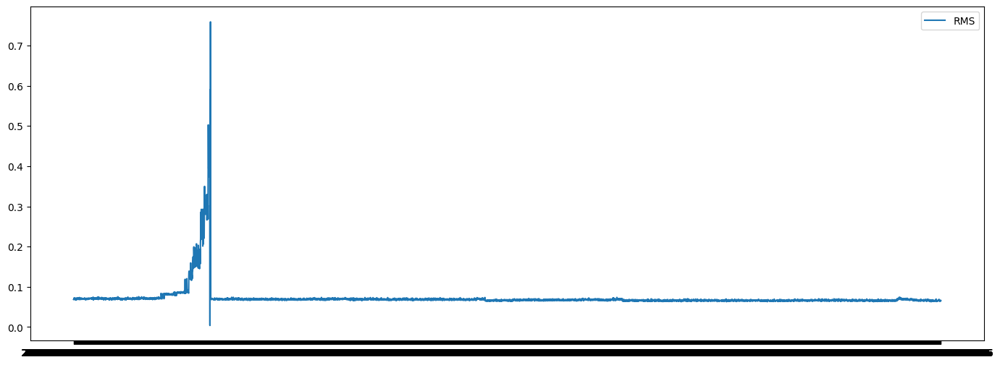

In [ ]:
# plt.figure(figsize=(17,6))
# plt.plot(data.Filename, Y, label = "RMS")
#
# plt.legend()
# plt.show()

In [ ]:
X

,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,...,10231.0,10232.0,10233.0,10234.0,10235.0,10236.0,10237.0,10238.0,10239.0,10240.0
0,2585548.0,3.206306e+05,6.104331e+05,1.106187e+06,3.601262e+05,4.478630e+05,1.015797e+06,7.075479e+04,5.215831e+05,8.657247e+05,...,317534.815654,256569.473038,2.622522e+05,715079.351434,3.087552e+05,439757.095637,558420.410140,9.007313e+05,653955.947700,187734.0
1,3791810.0,5.305563e+05,5.350751e+05,4.388777e+05,9.217964e+05,1.278354e+06,5.452965e+05,7.485325e+05,8.994027e+05,3.806340e+05,...,393384.010813,519423.550931,9.646837e+04,322002.327142,5.657402e+04,512176.382803,249465.609445,5.190791e+05,387287.333840,202998.0
2,4364429.0,7.643085e+05,7.056213e+05,1.091912e+06,7.180075e+05,1.252435e+06,6.392894e+05,1.769737e+06,1.212216e+06,7.073338e+05,...,739393.311452,170199.620121,1.905927e+05,170703.156305,4.423622e+05,787194.172612,340928.412307,1.373861e+05,641100.464413,476167.0
3,4603726.0,2.373305e+05,1.029207e+06,4.611465e+05,1.034588e+06,6.858914e+05,6.827317e+05,8.369891e+05,4.179313e+05,6.727194e+05,...,300203.060783,967480.961445,5.964011e+05,305753.704961,1.044271e+06,764366.111873,590181.866097,2.076708e+05,637665.297695,645014.0
4,3196963.0,4.343942e+05,6.775690e+05,5.283433e+05,8.615319e+05,5.809486e+05,2.205649e+05,3.609792e+05,5.626613e+05,1.038944e+06,...,149609.865424,674840.516866,3.624661e+05,348162.953351,2.056036e+05,258712.150906,707554.291925,1.796667e+05,383838.149750,692987.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6319,4326694.0,5.631087e+05,1.165955e+06,2.083606e+05,4.287882e+05,1.029324e+06,5.329886e+05,5.936627e+05,5.454415e+05,3.802866e+05,...,224797.903883,120256.395098,3.116619e+05,295052.378139,2.472639e+05,12513.878334,436062.265716,5.906244e+05,304773.277690,699508.0
6320,5252055.0,1.203739e+06,6.703229e+05,3.794873e+05,3.588448e+05,9.707606e+05,8.604500e+05,1.030895e+06,4.817799e+05,4.251513e+05,...,434884.034625,363790.073601,4.794393e+05,509894.803329,5.486071e+05,447009.993090,305430.572455,4.779151e+05,424498.145364,48019.0
6321,4835998.0,4.695481e+05,9.528704e+05,1.769715e+06,9.676258e+05,6.238889e+05,8.335573e+05,8.661171e+05,1.629124e+06,1.675509e+05,...,476117.594864,292676.026647,1.842266e+05,361252.482833,2.745378e+05,323168.845051,708950.990768,7.581800e+04,228944.790189,739630.0
6322,5782389.0,1.629155e+06,5.701599e+05,3.799567e+05,3.656913e+05,3.941167e+05,8.261595e+05,1.180990e+06,2.176905e+05,1.026652e+06,...,56303.596732,777695.630317,6.293737e+05,307859.178629,3.431262e+05,457522.629524,152004.049246,5.382788e+05,243456.785871,849563.0


In [ ]:
from sklearn import preprocessing
X_train = np.array(X)
min_max_scaler = preprocessing.MinMaxScaler()
X_train_minmax = min_max_scaler.fit_transform(X_train)
X_train_minmax

array([[0.00736069, 0.04810775, 0.19452403, ..., 0.56675017, 0.44233868,
        0.09953225],
       [0.01079597, 0.0809075 , 0.17020873, ..., 0.3260267 , 0.25828431,
        0.10762901],
       [0.01242672, 0.11743003, 0.22523782, ..., 0.08527754, 0.43346584,
        0.25253103],
       ...,
       [0.01376968, 0.0713753 , 0.30501622, ..., 0.04644405, 0.14899647,
        0.39228452],
       [0.01646488, 0.25255761, 0.18152931, ..., 0.33813674, 0.15901263,
        0.45059829],
       [0.01325791, 0.12042465, 0.30746902, ..., 0.64401745, 0.14364645,
        0.71451115]])

In [ ]:
X = X_train_minmax

In [ ]:
X

array([[0.00736069, 0.04810775, 0.19452403, ..., 0.56675017, 0.44233868,
        0.09953225],
       [0.01079597, 0.0809075 , 0.17020873, ..., 0.3260267 , 0.25828431,
        0.10762901],
       [0.01242672, 0.11743003, 0.22523782, ..., 0.08527754, 0.43346584,
        0.25253103],
       ...,
       [0.01376968, 0.0713753 , 0.30501622, ..., 0.04644405, 0.14899647,
        0.39228452],
       [0.01646488, 0.25255761, 0.18152931, ..., 0.33813674, 0.15901263,
        0.45059829],
       [0.01325791, 0.12042465, 0.30746902, ..., 0.64401745, 0.14364645,
        0.71451115]])

In [ ]:
tokenized = tokenizeRMS(Y)

## Using PCA:

### With sklearn

In [ ]:
pca = sklPCA(n_components=4)
pca.fit(X)

PCs = pca.components_ # Principal Components
variances = pca.explained_variance_ratio_ # Variances explained by each PC
projection = pca.transform(X) # Get the projection

print("PCs:\n", PCs)
print("Variances explained by each PC:\n", variances)
print("Projection of the data onto the PCs:\n", projection)

PCs:
 [[-4.30641883e-04 -4.37159059e-03 -8.99091810e-03 ... -1.14113212e-02
  -1.23372504e-02 -8.23220644e-03]
 [-9.15953423e-05 -1.55287809e-03 -6.59119008e-03 ...  1.15085698e-02
   1.05105937e-02  6.83851896e-03]
 [-1.16142138e-03 -5.73221259e-06  9.00088982e-05 ... -4.63503347e-03
  -2.36360651e-03 -1.08136321e-03]
 [-5.82356782e-04  2.26189064e-03  1.90758750e-03 ... -8.23116757e-03
  -8.22494610e-03 -5.78825671e-03]]
Variances explained by each PC:
 [0.03872506 0.00603753 0.00301306 0.00239868]
Projection of the data onto the PCs:
 [[ 1.82022015  1.17226636 -0.77359708 -0.15815069]
 [-2.2008808   1.20738323 -0.82007637 -0.19564489]
 [-0.4706406   0.93673898 -0.59089737 -0.2955477 ]
 ...
 [ 1.35703074 -1.85407246  0.15125521  0.47385926]
 [-2.14550495 -2.28720333  0.56899026 -0.1184329 ]
 [-2.42379451 -1.22925529 -0.3059044   1.52156058]]


Loadings, the components, in absolute value, can show their contribution to the variance and thus showing which are the most important ones:

In [ ]:
# Get the loadings of the original variables
loadings = pca.components_

# Calculate the absolute values of the loadings
abs_loadings = np.abs(loadings)

# Sum the absolute values of the loadings across the components
total_abs_loadings = np.sum(abs_loadings, axis=0)

# Sort the amplitudes by their total absolute loadings in descending order
sorted_amplitudes = np.argsort(total_abs_loadings)[::-1]

# Print the top n amplitudes
n = 10
print("Top", n, "amplitudes:")
for i in range(n):
    print("Amplitude", sorted_amplitudes[i], "with total absolute loading of", total_abs_loadings[sorted_amplitudes[i]])
# Las amplitudes estan en base 0

Top 10 amplitudes:
Amplitude 1010 with total absolute loading of 0.42213543415252086
Amplitude 1009 with total absolute loading of 0.3818734508141922
Amplitude 975 with total absolute loading of 0.30909140619290676
Amplitude 1017 with total absolute loading of 0.30789842642534043
Amplitude 1016 with total absolute loading of 0.3041945369543465
Amplitude 504 with total absolute loading of 0.2764012030393854
Amplitude 976 with total absolute loading of 0.2662243465397413
Amplitude 1082 with total absolute loading of 0.2584046594600677
Amplitude 505 with total absolute loading of 0.24125090013109035
Amplitude 1083 with total absolute loading of 0.2411336422668695


In [ ]:
np.max(sorted_amplitudes)

10240

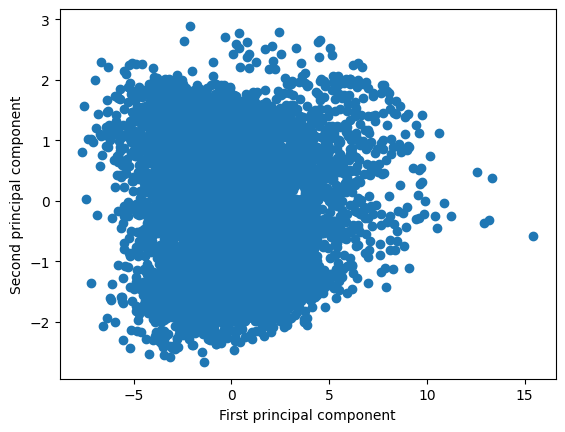

In [ ]:
plt.scatter(projection[:, 0], projection[:, 1], )
plt.xlabel('First principal component')
plt.ylabel('Second principal component')
plt.show()

In [ ]:
projection[:,0].shape

(6324,)

In [ ]:
projection[:,1].shape

(6324,)

<ipython-input-30-7cec77a7fa81>:1: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


<Axes: >

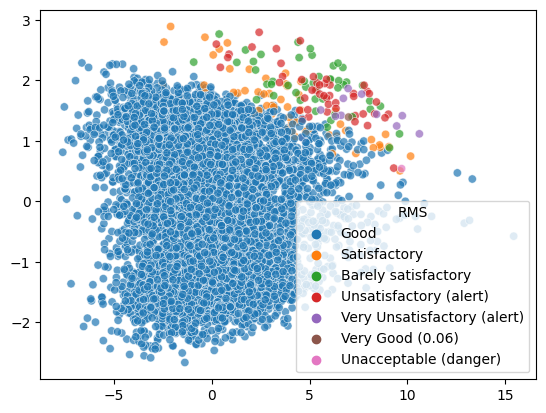

In [ ]:
sns.scatterplot(
    x=projection[:,0], y=projection[:,1],
    hue=tokenized,
    palette=sns.color_palette(),
    #data=projection,
    legend="full",
    alpha=0.7
)

### With PCA library
[Install and Info](https://pypi.org/project/pca/)

In [ ]:
model = betterPCA()
pca_res = model.fit_transform(X)


pca_res

[pca] >Column labels are auto-completed.
[pca] >Row labels are auto-completed.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [10241] columns of the input data.
[pca] >Fit using PCA.


KeyboardInterrupt: ignored

In [ ]:
pca_res["topfeat"]

,PC,feature,loading,type
0,PC1,31,-0.031007,best
1,PC2,1010,-0.152509,best
2,PC3,1018,-0.127041,best
3,PC4,1011,0.208769,best
4,PC5,1003,0.160704,best
...,...,...,...,...
11332,PC2499,10233,0.042121,weak
11333,PC1853,10234,-0.034366,weak
11334,PC3505,10235,0.038780,weak
11335,PC3754,10237,0.035255,weak


In [ ]:
pca_res["explained_var"]

array([0.03872506, 0.04476259, 0.04777566, ..., 0.99999432, 1.        ,
       1.        ])

In [ ]:
pca_res["variance_ratio"]

array([3.87250613e-02, 6.03753230e-03, 3.01306180e-03, ...,
       5.80450492e-06, 5.68246412e-06, 0.00000000e+00])

In [ ]:
#fig, ax = model.scatter(PC=[0,1])

ValueError: ignored

<Figure size 2000x1500 with 1 Axes>

## Use TSNE

In [ ]:
from sklearn.manifold import TSNE

### Over everything (It will take its time)

In [ ]:
tsne = TSNE(n_components = 2)
tsne_res = tsne.fit_transform(X)

In [ ]:
tsne_res

array([[-1.4239074 ,  2.6450877 ],
       [-1.8807529 ,  8.164051  ],
       [ 7.418682  ,  3.4719045 ],
       ...,
       [ 0.3506254 , -3.4005668 ],
       [ 1.9773904 , -7.648553  ],
       [ 0.42713237, -6.9926615 ]], dtype=float32)

In [ ]:
tsne_df = pd.DataFrame(tsne_res, columns=['tsne-2d-one', 'tsne-2d-two'])

In [ ]:
tsne_df

,tsne-2d-one,tsne-2d-two
0,-1.423907,2.645088
1,-1.880753,8.164051
2,7.418682,3.471905
3,4.048428,5.282691
4,2.197748,3.068678
...,...,...
6319,3.038257,-4.782621
6320,0.015882,-2.750989
6321,0.350625,-3.400567
6322,1.977390,-7.648553


In [ ]:
tokenized.value_counts()

Unsatisfactory (alert)    1155
Satisfactory               997
Unacceptable (danger)        4
Name: RMS, dtype: int64

<ipython-input-113-4652b45de876>:2: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  sns.scatterplot(


<Axes: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

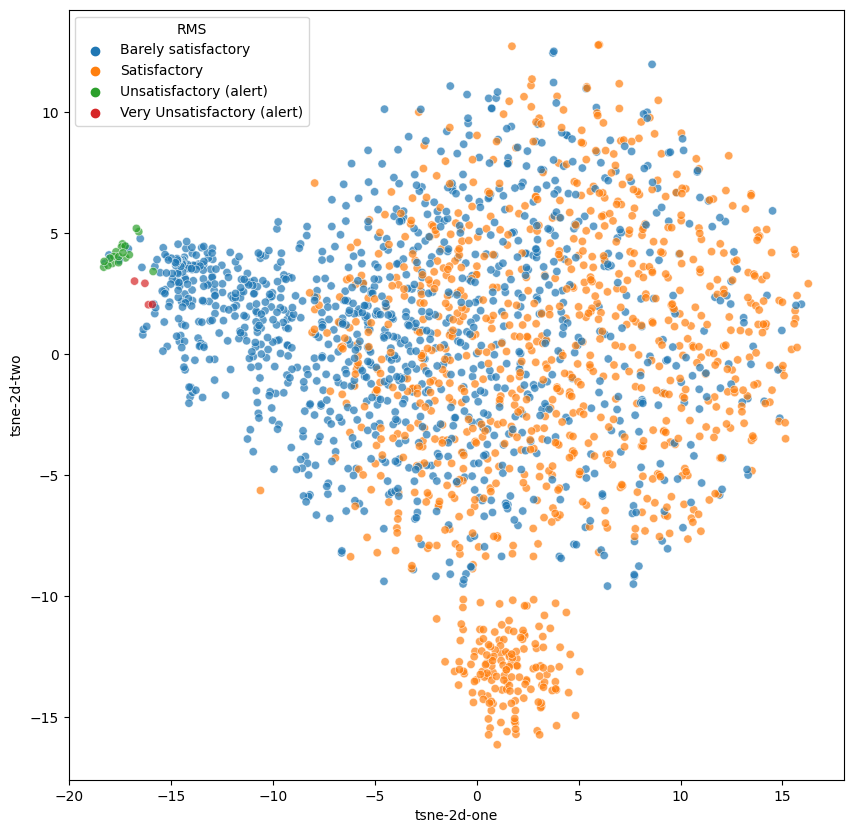

In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue=tokenized,
    palette=sns.color_palette(),
    data=tsne_df,
    legend="full",
    alpha=0.7
)

### Over the previous PCA transformation

In [ ]:
projection

array([[ 1.82022015,  1.17226636, -0.77359708, -0.15815069],
       [-2.2008808 ,  1.20738323, -0.82007637, -0.19564489],
       [-0.4706406 ,  0.93673898, -0.59089737, -0.2955477 ],
       ...,
       [ 1.35703074, -1.85407246,  0.15125521,  0.47385926],
       [-2.14550495, -2.28720333,  0.56899026, -0.1184329 ],
       [-2.42379451, -1.22925529, -0.3059044 ,  1.52156058]])

In [ ]:
tsnePCA = TSNE(n_components = 2)
tsnePCA_res = tsnePCA.fit_transform(projection)


In [ ]:
tsnePCA_df = pd.DataFrame(tsnePCA_res, columns=['tsnePCA-2d-one', 'tsnePCA-2d-two'])

<ipython-input-35-02ffdadefe82>:2: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


<Axes: xlabel='tsnePCA-2d-one', ylabel='tsnePCA-2d-two'>

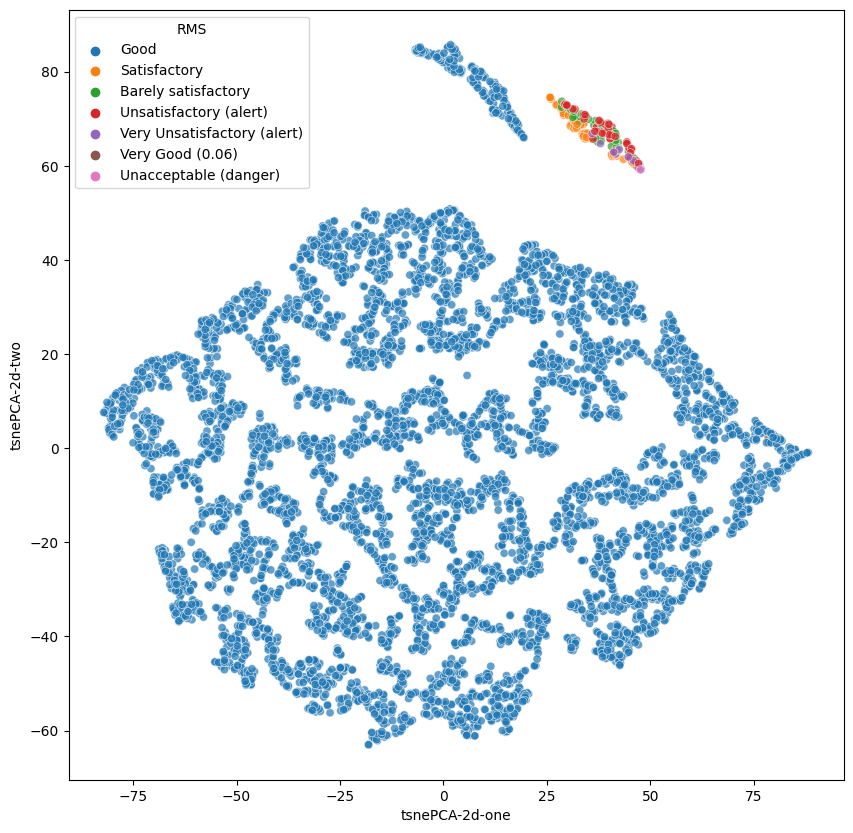

In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(
    x="tsnePCA-2d-one", y="tsnePCA-2d-two",
    hue=tokenized,
    palette=sns.color_palette(),
    data=tsnePCA_df,
    legend="full",
    alpha=0.7
)

### For Test3-CH3, choose the interesting points

It was possible to color each point to a hue based on its RMS (Which was an unknown criteria for T-Sne).

How about saving a df with that data, along with this cloud of points?

In [ ]:
tsnePCA_df

,tsnePCA-2d-one,tsnePCA-2d-two,RMS,Filename
0,33.021008,29.497976,0.068531,2004.04.10.20.51.57
1,-34.392136,31.419735,0.069283,2004.04.10.19.01.57
2,-5.309490,36.701519,0.069557,2004.04.10.22.01.57
3,-14.171616,39.213116,0.069984,2004.04.10.21.51.57
4,61.908531,6.300797,0.069409,2004.04.10.23.31.57
...,...,...,...,...
6319,64.144196,-18.393612,0.066184,2004.03.06.12.22.46
6320,30.919403,-42.370319,0.064893,2004.03.06.17.52.46
6321,20.824165,-41.954998,0.065626,2004.03.06.14.52.46
6322,-47.904526,-49.551144,0.066403,2004.03.06.15.12.46


In [ ]:
tsnePCA_df["RMS"] = Y

In [ ]:
tsnePCA_df["Filename"] = data["Filename"]

In [ ]:
tokenized

0       Good
1       Good
2       Good
3       Good
4       Good
        ... 
6319    Good
6320    Good
6321    Good
6322    Good
6323    Good
Name: RMS, Length: 6324, dtype: object

In [ ]:
filtered = tsnePCA_df[
    (tsnePCA_df["tsnePCA-2d-one"] > 20)
    &
    (tsnePCA_df["tsnePCA-2d-two"] > 50)
    ]

<ipython-input-45-67e0fb93ab64>:2: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  sns.scatterplot(


<Axes: xlabel='tsnePCA-2d-one', ylabel='tsnePCA-2d-two'>

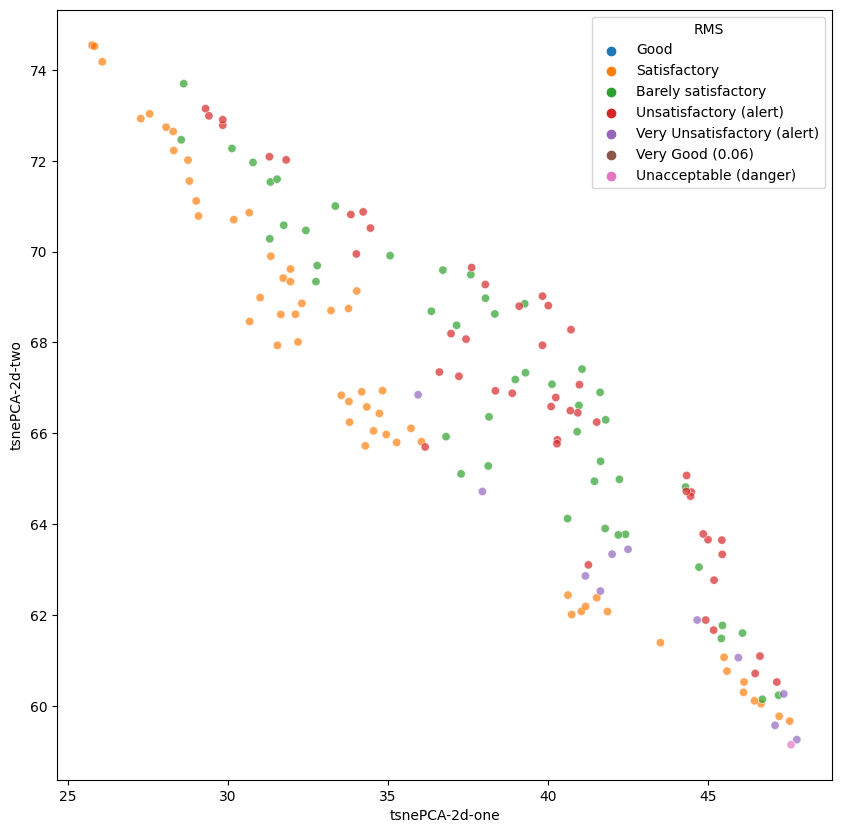

In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(
    x="tsnePCA-2d-one", y="tsnePCA-2d-two",
    hue=tokenized,
    palette=sns.color_palette(),
    data=filtered,
    legend="full",
    alpha=0.7
)

In [ ]:
filtered

,tsnePCA-2d-one,tsnePCA-2d-two,RMS,Filename
813,31.008467,68.986595,0.118727,2004.04.17.00.02.55
825,34.295990,65.723816,0.120302,2004.04.16.23.52.55
826,30.680151,68.461807,0.106188,2004.04.16.23.42.55
840,31.957212,69.616989,0.126680,2004.04.17.01.12.55
841,27.551563,73.035408,0.136832,2004.04.17.02.42.55
...,...,...,...,...
995,47.789070,59.253433,0.590047,2004.04.18.02.22.55
996,36.610832,67.348679,0.395928,2004.04.18.00.12.55
997,47.164497,60.522312,0.384387,2004.04.18.00.22.55
998,47.610153,59.141850,0.758765,2004.04.18.02.32.55


In [ ]:
filtered.to_csv("/content/drive/MyDrive/nimbus-test3-CH3.csv")

### Just some graphics that dont say much

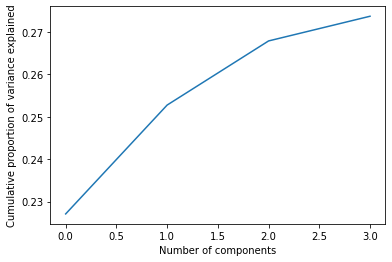

In [ ]:
plt.plot(np.cumsum(variances))
plt.xlabel("Number of components")
plt.ylabel("Cumulative proportion of variance explained")
plt.show()

KeyboardInterrupt: ignored

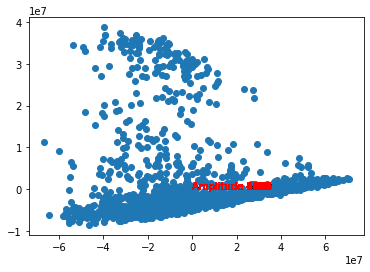

In [ ]:
plt.scatter(projection[:, 0], projection[:, 1])
for i in range(X.shape[1]):
    plt.arrow(0, 0, PCs[0, i], PCs[1, i], color='r', alpha=0.5)
    plt.text(PCs[0, i]*1.15, PCs[1, i]*1.15, "Amplitude "+str(i+1), color='r')
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

In [ ]:


# Calculate the correlation matrix of the principal components
corr_matrix = np.corrcoef(projection.T)

# Create a heatmap of the correlation matrix
sns.heatmap(corr_matrix, cmap='coolwarm', center=0, annot=True)
plt.title("Correlation Matrix of Principal Components")
plt.show()

## Try selectKBest first

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2

In [ ]:
X

,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,...,10231.0,10232.0,10233.0,10234.0,10235.0,10236.0,10237.0,10238.0,10239.0,10240.0
0,112382607.0,5.251097e+05,1.007576e+06,6.417581e+05,3.878949e+05,3.000966e+05,7.715366e+05,1.465741e+05,3.481314e+05,8.345292e+05,...,2.147986e+05,2.634856e+05,4.124731e+05,382461.204359,4.440119e+05,7.007581e+05,4.522433e+05,1.961439e+05,2.711486e+05,643049.0
1,116223318.0,1.096605e+06,3.027029e+05,5.355070e+05,4.298853e+05,2.845411e+05,2.401439e+05,8.517389e+05,4.449902e+05,6.478113e+05,...,3.493010e+05,2.004819e+05,1.740010e+05,397184.972049,2.935413e+05,6.240676e+05,3.079142e+05,3.284071e+05,3.926585e+05,504696.0
2,170263650.0,2.201489e+06,7.231786e+05,1.833845e+06,1.118220e+06,1.390141e+06,4.214828e+05,1.950771e+05,1.572459e+06,6.759693e+05,...,7.423671e+05,8.593279e+05,8.261676e+05,782926.293492,3.922242e+05,1.006343e+06,8.750868e+05,1.076903e+06,4.510070e+05,700550.0
3,125443278.0,3.040756e+05,7.183433e+05,7.288441e+05,6.183690e+05,7.198218e+05,1.341246e+06,7.978073e+05,2.766471e+05,3.103617e+05,...,8.411353e+05,5.544358e+05,7.452464e+05,132219.964277,5.057205e+05,4.909244e+05,3.534600e+05,8.675352e+05,4.453287e+05,206144.0
4,99094220.0,9.598522e+05,7.007767e+05,4.588762e+05,4.939984e+05,3.038675e+05,5.315657e+05,7.627352e+05,5.015622e+05,5.928807e+05,...,4.221061e+05,1.344148e+05,2.444302e+05,820777.532653,3.069563e+05,2.668356e+05,2.267563e+05,6.746988e+05,4.633833e+05,110182.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2151,191054085.0,1.885194e+06,3.858770e+06,1.807041e+06,1.335664e+06,1.794642e+06,3.572525e+06,3.356212e+06,1.791683e+06,2.438656e+06,...,1.235641e+06,1.549599e+06,6.598012e+05,734247.670237,1.264628e+06,5.926097e+05,8.972057e+05,1.119720e+06,1.340274e+06,1245459.0
2152,184262107.0,1.896252e+06,6.821482e+05,3.015916e+06,1.705190e+06,1.156464e+06,8.670742e+05,2.832355e+06,3.929488e+06,1.998295e+06,...,2.318744e+06,1.313265e+06,1.237387e+06,216447.995918,1.578244e+06,1.160885e+06,1.655426e+06,8.127641e+05,4.368781e+05,275233.0
2153,127782936.0,1.054726e+06,1.134781e+06,5.808984e+05,3.467499e+05,9.052551e+05,5.917094e+04,2.396812e+05,1.491129e+05,4.348801e+05,...,2.541218e+05,6.100542e+05,6.893029e+05,856097.068636,8.660053e+05,4.934953e+05,6.319448e+05,6.573239e+05,1.845119e+05,1250490.0
2154,148794651.0,1.503662e+06,1.027029e+06,5.241795e+05,3.545158e+05,5.017679e+05,2.751131e+05,2.362283e+05,6.382621e+05,6.686342e+05,...,3.905109e+05,9.433263e+05,1.051432e+06,556977.210956,6.946101e+05,4.981713e+05,8.755413e+05,4.597749e+05,2.393505e+05,476803.0


In [ ]:
sel = SelectKBest(chi2,k=6)
X_kbest = sel.fit_transform(X,Y.astype('int'))
X_kbest = pd.DataFrame(X_kbest)
X_kbest.head()

,0,1,2,3,4,5
0,444011.900372,7.007581e+05,452243.316939,1.961439e+05,271148.593111,643049.0
1,293541.287774,6.240676e+05,307914.226043,3.284071e+05,392658.513855,504696.0
2,392224.187535,1.006343e+06,875086.756451,1.076903e+06,451007.033859,700550.0
3,505720.519828,4.909244e+05,353459.978945,8.675352e+05,445328.663944,206144.0
4,306956.251743,2.668356e+05,226756.327364,6.746988e+05,463383.271847,110182.0


In [ ]:
mask = sel.get_support()

In [ ]:
selected_columns = X.columns[mask]

In [ ]:
selected_columns

Index(['10235.0', '10236.0', '10237.0', '10238.0', '10239.0', '10240.0'], dtype='object')

In [ ]:
pca = PCA(n_components=4)
X_pca = pca.fit_transform(X_kbest)

print(pca.explained_variance_ratio_)

[0.41309266 0.16948293 0.11377191 0.10626792]


## Graphs to see the relation

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/fftRMS-test1-CH5.csv")

## Reorder the data according to the date

In [ ]:
data

,Unnamed: 0,Filename,RMS,0.0,1.0,2.0,3.0,4.0,5.0,6.0,...,10231.0,10232.0,10233.0,10234.0,10235.0,10236.0,10237.0,10238.0,10239.0,10240.0
0,0,2003.11.16.06.38.46,0.162778,112382607.0,5.251097e+05,1.007576e+06,6.417581e+05,3.878949e+05,3.000966e+05,7.715366e+05,...,2.147986e+05,2.634856e+05,4.124731e+05,382461.204359,4.440119e+05,7.007581e+05,4.522433e+05,1.961439e+05,2.711486e+05,643049.0
1,1,2003.11.16.07.28.46,0.160860,116223318.0,1.096605e+06,3.027029e+05,5.355070e+05,4.298853e+05,2.845411e+05,2.401439e+05,...,3.493010e+05,2.004819e+05,1.740010e+05,397184.972049,2.935413e+05,6.240676e+05,3.079142e+05,3.284071e+05,3.926585e+05,504696.0
2,2,2003.11.16.06.28.46,0.162380,170263650.0,2.201489e+06,7.231786e+05,1.833845e+06,1.118220e+06,1.390141e+06,4.214828e+05,...,7.423671e+05,8.593279e+05,8.261676e+05,782926.293492,3.922242e+05,1.006343e+06,8.750868e+05,1.076903e+06,4.510070e+05,700550.0
3,3,2003.11.16.08.18.46,0.160941,125443278.0,3.040756e+05,7.183433e+05,7.288441e+05,6.183690e+05,7.198218e+05,1.341246e+06,...,8.411353e+05,5.544358e+05,7.452464e+05,132219.964277,5.057205e+05,4.909244e+05,3.534600e+05,8.675352e+05,4.453287e+05,206144.0
4,4,2003.11.16.07.38.46,0.161260,99094220.0,9.598522e+05,7.007767e+05,4.588762e+05,4.939984e+05,3.038675e+05,5.315657e+05,...,4.221061e+05,1.344148e+05,2.444302e+05,820777.532653,3.069563e+05,2.668356e+05,2.267563e+05,6.746988e+05,4.633833e+05,110182.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2151,2151,2003.10.29.14.39.46,0.159728,191054085.0,1.885194e+06,3.858770e+06,1.807041e+06,1.335664e+06,1.794642e+06,3.572525e+06,...,1.235641e+06,1.549599e+06,6.598012e+05,734247.670237,1.264628e+06,5.926097e+05,8.972057e+05,1.119720e+06,1.340274e+06,1245459.0
2152,2152,2003.10.23.10.04.13,0.131624,184262107.0,1.896252e+06,6.821482e+05,3.015916e+06,1.705190e+06,1.156464e+06,8.670742e+05,...,2.318744e+06,1.313265e+06,1.237387e+06,216447.995918,1.578244e+06,1.160885e+06,1.655426e+06,8.127641e+05,4.368781e+05,275233.0
2153,2153,2003.10.23.08.44.13,0.131232,127782936.0,1.054726e+06,1.134781e+06,5.808984e+05,3.467499e+05,9.052551e+05,5.917094e+04,...,2.541218e+05,6.100542e+05,6.893029e+05,856097.068636,8.660053e+05,4.934953e+05,6.319448e+05,6.573239e+05,1.845119e+05,1250490.0
2154,2154,2003.10.23.09.24.13,0.132458,148794651.0,1.503662e+06,1.027029e+06,5.241795e+05,3.545158e+05,5.017679e+05,2.751131e+05,...,3.905109e+05,9.433263e+05,1.051432e+06,556977.210956,6.946101e+05,4.981713e+05,8.755413e+05,4.597749e+05,2.393505e+05,476803.0


In [ ]:
data = data.iloc[:,1:]

In [ ]:
data

,Filename,RMS,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,...,10231.0,10232.0,10233.0,10234.0,10235.0,10236.0,10237.0,10238.0,10239.0,10240.0
0,2003.11.16.06.38.46,0.162778,112382607.0,5.251097e+05,1.007576e+06,6.417581e+05,3.878949e+05,3.000966e+05,7.715366e+05,1.465741e+05,...,2.147986e+05,2.634856e+05,4.124731e+05,382461.204359,4.440119e+05,7.007581e+05,4.522433e+05,1.961439e+05,2.711486e+05,643049.0
1,2003.11.16.07.28.46,0.160860,116223318.0,1.096605e+06,3.027029e+05,5.355070e+05,4.298853e+05,2.845411e+05,2.401439e+05,8.517389e+05,...,3.493010e+05,2.004819e+05,1.740010e+05,397184.972049,2.935413e+05,6.240676e+05,3.079142e+05,3.284071e+05,3.926585e+05,504696.0
2,2003.11.16.06.28.46,0.162380,170263650.0,2.201489e+06,7.231786e+05,1.833845e+06,1.118220e+06,1.390141e+06,4.214828e+05,1.950771e+05,...,7.423671e+05,8.593279e+05,8.261676e+05,782926.293492,3.922242e+05,1.006343e+06,8.750868e+05,1.076903e+06,4.510070e+05,700550.0
3,2003.11.16.08.18.46,0.160941,125443278.0,3.040756e+05,7.183433e+05,7.288441e+05,6.183690e+05,7.198218e+05,1.341246e+06,7.978073e+05,...,8.411353e+05,5.544358e+05,7.452464e+05,132219.964277,5.057205e+05,4.909244e+05,3.534600e+05,8.675352e+05,4.453287e+05,206144.0
4,2003.11.16.07.38.46,0.161260,99094220.0,9.598522e+05,7.007767e+05,4.588762e+05,4.939984e+05,3.038675e+05,5.315657e+05,7.627352e+05,...,4.221061e+05,1.344148e+05,2.444302e+05,820777.532653,3.069563e+05,2.668356e+05,2.267563e+05,6.746988e+05,4.633833e+05,110182.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2151,2003.10.29.14.39.46,0.159728,191054085.0,1.885194e+06,3.858770e+06,1.807041e+06,1.335664e+06,1.794642e+06,3.572525e+06,3.356212e+06,...,1.235641e+06,1.549599e+06,6.598012e+05,734247.670237,1.264628e+06,5.926097e+05,8.972057e+05,1.119720e+06,1.340274e+06,1245459.0
2152,2003.10.23.10.04.13,0.131624,184262107.0,1.896252e+06,6.821482e+05,3.015916e+06,1.705190e+06,1.156464e+06,8.670742e+05,2.832355e+06,...,2.318744e+06,1.313265e+06,1.237387e+06,216447.995918,1.578244e+06,1.160885e+06,1.655426e+06,8.127641e+05,4.368781e+05,275233.0
2153,2003.10.23.08.44.13,0.131232,127782936.0,1.054726e+06,1.134781e+06,5.808984e+05,3.467499e+05,9.052551e+05,5.917094e+04,2.396812e+05,...,2.541218e+05,6.100542e+05,6.893029e+05,856097.068636,8.660053e+05,4.934953e+05,6.319448e+05,6.573239e+05,1.845119e+05,1250490.0
2154,2003.10.23.09.24.13,0.132458,148794651.0,1.503662e+06,1.027029e+06,5.241795e+05,3.545158e+05,5.017679e+05,2.751131e+05,2.362283e+05,...,3.905109e+05,9.433263e+05,1.051432e+06,556977.210956,6.946101e+05,4.981713e+05,8.755413e+05,4.597749e+05,2.393505e+05,476803.0


In [ ]:
reordered_data = data.sort_values(
   by="Filename",
   key=lambda x: np.argsort(index_natsorted(data["Filename"]))
)

In [ ]:
reordered_data.loc[:,"Filename"] = reordered_data.loc[:,"Filename"].apply(parseFilenameToDate)

In [ ]:
reordered_data

,Filename,RMS,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,...,10231.0,10232.0,10233.0,10234.0,10235.0,10236.0,10237.0,10238.0,10239.0,10240.0
2001,2003-10-22 12:06:24,0.128887,151296418.0,1.348549e+06,1.566102e+06,1.229588e+06,1.012604e+06,5.075702e+05,8.492073e+05,6.771991e+05,...,524821.325223,605801.407788,2.898564e+05,2.715260e+05,1.321321e+06,76534.591783,6.331413e+05,779276.095496,575142.211263,15110.0
2000,2003-10-22 12:09:13,0.129562,124340209.0,1.371698e+06,2.692052e+05,1.331827e+06,5.862150e+05,1.476834e+05,1.765351e+05,2.520739e+05,...,152870.084529,162569.488964,7.089957e+05,1.322288e+05,6.244782e+05,613289.285516,4.415649e+05,135604.981016,80440.968536,634207.0
2003,2003-10-22 12:14:13,0.131339,161564104.0,1.679028e+06,1.338806e+06,5.928599e+05,1.058601e+06,1.753845e+05,4.593643e+05,5.851195e+05,...,867370.527879,254706.696420,9.215190e+05,4.841156e+05,2.132203e+05,742366.409124,6.080790e+05,659897.022197,433849.569122,303198.0
2002,2003-10-22 12:19:13,0.131083,182851604.0,8.297948e+05,1.270892e+06,2.701187e+06,4.663652e+05,1.120115e+06,1.187928e+06,2.327187e+06,...,981160.141048,293813.570129,1.192138e+06,1.040079e+06,6.041099e+05,883352.733765,1.158732e+06,73871.420757,816138.245682,1089470.0
2004,2003-10-22 12:24:13,0.131307,133377461.0,1.285397e+06,1.350406e+06,3.734080e+05,6.748235e+05,1.042340e+06,5.438138e+05,3.786612e+05,...,258032.153333,413503.499613,1.097601e+05,3.654434e+05,3.160802e+05,147595.022158,4.079532e+05,222194.007990,456641.594079,101525.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,2003-11-25 16:07:32,0.275645,25538275.0,2.210426e+05,2.176702e+05,3.345968e+05,8.653876e+04,1.273209e+05,7.985067e+04,2.503296e+05,...,202112.726178,30950.385077,6.746587e+04,1.557306e+05,2.195044e+05,147822.005697,1.182217e+05,327746.268057,187471.964420,201795.0
999,2003-11-25 23:13:21,0.496173,15189901.0,3.486226e+05,3.213958e+05,1.995477e+05,1.116980e+05,1.142600e+05,1.276290e+05,2.075646e+05,...,356079.425833,151018.275006,2.416177e+05,9.711725e+04,1.186981e+05,61250.666417,1.995961e+05,35540.768091,250351.108500,133101.0
994,2003-11-25 23:19:56,0.531569,14590356.0,4.201305e+05,1.973065e+05,3.091375e+05,4.173817e+04,2.343195e+05,1.138896e+05,3.339022e+05,...,160311.578970,261757.176338,4.473893e+05,1.247474e+05,7.855446e+04,145929.255503,1.354271e+05,128021.762115,262604.495054,109424.0
995,2003-11-25 23:29:56,0.474447,18019871.0,2.026539e+05,8.460974e+04,1.389058e+05,2.288462e+05,4.851493e+05,1.458153e+05,2.083507e+05,...,282866.032072,41959.847304,1.843632e+05,2.090650e+05,2.222628e+05,87383.903716,1.841900e+05,221296.262301,184408.625830,448105.0


## First, plot the RMS

In [ ]:
plt.figure(figsize=(17,6))
plt.plot(reordered_data.Filename, reordered_data["RMS"].values, label = "RMS")
#plt.plot(reordered_data.Filename, reordered_data["1.0"].values, label = "Amplitude 1")
plt.legend()
plt.show()

NameError: ignored

<Figure size 1700x600 with 0 Axes>

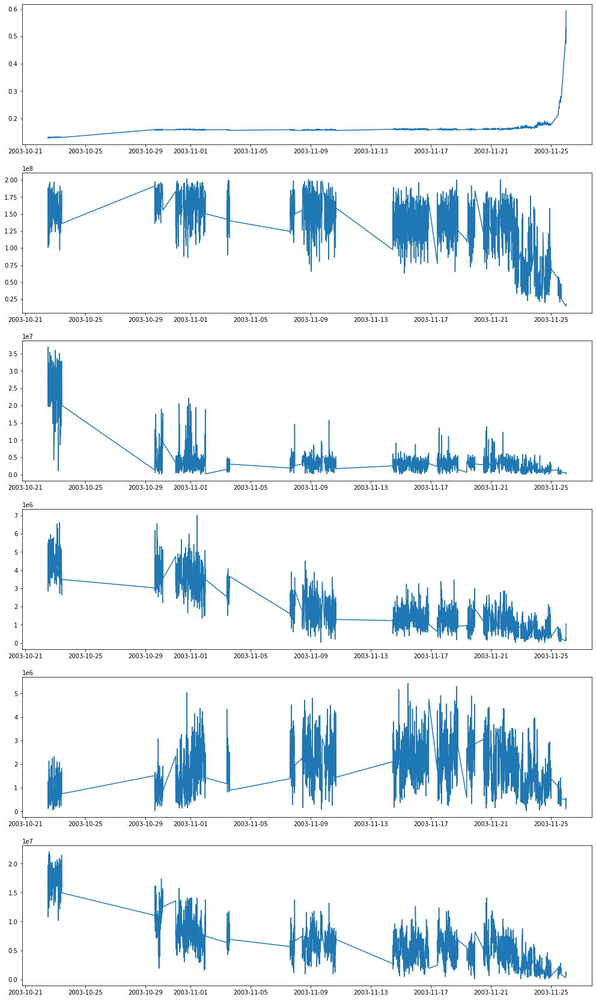

In [ ]:
plt.figure(figsize=(17,30))
plt.subplot(611)
plt.plot(reordered_data.Filename, reordered_data["RMS"].values, label = "RMS")
plt.subplot(612)
plt.plot(reordered_data.Filename, reordered_data["0.0"].values, label = "Amplitude 0")
plt.subplot(613)
plt.plot(reordered_data.Filename, reordered_data["1010.0"].values, label = "Amplitude 1010")
plt.subplot(614)
plt.plot(reordered_data.Filename, reordered_data["51.0"].values, label = "Amplitude 1012")
plt.subplot(615)
plt.plot(reordered_data.Filename, reordered_data["931.0"].values, label = "Amplitude 1011")
plt.subplot(616)
plt.plot(reordered_data.Filename, reordered_data["505.0"].values, label = "Amplitude 505")
plt.show()

In [ ]:
X = reordered_data.iloc[:,2:].columns
X

Index(['0.0', '1.0', '2.0', '3.0', '4.0', '5.0', '6.0', '7.0', '8.0', '9.0',
       ...
       '10231.0', '10232.0', '10233.0', '10234.0', '10235.0', '10236.0',
       '10237.0', '10238.0', '10239.0', '10240.0'],
      dtype='object', length=10241)

In [ ]:
Y1 = reordered_data.iloc[0,2:]
Y2 = reordered_data.iloc[-1,2:]

In [ ]:
Y1

0.0           151296418.0
1.0        1348548.869758
2.0        1566101.514931
3.0        1229588.343224
4.0        1012604.312313
                ...      
10236.0      76534.591783
10237.0      633141.31745
10238.0     779276.095496
10239.0     575142.211263
10240.0           15110.0
Name: 2001, Length: 10241, dtype: object

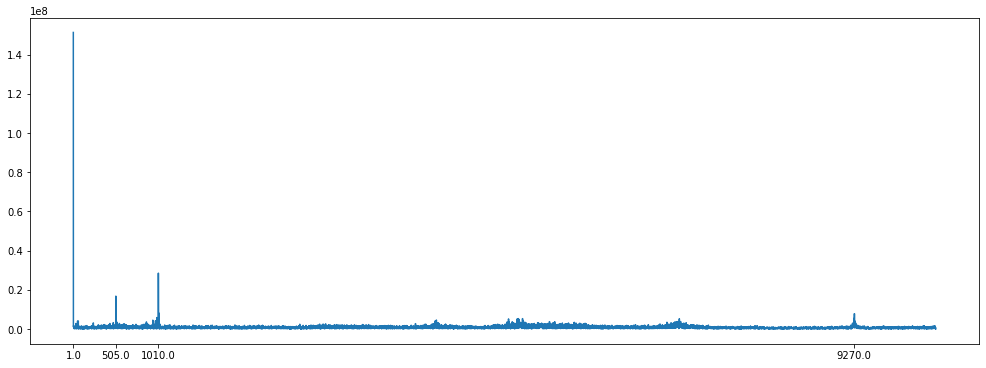

In [ ]:
plt.figure(figsize=(17,6))
#plt.subplot(211)
plt.plot(Y1, label = "First file")
x_ticks = [1, 505, 1010,9270]
plt.xticks(ticks=x_ticks)
#plt.subplot(212)
#plt.plot(X, Y2, label = "Last file")
plt.show()

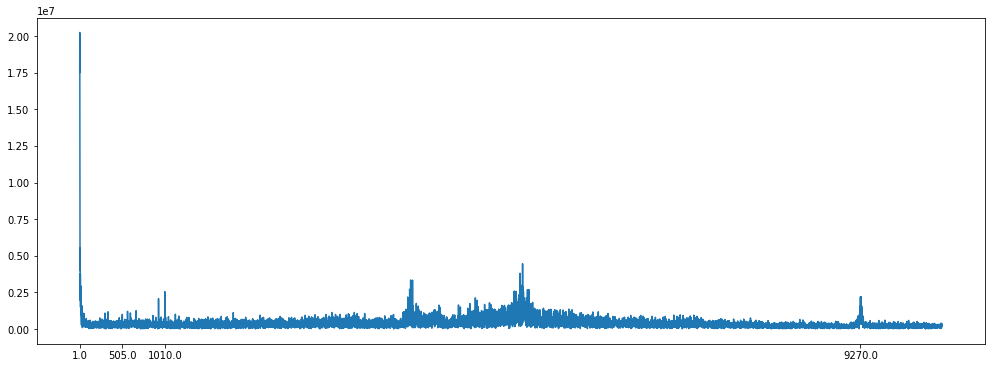

In [ ]:
plt.figure(figsize=(17,6))
#plt.subplot(211)
plt.plot(Y2, label = "Last file")
x_ticks = [1, 505, 1010, 9270]
plt.xticks(ticks=x_ticks)
#plt.subplot(212)
#plt.plot(X, Y2, label = "Last file")
plt.show()

# Second Try

The mistake made previously over the RMS criteria was corrected, so these graphs are the ones that are seen in the documentation.






Choose the file below:
* Test 1 CH5
* Test 2 CH1
* Test 3 CH3

Example: "test3-CH3"

In [ ]:
test_to_check = "test3-CH3"

## Load Dataset

In [ ]:
datafile = f"/content/drive/MyDrive/fftRMS-{test_to_check}-fixed.csv"

In [ ]:
data = pd.read_csv(datafile)

In [ ]:
Y = data.loc[:,"RMS"]
X = data.iloc[:,3:]

In [ ]:
Y

0       1.579103
1       0.827692
2       0.940373
3       1.173243
4       0.864917
         ...    
979     5.762988
980     5.626528
981     5.646649
982    12.529171
983     4.206188
Name: RMS, Length: 984, dtype: float64

In [ ]:
data = data.iloc[:,1:]

In [ ]:
reordered_data = data.sort_values(
   by="Filename",
   key=lambda x: np.argsort(index_natsorted(data["Filename"]))
)

In [ ]:
reordered_data.loc[:,"Filename"] = reordered_data.loc[:,"Filename"].apply(parseFilenameToDate)

<ipython-input-137-256ec5d2b8df>:1: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  reordered_data.loc[:,"Filename"] = reordered_data.loc[:,"Filename"].apply(parseFilenameToDate)


In [ ]:
reordered_data

,Filename,RMS,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,...,10231.0,10232.0,10233.0,10234.0,10235.0,10236.0,10237.0,10238.0,10239.0,10240.0
7,2004-02-12 10:32:39,1.298048,15069683.0,2.035246e+05,5.937756e+05,6.605724e+05,6.630525e+05,5.365002e+05,7.593722e+05,1.267463e+05,...,2.599290e+05,20985.514390,93339.358944,139035.605391,167278.214142,9.379818e+04,136430.102806,1.210295e+05,1.000733e+05,66959.0
0,2004-02-12 10:42:39,1.579103,4635277.0,7.149984e+05,3.434028e+05,6.732487e+05,1.515483e+05,7.289445e+05,4.137006e+05,1.676771e+05,...,2.295914e+05,196104.985935,195860.164005,461820.299572,261193.398467,4.057299e+04,115044.226857,5.486956e+05,2.441160e+05,82135.0
17,2004-02-12 10:52:39,1.384534,3313657.0,1.588991e+05,5.166064e+05,2.239593e+05,2.081808e+05,3.846052e+05,5.875088e+05,2.299377e+05,...,3.232566e+05,85083.219269,68443.270543,142461.239406,125698.553086,8.480948e+04,145697.183740,8.676079e+04,3.042860e+05,27925.0
12,2004-02-12 11:02:39,1.386667,2512340.0,3.501494e+05,4.422848e+05,3.065208e+05,1.042964e+05,3.287442e+05,2.126002e+05,4.432438e+05,...,7.223276e+04,280721.571717,246246.556516,107808.125367,361715.512902,1.708299e+05,128834.533228,1.340135e+05,2.140912e+05,6576.0
15,2004-02-12 11:12:39,1.448256,4125430.0,4.170901e+05,4.267451e+05,2.355288e+05,7.229696e+05,1.385244e+05,1.053861e+06,5.070264e+05,...,9.755585e+03,396081.852140,165436.421039,282610.993623,103036.189560,4.270432e+05,207189.280667,1.196980e+05,3.199807e+05,440630.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
975,2004-02-19 05:42:39,30.429151,744391.0,1.086981e+06,1.400724e+05,3.627966e+05,3.387068e+05,6.644871e+05,4.744903e+04,5.233917e+05,...,1.635885e+05,116087.205093,205577.307332,298794.984663,587083.528990,3.964879e+05,67816.903411,3.320865e+05,5.684945e+05,133195.0
967,2004-02-19 05:52:39,5.642043,727141.0,6.736387e+05,5.378731e+05,4.123522e+05,5.768794e+05,5.585799e+05,4.175475e+05,6.387512e+05,...,2.081617e+05,172799.578283,151509.526899,466362.102003,289247.587774,5.602207e+04,229939.164168,1.444713e+05,9.790094e+04,178917.0
969,2004-02-19 06:02:39,10.660907,130174.0,6.806790e+05,2.047971e+05,3.620101e+05,6.036861e+05,2.372859e+05,3.809290e+05,2.804888e+05,...,1.181676e+05,175080.014288,207831.957690,263731.862239,202561.249170,7.110861e+04,146647.834857,2.965323e+05,1.379008e+05,218854.0
972,2004-02-19 06:12:39,0.486068,249199420.0,1.312705e+07,3.866019e+06,2.729268e+06,2.248963e+06,1.679738e+06,1.916148e+06,1.576023e+06,...,7.847511e+05,544542.898286,821724.967054,307386.942366,539701.721296,9.923491e+05,650962.128298,3.433802e+05,1.082258e+06,144186.0


In [ ]:
reordered_data

,Filename,RMS,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,...,10231.0,10232.0,10233.0,10234.0,10235.0,10236.0,10237.0,10238.0,10239.0,10240.0
7,2004-02-12 10:32:39,1.298048,15069683.0,2.035246e+05,5.937756e+05,6.605724e+05,6.630525e+05,5.365002e+05,7.593722e+05,1.267463e+05,...,2.599290e+05,20985.514390,93339.358944,139035.605391,167278.214142,9.379818e+04,136430.102806,1.210295e+05,1.000733e+05,66959.0
0,2004-02-12 10:42:39,1.579103,4635277.0,7.149984e+05,3.434028e+05,6.732487e+05,1.515483e+05,7.289445e+05,4.137006e+05,1.676771e+05,...,2.295914e+05,196104.985935,195860.164005,461820.299572,261193.398467,4.057299e+04,115044.226857,5.486956e+05,2.441160e+05,82135.0
17,2004-02-12 10:52:39,1.384534,3313657.0,1.588991e+05,5.166064e+05,2.239593e+05,2.081808e+05,3.846052e+05,5.875088e+05,2.299377e+05,...,3.232566e+05,85083.219269,68443.270543,142461.239406,125698.553086,8.480948e+04,145697.183740,8.676079e+04,3.042860e+05,27925.0
12,2004-02-12 11:02:39,1.386667,2512340.0,3.501494e+05,4.422848e+05,3.065208e+05,1.042964e+05,3.287442e+05,2.126002e+05,4.432438e+05,...,7.223276e+04,280721.571717,246246.556516,107808.125367,361715.512902,1.708299e+05,128834.533228,1.340135e+05,2.140912e+05,6576.0
15,2004-02-12 11:12:39,1.448256,4125430.0,4.170901e+05,4.267451e+05,2.355288e+05,7.229696e+05,1.385244e+05,1.053861e+06,5.070264e+05,...,9.755585e+03,396081.852140,165436.421039,282610.993623,103036.189560,4.270432e+05,207189.280667,1.196980e+05,3.199807e+05,440630.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
975,2004-02-19 05:42:39,30.429151,744391.0,1.086981e+06,1.400724e+05,3.627966e+05,3.387068e+05,6.644871e+05,4.744903e+04,5.233917e+05,...,1.635885e+05,116087.205093,205577.307332,298794.984663,587083.528990,3.964879e+05,67816.903411,3.320865e+05,5.684945e+05,133195.0
967,2004-02-19 05:52:39,5.642043,727141.0,6.736387e+05,5.378731e+05,4.123522e+05,5.768794e+05,5.585799e+05,4.175475e+05,6.387512e+05,...,2.081617e+05,172799.578283,151509.526899,466362.102003,289247.587774,5.602207e+04,229939.164168,1.444713e+05,9.790094e+04,178917.0
969,2004-02-19 06:02:39,10.660907,130174.0,6.806790e+05,2.047971e+05,3.620101e+05,6.036861e+05,2.372859e+05,3.809290e+05,2.804888e+05,...,1.181676e+05,175080.014288,207831.957690,263731.862239,202561.249170,7.110861e+04,146647.834857,2.965323e+05,1.379008e+05,218854.0
972,2004-02-19 06:12:39,0.486068,249199420.0,1.312705e+07,3.866019e+06,2.729268e+06,2.248963e+06,1.679738e+06,1.916148e+06,1.576023e+06,...,7.847511e+05,544542.898286,821724.967054,307386.942366,539701.721296,9.923491e+05,650962.128298,3.433802e+05,1.082258e+06,144186.0


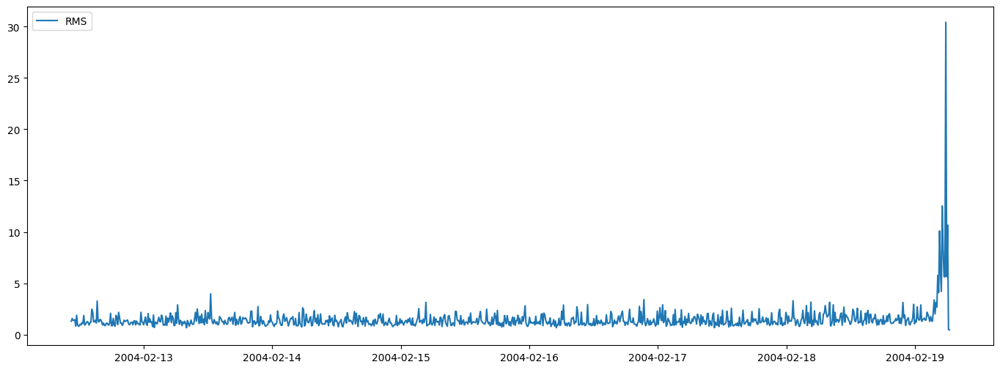

In [ ]:
plt.figure(figsize=(17,6))
plt.plot(reordered_data.Filename, reordered_data["RMS"].values, label = "RMS")
#plt.plot(reordered_data.Filename, reordered_data["1.0"].values, label = "Amplitude 1")
plt.legend()
plt.show()

## Preprocessing

In [ ]:
from sklearn import preprocessing
X_train = np.array(X)
min_max_scaler = preprocessing.MinMaxScaler()
X_train_minmax = min_max_scaler.fit_transform(X_train)
X_train_minmax

array([[0.0116709 , 0.02483629, 0.0288747 , ..., 0.4893543 , 0.13345338,
        0.07593244],
       [0.00612779, 0.00697081, 0.03045932, ..., 0.15451717, 0.05672485,
        0.05555797],
       [0.00540885, 0.0114299 , 0.04469492, ..., 0.22592355, 0.05269414,
        0.21555764],
       ...,
       [0.00154993, 0.01736089, 0.0152368 , ..., 0.23612505, 0.11789608,
        0.06579102],
       [0.00411912, 0.00567691, 0.0338778 , ..., 0.15616296, 0.15976158,
        0.27798053],
       [0.00394843, 0.00258203, 0.02090133, ..., 0.18827207, 0.11797558,
        0.1131235 ]])

In [ ]:
X = X_train_minmax

In [ ]:
X

array([[0.0116709 , 0.02483629, 0.0288747 , ..., 0.4893543 , 0.13345338,
        0.07593244],
       [0.00612779, 0.00697081, 0.03045932, ..., 0.15451717, 0.05672485,
        0.05555797],
       [0.00540885, 0.0114299 , 0.04469492, ..., 0.22592355, 0.05269414,
        0.21555764],
       ...,
       [0.00154993, 0.01736089, 0.0152368 , ..., 0.23612505, 0.11789608,
        0.06579102],
       [0.00411912, 0.00567691, 0.0338778 , ..., 0.15616296, 0.15976158,
        0.27798053],
       [0.00394843, 0.00258203, 0.02090133, ..., 0.18827207, 0.11797558,
        0.1131235 ]])

In [ ]:
tokenized = new_tokenizeRMS(Y)

In [ ]:
tokenized

0                        Good
1                        Good
2                        Good
3                        Good
4                        Good
                ...          
979    Unsatisfactory (alert)
980    Unsatisfactory (alert)
981    Unsatisfactory (alert)
982     Unacceptable (danger)
983              Satisfactory
Name: RMS, Length: 984, dtype: object

### Palette for graphs

In [ ]:
seaborn_palette = sns.color_palette(n_colors=8)
seaborn_palette

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745)]

In [ ]:
custom_palette = {
    "Good": seaborn_palette[0],
    "Satisfactory" : seaborn_palette[2],
    "Unsatisfactory (alert)" : seaborn_palette[1],
    "Unacceptable (danger)" : seaborn_palette[3]
}

## Using PCA:

### With sklearn

In [ ]:
pca = sklPCA(n_components=4)
pca.fit(X)

PCs = pca.components_ # Principal Components
variances = pca.explained_variance_ratio_ # Variances explained by each PC
projection = pca.transform(X) # Get the projection

print("PCs:\n", PCs)
print("Variances explained by each PC:\n", variances)
print("Projection of the data onto the PCs:\n", projection)

PCs:
 [[ 0.00183782  0.00197348  0.00287966 ...  0.00662441  0.00509022
   0.0052742 ]
 [ 0.00908458  0.00863611  0.00795448 ...  0.01142757  0.01294989
   0.00863141]
 [ 0.00194313  0.001916    0.00121716 ... -0.00133229  0.00130789
   0.0002831 ]
 [ 0.01391681  0.01286841  0.01081847 ...  0.00509459  0.00937426
  -0.00524206]]
Variances explained by each PC:
 [0.10176727 0.01587644 0.00857836 0.00660087]
Projection of the data onto the PCs:
 [[ 5.7957058   1.30154086  0.68747849  0.42654868]
 [ 0.79362712 -1.18044128  0.46116297  1.23550663]
 [-1.94387399 -1.50629636  0.05652432  1.48169046]
 ...
 [-6.51695185  0.46056265 -0.60365648  2.71673599]
 [-1.88731775  3.17041406 -0.12333468  4.06682843]
 [ 0.72012426  7.46589127  0.93766811  1.91559261]]


Loadings, the components, in absolute value, can show their contribution to the variance and thus showing which are the most important ones:

In [ ]:
# Get the loadings of the original variables
loadings = pca.components_

# Calculate the absolute values of the loadings
abs_loadings = np.abs(loadings)

# Sum the absolute values of the loadings across the components
total_abs_loadings = np.sum(abs_loadings, axis=0)

# Sort the amplitudes by their total absolute loadings in descending order
sorted_amplitudes = np.argsort(total_abs_loadings)[::-1]

# Print the top n amplitudes
n = 10
print("Top", n, "amplitudes:")
for i in range(n):
    print("Amplitude", sorted_amplitudes[i], "with total absolute loading of", total_abs_loadings[sorted_amplitudes[i]])
# Las amplitudes estan en base 0

Top 10 amplitudes:
Amplitude 1888 with total absolute loading of 0.1571409365677623
Amplitude 4712 with total absolute loading of 0.15004462542920954
Amplitude 1881 with total absolute loading of 0.14742624794515036
Amplitude 1895 with total absolute loading of 0.14412833243609768
Amplitude 1082 with total absolute loading of 0.13872360217003507
Amplitude 1009 with total absolute loading of 0.136719412525025
Amplitude 4713 with total absolute loading of 0.1359979384907175
Amplitude 3297 with total absolute loading of 0.13506544456188652
Amplitude 4726 with total absolute loading of 0.1331595187070295
Amplitude 3068 with total absolute loading of 0.13309895804876537


In [ ]:
pd.DataFrame(sorted_amplitudes)

,0
0,1888
1,4712
2,1881
3,1895
4,1082
...,...
10236,3780
10237,4975
10238,4267
10239,3320


In [ ]:
pd.DataFrame(total_abs_loadings[sorted_amplitudes])

,0
0,0.157141
1,0.150045
2,0.147426
3,0.144128
4,0.138724
...,...
10236,0.005366
10237,0.005225
10238,0.005212
10239,0.005037


In [ ]:
np.max(sorted_amplitudes)

10240

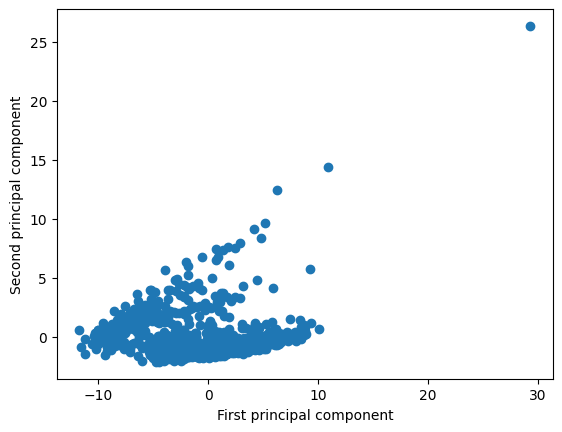

In [ ]:
plt.scatter(projection[:, 0], projection[:, 1], )
plt.xlabel('First principal component')
plt.ylabel('Second principal component')
plt.show()

In [ ]:
projection[:,0].shape

(984,)

In [ ]:
projection[:,1].shape

(984,)

<Axes: >

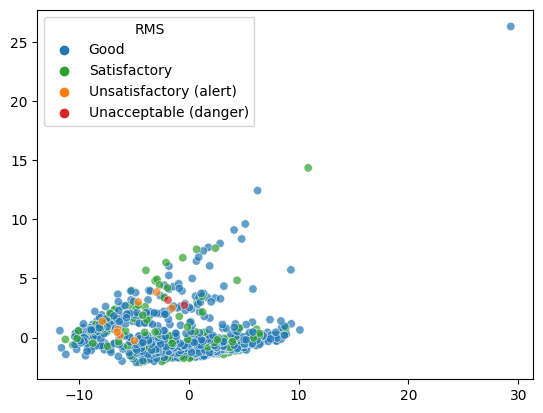

In [ ]:
sns.scatterplot(
    x=projection[:,0], y=projection[:,1],
    hue=tokenized,
    palette=custom_palette,
    #data=projection,
    legend="full",
    alpha=0.7
)

### With PCA library
[Install and Info](https://pypi.org/project/pca/)

In [ ]:
model = betterPCA()
pca_res = model.fit_transform(X)


pca_res

[pca] >Column labels are auto-completed.
[pca] >Row labels are auto-completed.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [10241] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [4486] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [10241] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[4486]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


{'loadings':                1         2         3         4         5         6         7  \
 PC1    -0.000431 -0.004372 -0.008991 -0.003980 -0.002402 -0.004633 -0.004561   
 PC2    -0.000092 -0.001553 -0.006591 -0.002157 -0.000435 -0.001846 -0.002549   
 PC3    -0.001161 -0.000006  0.000090  0.001517  0.000181  0.000780  0.002129   
 PC4    -0.000582  0.002262  0.001907  0.000395  0.001628  0.001500  0.003400   
 PC5    -0.001272 -0.004276 -0.009122 -0.002687 -0.002524 -0.004443  0.000375   
 ...          ...       ...       ...       ...       ...       ...       ...   
 PC4482  0.000450 -0.015576 -0.017698 -0.007955 -0.001223  0.004644  0.003514   
 PC4483 -0.002867 -0.000713  0.004017 -0.010342 -0.003117 -0.003857  0.010395   
 PC4484 -0.003046  0.001240 -0.004862 -0.012548  0.005970  0.006093  0.006788   
 PC4485  0.002422  0.000717 -0.000687 -0.007259 -0.003889 -0.011219  0.005110   
 PC4486  0.000253  0.010630 -0.007706 -0.014723 -0.006297  0.013017 -0.002174   
 
              

In [ ]:
pca_res["topfeat"].to_csv(f"/content/drive/MyDrive/loadings-PCA-{test_to_check}-fixed.csv")


In [ ]:
pca_res["topfeat"]

,PC,feature,loading,type
0,PC1,31,-0.031007,best
1,PC2,1010,-0.152509,best
2,PC3,1018,-0.127041,best
3,PC4,1011,0.208769,best
4,PC5,1003,0.160704,best
...,...,...,...,...
11382,PC2499,10233,0.042450,weak
11383,PC1853,10234,-0.034429,weak
11384,PC720,10235,-0.036912,weak
11385,PC4098,10237,-0.037777,weak


In [ ]:
pca_res["explained_var"]

array([0.03872506, 0.04476259, 0.04777566, ..., 0.99999432, 1.        ,
       1.        ])

In [ ]:
pca_res["variance_ratio"]

array([3.87250613e-02, 6.03753230e-03, 3.01306180e-03, ...,
       5.80450492e-06, 5.68246412e-06, 0.00000000e+00])

In [ ]:
#fig, ax = model.scatter(PC=[0,1])

## Use TSNE

In [ ]:
from sklearn.manifold import TSNE

### Over everything (It will take its time)

In [ ]:
tsne = TSNE(n_components = 2)
tsne_res = tsne.fit_transform(X)

In [ ]:
tsne_res

array([[-6.438874  ,  7.454953  ],
       [ 1.4325515 ,  2.964208  ],
       [-0.07009482,  1.6300343 ],
       ...,
       [ 7.7537665 ,  1.130982  ],
       [ 6.9994955 ,  1.9711753 ],
       [ 7.104163  ,  2.1064413 ]], dtype=float32)

In [ ]:
tsne_df = pd.DataFrame(tsne_res, columns=['tsne-2d-one', 'tsne-2d-two'])

In [ ]:
tsne_df

,tsne-2d-one,tsne-2d-two
0,-6.438874,7.454953
1,1.432552,2.964208
2,-0.070095,1.630034
3,0.580156,4.500815
4,-3.166657,4.623641
...,...,...
979,7.095268,0.416556
980,7.542512,0.767212
981,7.753767,1.130982
982,6.999496,1.971175


In [ ]:
tokenized.value_counts()

Good                      811
Satisfactory              163
Unsatisfactory (alert)      8
Unacceptable (danger)       2
Name: RMS, dtype: int64

<Axes: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

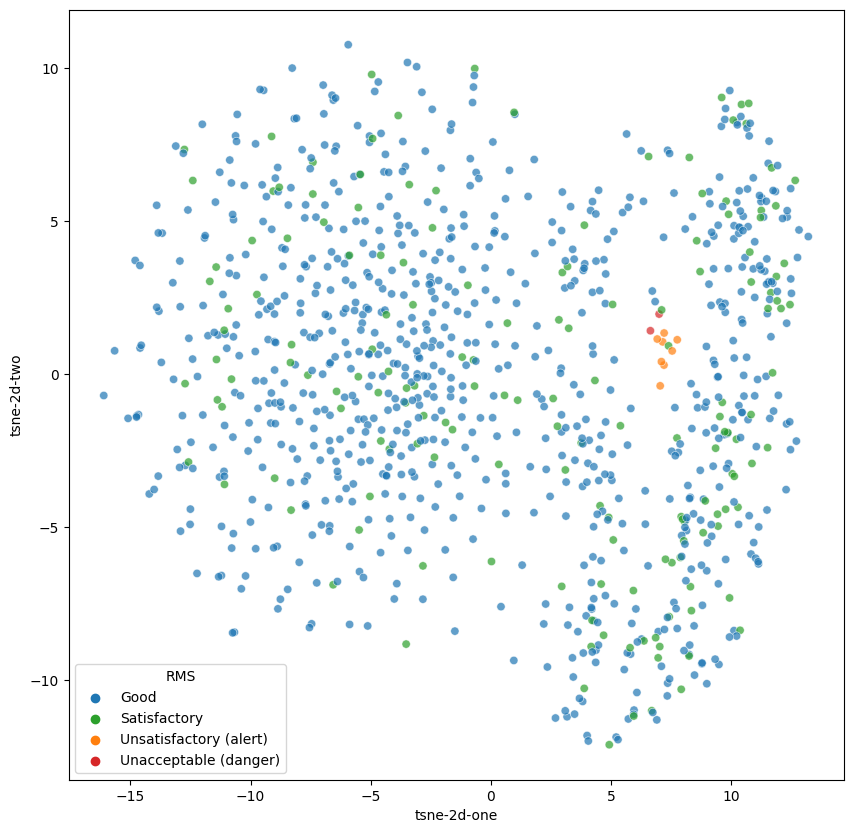

In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue=tokenized,
    palette=custom_palette,
    data=tsne_df,
    legend="full",
    alpha=0.7
)

### Over the previous PCA transformation

In [ ]:
projection

array([[ 5.7957058 ,  1.30154086,  0.68747849,  0.42654868],
       [ 0.79362712, -1.18044128,  0.46116297,  1.23550663],
       [-1.94387399, -1.50629636,  0.05652432,  1.48169046],
       ...,
       [-6.51695185,  0.46056265, -0.60365648,  2.71673599],
       [-1.88731775,  3.17041406, -0.12333468,  4.06682843],
       [ 0.72012426,  7.46589127,  0.93766811,  1.91559261]])

In [ ]:
tsnePCA = TSNE(n_components = 2)
tsnePCA_res = tsnePCA.fit_transform(projection)


In [ ]:
tsnePCA_df = pd.DataFrame(tsnePCA_res, columns=['tsnePCA-2d-one', 'tsnePCA-2d-two'])

<Axes: xlabel='tsnePCA-2d-one', ylabel='tsnePCA-2d-two'>

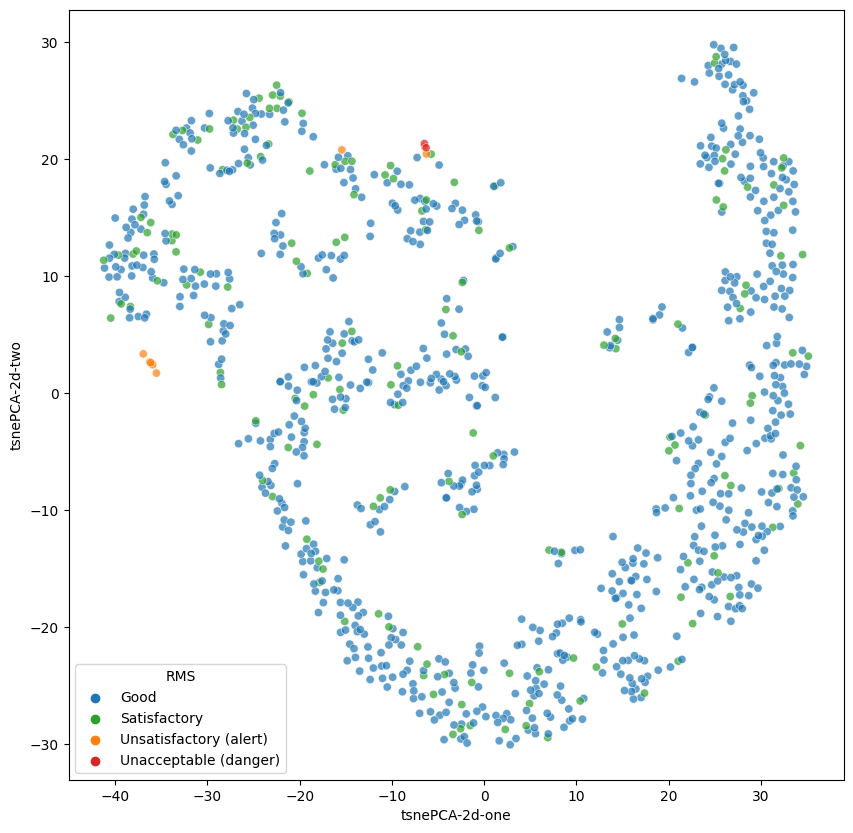

In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(
    x="tsnePCA-2d-one", y="tsnePCA-2d-two",
    hue=tokenized,
    palette=custom_palette,
    data=tsnePCA_df,
    legend="full",
    alpha=0.7
)

## Select K Best

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2

In [ ]:
X

array([[0.00736069, 0.04810775, 0.19452403, ..., 0.56675017, 0.44233868,
        0.09953225],
       [0.01079597, 0.0809075 , 0.17020873, ..., 0.3260267 , 0.25828431,
        0.10762901],
       [0.01242672, 0.11743003, 0.22523782, ..., 0.08527754, 0.43346584,
        0.25253103],
       ...,
       [0.01376968, 0.0713753 , 0.30501622, ..., 0.04644405, 0.14899647,
        0.39228452],
       [0.01646488, 0.25255761, 0.18152931, ..., 0.33813674, 0.15901263,
        0.45059829],
       [0.01325791, 0.12042465, 0.30746902, ..., 0.64401745, 0.14364645,
        0.71451115]])

In [ ]:
X_df = pd.DataFrame(X)
X_df

,0,1,2,3,4,5,6,7,8,9,...,10231,10232,10233,10234,10235,10236,10237,10238,10239,10240
0,0.007361,0.048108,0.194524,0.160220,0.033383,0.075734,0.167811,0.015068,0.186099,0.270557,...,0.197716,0.152981,0.158371,0.468361,0.201468,0.259279,0.390899,0.566750,0.442339,0.099532
1,0.010796,0.080907,0.170209,0.063117,0.086565,0.217150,0.089154,0.180845,0.323066,0.116277,...,0.245482,0.313938,0.056497,0.206636,0.035558,0.302324,0.173343,0.326027,0.258284,0.107629
2,0.012427,0.117430,0.225238,0.158143,0.067269,0.212737,0.104867,0.430619,0.436467,0.220182,...,0.463377,0.100093,0.114336,0.105896,0.289368,0.465794,0.237748,0.085278,0.433466,0.252531
3,0.013108,0.035093,0.329647,0.066358,0.097244,0.116266,0.112130,0.202480,0.148524,0.209173,...,0.186802,0.588303,0.363706,0.195817,0.685365,0.452225,0.413264,0.129609,0.431095,0.342096
4,0.009102,0.065883,0.216186,0.076136,0.080858,0.098396,0.034866,0.086054,0.200991,0.325648,...,0.091967,0.409107,0.219953,0.224055,0.133605,0.151667,0.495913,0.111946,0.255904,0.367543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6319,0.012319,0.085994,0.373771,0.029574,0.039884,0.174746,0.087096,0.142965,0.194748,0.116166,...,0.139316,0.069511,0.188733,0.188692,0.161013,0.005328,0.304738,0.371153,0.201333,0.371002
6320,0.014955,0.186089,0.213848,0.054475,0.033261,0.164773,0.141840,0.249907,0.171670,0.130435,...,0.271616,0.218637,0.291833,0.331742,0.359267,0.263590,0.212752,0.300063,0.283967,0.025421
6321,0.013770,0.071375,0.305016,0.256772,0.090904,0.105708,0.137344,0.209604,0.587604,0.048507,...,0.297582,0.175091,0.110424,0.232770,0.178956,0.189979,0.496897,0.046444,0.148996,0.392285
6322,0.016465,0.252558,0.181529,0.054543,0.033910,0.066582,0.136108,0.286618,0.075933,0.321739,...,0.033209,0.472089,0.383968,0.197219,0.224081,0.269839,0.104714,0.338137,0.159013,0.450598


In [ ]:
sel = SelectKBest(chi2,k=10)
X_kbest = sel.fit_transform(X_df, tokenized) # Y.astype('int'))
X_kbest = pd.DataFrame(X_kbest)
X_kbest.head()

,0,1,2,3,4,5,6,7,8,9
0,0.048108,0.009379,0.011868,0.339001,0.014289,0.010078,0.013626,0.020256,0.018578,0.027677
1,0.080907,0.024127,0.031373,0.417644,0.008426,0.076158,0.039331,0.091841,0.032351,0.018296
2,0.117430,0.050449,0.038756,0.463613,0.029157,0.051227,0.039696,0.025276,0.032999,0.035957
3,0.035093,0.024719,0.020686,0.439886,0.083334,0.081437,0.043778,0.110227,0.035212,0.036693
4,0.065883,0.032426,0.019787,0.537206,0.048708,0.008388,0.050367,0.018093,0.041772,0.021540


In [ ]:
mask = sel.get_support()

In [ ]:
selected_columns = X_df.columns[mask]

In [ ]:
selected_columns

Int64Index([1, 711, 948, 1009, 4037, 4489, 4490, 4496, 4511, 4512], dtype='int64')

In [ ]:
pd.DataFrame(sel.scores_)[mask].sort_values(0, ascending=False).apply(lambda x: round(x, 5))

,0
711,76.95660
1,52.73733
948,47.16216
4511,24.96895
4496,20.67175
4512,20.59872
4489,19.61724
4490,18.99177
1009,17.07909
4037,16.85579


In [ ]:
pd.DataFrame(sel.scores_)[mask].sort_values(0, ascending=False)

,0
711,76.956601
1,52.737332
948,47.162159
4511,24.968948
4496,20.671750
4512,20.598724
4489,19.617237
4490,18.991773
1009,17.079090
4037,16.855793


## For Test3-CH3, choose the interesting points

In [ ]:
tsnePCA_df

,tsnePCA-2d-one,tsnePCA-2d-two
0,33.374310,29.723967
1,-34.470402,31.581984
2,-5.353730,36.885387
3,-14.315169,39.523678
4,62.257927,6.366529
...,...,...
6319,64.216072,-18.067184
6320,31.644821,-42.589016
6321,21.258493,-42.222939
6322,-48.072491,-49.547203


In [ ]:
tsnePCA_df["RMS"] = Y

In [ ]:
tsnePCA_df["Filename"] = data["Filename"]

In [ ]:
tokenized

0               Good
1               Good
2       Satisfactory
3               Good
4       Satisfactory
            ...     
6319            Good
6320            Good
6321            Good
6322    Satisfactory
6323    Satisfactory
Name: RMS, Length: 6324, dtype: object

In [ ]:
filtered = tsnePCA_df[
    (tsnePCA_df["tsnePCA-2d-one"] > 20)
    &
    (tsnePCA_df["tsnePCA-2d-two"] > 50)
    ]

<ipython-input-110-67e0fb93ab64>:2: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  sns.scatterplot(


<Axes: xlabel='tsnePCA-2d-one', ylabel='tsnePCA-2d-two'>

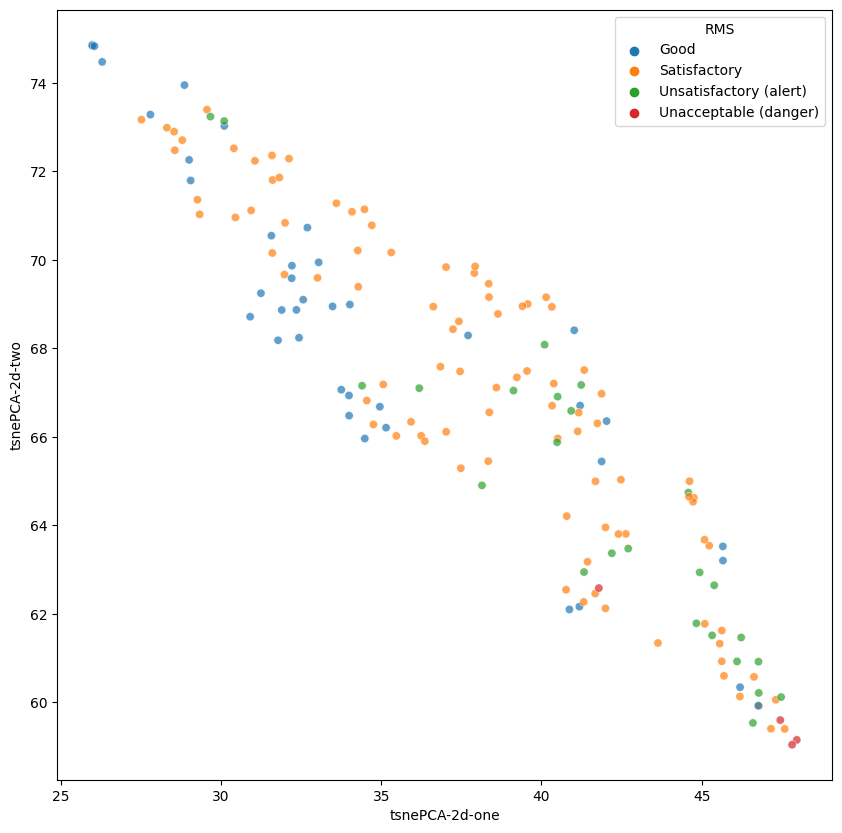

In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(
    x="tsnePCA-2d-one", y="tsnePCA-2d-two",
    hue=tokenized,
    palette=sns.color_palette(),
    data=filtered,
    legend="full",
    alpha=0.7
)

In [ ]:
filtered

,tsnePCA-2d-one,tsnePCA-2d-two,RMS,Filename
813,31.244444,69.245735,0.970453,2004.04.17.00.02.55
825,34.486343,65.962936,1.188294,2004.04.16.23.52.55
826,30.908306,68.715034,1.697124,2004.04.16.23.42.55
840,32.211372,69.867264,1.534403,2004.04.17.01.12.55
841,27.794624,73.280060,1.199807,2004.04.17.02.42.55
...,...,...,...,...
995,47.969376,59.155186,98.199024,2004.04.18.02.22.55
996,36.847652,67.585159,2.334934,2004.04.18.00.12.55
997,46.599865,59.537941,5.665934,2004.04.18.00.22.55
998,47.822418,59.045563,89.106880,2004.04.18.02.32.55


In [ ]:
filtered.to_csv(f"/content/drive/MyDrive/nimbus-{test_to_check}-fixed.csv")